In [2]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import geopandas as gpd
from pykrige.uk import UniversalKriging
from sklearn.metrics import mean_squared_error
from scipy.optimize import minimize
from sklearn.model_selection import KFold
import pykrige

In [16]:
# Load data and shapefile
df = pd.read_csv("final_station_mswp.csv")
indo = gpd.read_file("peta_shp_indonesia.shp")

# Filter for year
df_1997 = df[(df['year'] == 1997) & df['final_rainfall'].notna()]
df_2013 = df[(df['year'] == 2013) & df['final_rainfall'].notna()]
df_2000 = df[(df['year'] == 2000) & df['final_rainfall'].notna()]

# Get Java bounding box (adjust if needed)
minx, miny, maxx, maxy = 105, -9, 115, -5.8
java = indo.cx[minx:maxx, miny:maxy]

# Create GeoDataFrame for stations
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['lon'], df['lat']), crs=java.crs)
# Use Java boundary as coastline
coastline = java.boundary.unary_union
# Calculate distance in degrees
#gdf['dist_to_coast_deg'] = gdf.geometry.apply(lambda x: x.distance(coastline))
# Add to original DataFrame
#df['dist_to_coast'] = gdf['dist_to_coast_deg'] * 111.32  # Convert degrees to km

vmax = int(np.ceil(df['final_rainfall'].max() / 100.0)) * 100

C:\Users\allam\AppData\Local\Temp\ipykernel_9960\3333629336.py:17: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  coastline = java.boundary.unary_union


#### SEMUA TAHUN

In [21]:
#variogram_models = ['gaussian', 'spherical', 'exponential']
variogram_models = ['exponential']
years = range(1995, 2015)
all_kriging_results = []

for year in years:
    df_year = df[(df['year'] == year) & df['final_rainfall'].notna()]
    if df_year.empty:
        continue
    print(f"\n=== YEAR {year} ===")
    
    for month in range(1, 13):
        df_month = df_year[df_year['month'] == month]
        if df_month.empty:
            continue

        # Preprocessing - outlier removal and deduplication (WAJIB)
        q1, q3 = np.percentile(df_month['final_rainfall'], [25, 75])
        iqr = q3 - q1
        mask = (df_month['final_rainfall'] >= q1 - 3*iqr) & (df_month['final_rainfall'] <= q3 + 3*iqr)
        df_month_masked = df_month[mask].copy()
        df_month_masked = df_month_masked.groupby(['lon', 'lat'], as_index=False).agg({
            'final_rainfall': 'mean',
            'dist_to_coast': 'mean',
            'elev': 'mean'
        })

        # Data points (WAJIB)
        lons = df_month_masked['lon'].values
        lats = df_month_masked['lat'].values
        values = df_month_masked['final_rainfall'].values
        drift_dist = df_month_masked['dist_to_coast'].values
        drift_elev = df_month_masked['elev'].values

        print(f"Year {year} Month {month}: {len(values)} stations")
        print(f"  Drift shapes - dist: {drift_dist.shape}, elev: {drift_elev.shape}")
        print(f"  NaN in drift? dist: {np.isnan(drift_dist).any()}, elev: {np.isnan(drift_elev).any()}")

        # =======================================================================
        # 1. CROSS-VALIDATION DENGAN DUA DRIFT VARIABEL (WAJIB)
        # =======================================================================
        best_model = None
        best_rmse = np.inf
        
        for model in variogram_models:
            preds = np.full_like(values, np.nan)
            kf = KFold(n_splits=min(5, len(values)), shuffle=True, random_state=42)
            
            for train_idx, test_idx in kf.split(values):
                try:
                    # Gunakan DUA drift: [drift_dist, drift_elev]
                    UK_cv = UniversalKriging(
                        lons[train_idx], 
                        lats[train_idx], 
                        values[train_idx],
                        variogram_model=model,
                        drift_terms=['specified'],
                        specified_drift=[drift_dist[train_idx], drift_elev[train_idx]],
                        verbose=False,
                        enable_plotting=False
                    )
                    
                    # Prediksi dengan drift di titik uji
                    pred, _ = UK_cv.execute(
                        'points', 
                        lons[test_idx], 
                        lats[test_idx],
                        specified_drift_arrays=[drift_dist[test_idx], drift_elev[test_idx]]
                    )
                    preds[test_idx] = pred
                    
                except Exception as e:
                    print(f"    CV error ({model}): {str(e)}")
                    preds[test_idx] = np.nanmedian(values)
            
            # Evaluasi model (WAJIB)
            valid_mask = ~np.isnan(preds)
            if valid_mask.sum() > 0:
                rmse = np.sqrt(mean_squared_error(values[valid_mask], preds[valid_mask]))
                if rmse < best_rmse:
                    best_rmse = rmse
                    best_model = model
            else:
                print(f"    All predictions NaN for {model}")

        print(f"  Best model: {best_model}, RMSE: {best_rmse:.2f}")

        # =======================================================================
        # 2. PREDIKSI GRID DENGAN DUA DRIFT VARIABEL (WAJIB)
        # =======================================================================
        grid_lon = np.arange(minx, maxx + 0.1, 0.1)
        grid_lat = np.arange(miny, maxy + 0.1, 0.1)
        gridx, gridy = np.meshgrid(grid_lon, grid_lat)
        
        # Siapkan grid untuk drift (2D array) - WAJIB DIPERTAHANKAN
        grid_drift_dist = np.full(gridx.shape, np.nanmedian(drift_dist))
        grid_drift_elev = np.full(gridx.shape, np.nanmedian(drift_elev))
        
        try:
            # Inisialisasi dengan DUA drift
            UK = UniversalKriging(
                lons, lats, values,
                variogram_model=best_model if best_model else 'gaussian',
                drift_terms=['specified'],
                specified_drift=[drift_dist, drift_elev],
                verbose=False,
                enable_plotting=False
            )
            
            # Prediksi grid dengan drift
            z, ss = UK.execute(
                'grid', 
                grid_lon, 
                grid_lat,
                specified_drift_arrays=[grid_drift_dist, grid_drift_elev]
            )
            
        except Exception as e:
            print(f"  Grid kriging failed: {str(e)}")
            # Fallback ke ordinary kriging jika gagal
            try:
                print("  Attempting fallback with ordinary kriging")
                UK_fallback = UniversalKriging(
                    lons, lats, values,
                    variogram_model=best_model if best_model else 'gaussian',
                    verbose=False
                )
                z, ss = UK_fallback.execute('grid', grid_lon, grid_lat)
            except Exception as e2:
                print(f"  Fallback failed: {str(e2)}")
                z = np.full(gridx.shape, np.nanmedian(values))
                ss = np.full(gridx.shape, np.nan)

        # Post-processing (WAJIB)
        z = np.nan_to_num(z, nan=np.nanmedian(values), posinf=vmax, neginf=0)
        z = np.clip(z, 0, vmax)

        # Simpan hasil (WAJIB)
        result_df = pd.DataFrame({
            'year': year,
            'month': month,
            'lon': gridx.ravel(),
            'lat': gridy.ravel(),
            'rainfall': z.ravel(),
            'uncertainty': ss.ravel(),
            'variogram_model': best_model if best_model else 'none',
            'rmse': best_rmse
        })
        all_kriging_results.append(result_df)

        # =======================================================================
        # 3. PLOTTING
        # =======================================================================
        fig, ax = plt.subplots(figsize=(8, 4))
        ax.set_facecolor('#b3e0ff')
        java.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.8)
        im = ax.pcolormesh(gridx, gridy, z, cmap='viridis', shading='auto', alpha=0.7, vmin=0, vmax=vmax)
        ax.scatter(lons, lats, c=values, edgecolor='k', cmap='viridis', label='Stations', s=10)
        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)
        ax.set_title(f'Universal Kriging Rainfall ({year}, Month {month})\nDrifts: dist_coast + elev | Model: {best_model}')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        cbar = fig.colorbar(im, ax=ax, label='Rainfall (mm/month)', location='bottom')
        plt.legend()
        plt.savefig(f"UK_results/Kriging_{year}_{month:02d}.png")
        plt.tight_layout()
        plt.close()

# Gabungkan dan simpan hasil akhir
all_kriging_results_df = pd.concat(all_kriging_results, ignore_index=True)
all_kriging_results_df.to_csv("UK_results/All_Kriging_Results_1995_2014-Exponential.csv", index=False)


=== YEAR 1995 ===
Year 1995 Month 1: 441 stations
  Drift shapes - dist: (441,), elev: (441,)
  NaN in drift? dist: False, elev: False
  Best model: exponential, RMSE: 66.84
Year 1995 Month 2: 441 stations
  Drift shapes - dist: (441,), elev: (441,)
  NaN in drift? dist: False, elev: False
  Best model: exponential, RMSE: 53.20
Year 1995 Month 3: 441 stations
  Drift shapes - dist: (441,), elev: (441,)
  NaN in drift? dist: False, elev: False
  Best model: exponential, RMSE: 61.06
Year 1995 Month 4: 441 stations
  Drift shapes - dist: (441,), elev: (441,)
  NaN in drift? dist: False, elev: False
  Best model: exponential, RMSE: 52.44
Year 1995 Month 5: 441 stations
  Drift shapes - dist: (441,), elev: (441,)
  NaN in drift? dist: False, elev: False
  Best model: exponential, RMSE: 47.26
Year 1995 Month 6: 441 stations
  Drift shapes - dist: (441,), elev: (441,)
  NaN in drift? dist: False, elev: False
  Best model: exponential, RMSE: 48.48
Year 1995 Month 7: 431 stations
  Drift shape

In [22]:
# Assume interp_df and java are already defined
all_kriging_results_df = pd.read_csv("UK_results/All_Kriging_Results_1995_2014-Exponential.csv")
# If not, load java shapefile and filter to Java bounding box
indo = gpd.read_file("peta_shp_indonesia.shp")
minx, miny, maxx, maxy = 105, -9, 115, -5.8
java = indo.cx[minx:maxx, miny:maxy]

# Create GeoDataFrame from interp_df grid points
kriging_results = gpd.GeoDataFrame(
    all_kriging_results_df,
    geometry=gpd.points_from_xy(all_kriging_results_df['lon'], all_kriging_results_df['lat']),
    crs=java.crs
)
# This line is missing in your code:
kriging_results = gpd.sjoin(kriging_results, java, predicate='within', how='inner')
kriging_results = kriging_results.drop(columns=['geometry', 'index_right'], errors='ignore')

# Save to CSV
output_folder = "UK_results/Masked/"
os.makedirs(output_folder, exist_ok=True)
kriging_results.to_csv(os.path.join(output_folder, "kriging_results_masked-Exponential.csv"), index=False)
#print(f"Masked kriging grid saved to {os.path.join(output_folder, 'kriging_interp_masked.csv')}")"""

## PLOT AND MASKING

##### Masking

In [5]:
"""# Assume interp_df and java are already defined
# If not, load java shapefile and filter to Java bounding box
indo = gpd.read_file("peta_shp_indonesia.shp")
minx, miny, maxx, maxy = 105, -9, 115, -5.8
java = indo.cx[minx:maxx, miny:maxy]

# Create GeoDataFrame from interp_df grid points
interp_1997 = gpd.GeoDataFrame(
    interp_1997,
    geometry=gpd.points_from_xy(interp_1997['lon'], interp_1997['lat']),
    crs=java.crs
)
interp_2000 = gpd.GeoDataFrame(
    interp_2000,
    geometry=gpd.points_from_xy(interp_2000['lon'], interp_2000['lat']),
    crs=java.crs
)
interp_2013 = gpd.GeoDataFrame(
    interp_2013,
    geometry=gpd.points_from_xy(interp_2000['lon'], interp_2000['lat']),
    crs=java.crs
)

# Use spatial join for fast masking
interp_1997 = gpd.sjoin(interp_1997, java, predicate='within', how='inner')
interp_2000 = gpd.sjoin(interp_2000, java, predicate='within', how='inner')
interp_2013 = gpd.sjoin(interp_2013, java, predicate='within', how='inner')

# Drop geometry and join columns
interp_1997 = interp_1997.drop(columns=['geometry', 'index_right'], errors='ignore')
interp_2000 = interp_2000.drop(columns=['geometry', 'index_right'], errors='ignore')
interp_2013 = interp_2013.drop(columns=['geometry', 'index_right'], errors='ignore')

# Save to CSV
output_folder = "OK_results/Masked/"
os.makedirs(output_folder, exist_ok=True)
interp_1997.to_csv(os.path.join(output_folder, "1997_OK_masked.csv"), index=False)
interp_2000.to_csv(os.path.join(output_folder, "2000_OK_masked.csv"), index=False)
interp_2013.to_csv(os.path.join(output_folder, "2013_OK_masked.csv"), index=False)
#print(f"Masked kriging grid saved to {os.path.join(output_folder, 'kriging_interp_masked.csv')}")"""

'# Assume interp_df and java are already defined\n# If not, load java shapefile and filter to Java bounding box\nindo = gpd.read_file("peta_shp_indonesia.shp")\nminx, miny, maxx, maxy = 105, -9, 115, -5.8\njava = indo.cx[minx:maxx, miny:maxy]\n\n# Create GeoDataFrame from interp_df grid points\ninterp_1997 = gpd.GeoDataFrame(\n    interp_1997,\n    geometry=gpd.points_from_xy(interp_1997[\'lon\'], interp_1997[\'lat\']),\n    crs=java.crs\n)\ninterp_2000 = gpd.GeoDataFrame(\n    interp_2000,\n    geometry=gpd.points_from_xy(interp_2000[\'lon\'], interp_2000[\'lat\']),\n    crs=java.crs\n)\ninterp_2013 = gpd.GeoDataFrame(\n    interp_2013,\n    geometry=gpd.points_from_xy(interp_2000[\'lon\'], interp_2000[\'lat\']),\n    crs=java.crs\n)\n\n# Use spatial join for fast masking\ninterp_1997 = gpd.sjoin(interp_1997, java, predicate=\'within\', how=\'inner\')\ninterp_2000 = gpd.sjoin(interp_2000, java, predicate=\'within\', how=\'inner\')\ninterp_2013 = gpd.sjoin(interp_2013, java, predicate=

### OK RESULT PLOT

In [9]:
#ok_interp = interp_masked.copy()
uk_results = pd.read_csv("UK_results/Masked/kriging_results_masked.csv")
uk_results['month'] = uk_results['month'].astype(int)
desimals = 1
uk_results['lat'] = uk_results['lat'].round(desimals)
uk_results['lon'] = uk_results['lon'].round(desimals)

In [10]:
uk_results = uk_results.drop(columns=['geometry', 'uncertainty', 'variogram_model', 'rmse'], errors='ignore')
uk_results['rainfall'] = uk_results['rainfall'].round(2)
uk_results

,year,month,lon,lat,rainfall
0,1995,1,105.0,-9.0,537.12
1,1995,1,105.1,-9.0,535.19
2,1995,1,105.2,-9.0,533.27
3,1995,1,105.3,-9.0,531.35
4,1995,1,105.4,-9.0,529.42
...,...,...,...,...,...
799915,2014,12,114.6,-5.8,27.78
799916,2014,12,114.7,-5.8,24.27
799917,2014,12,114.8,-5.8,20.77
799918,2014,12,114.9,-5.8,17.28


#### 1997

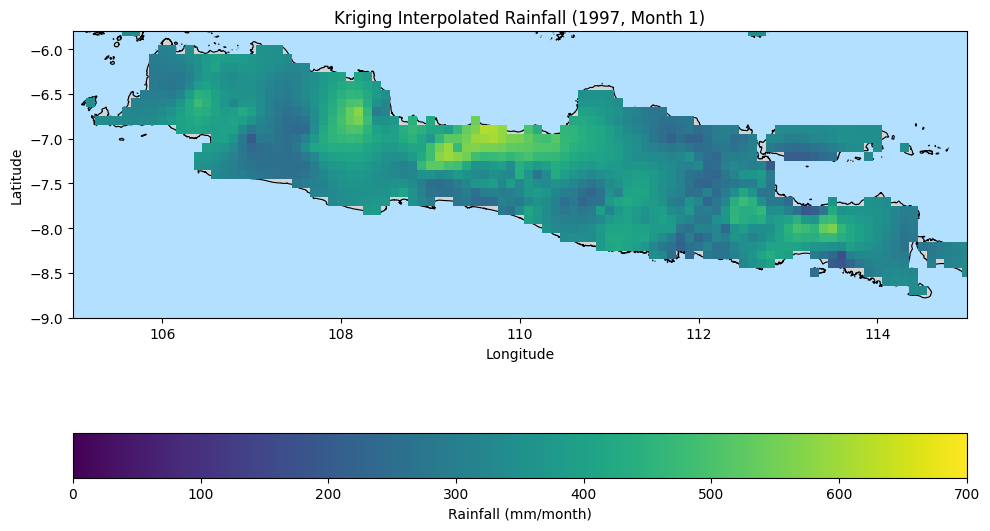

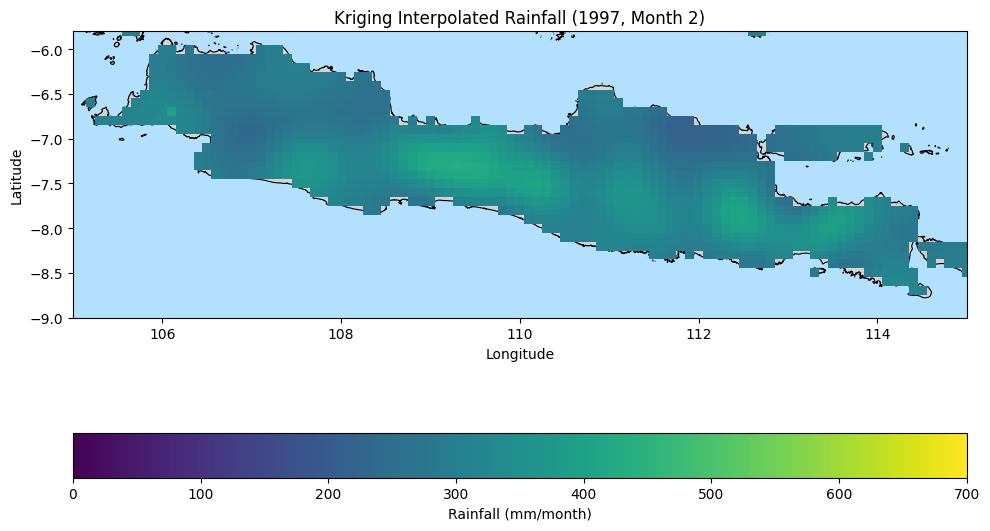

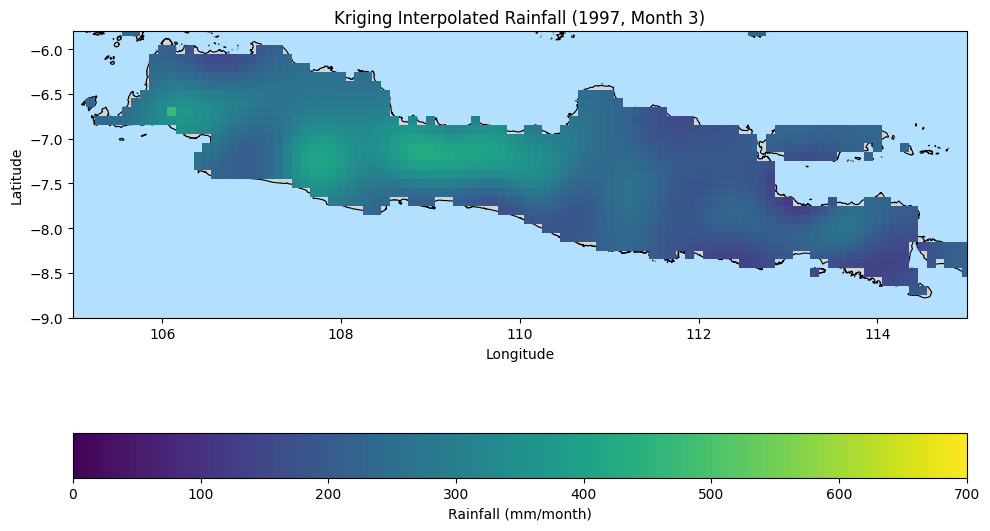

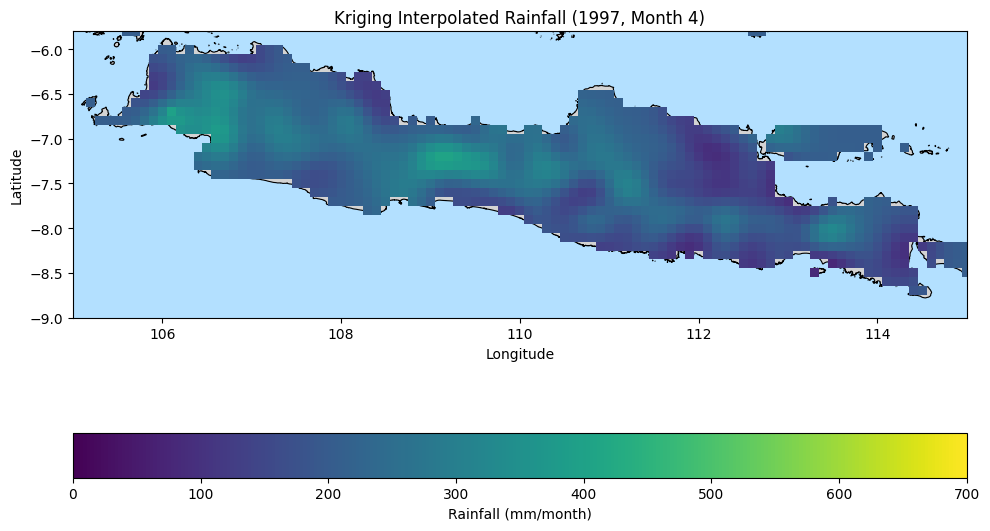

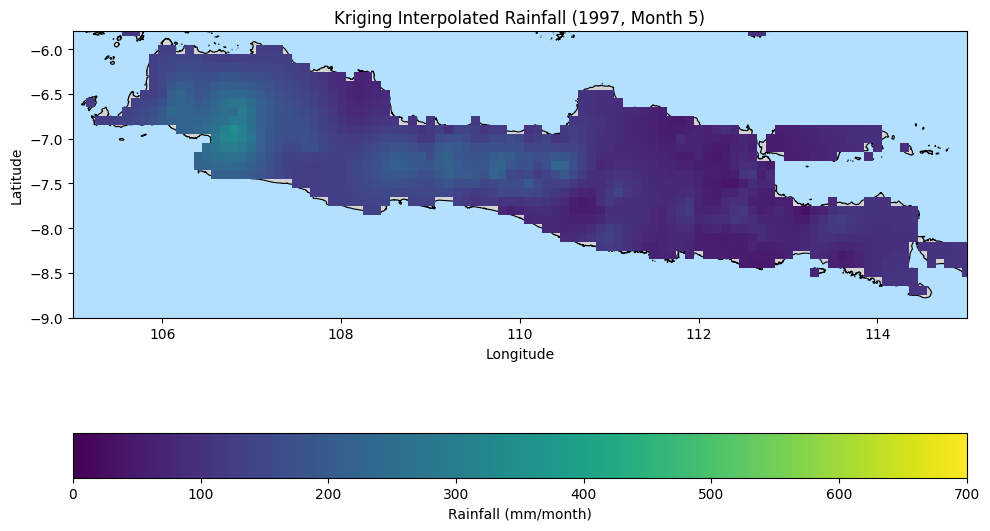

...

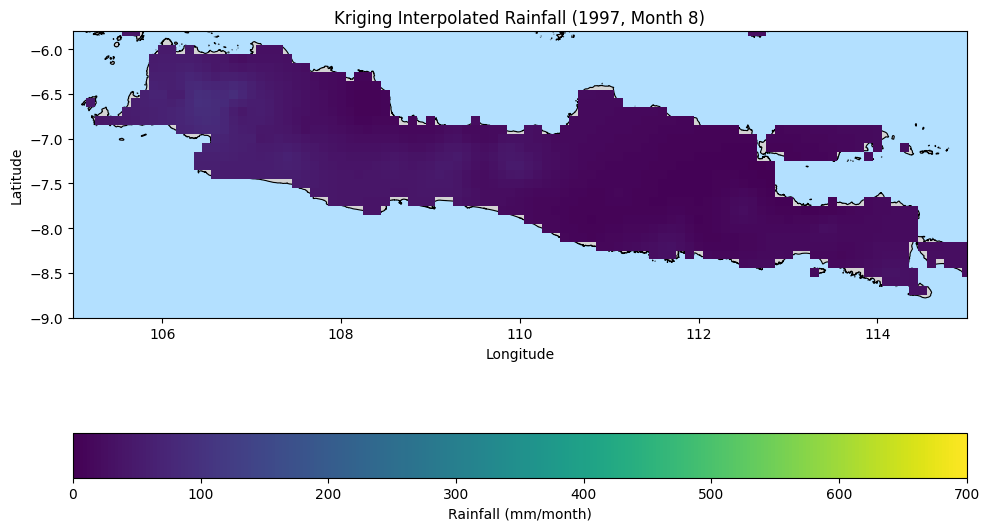

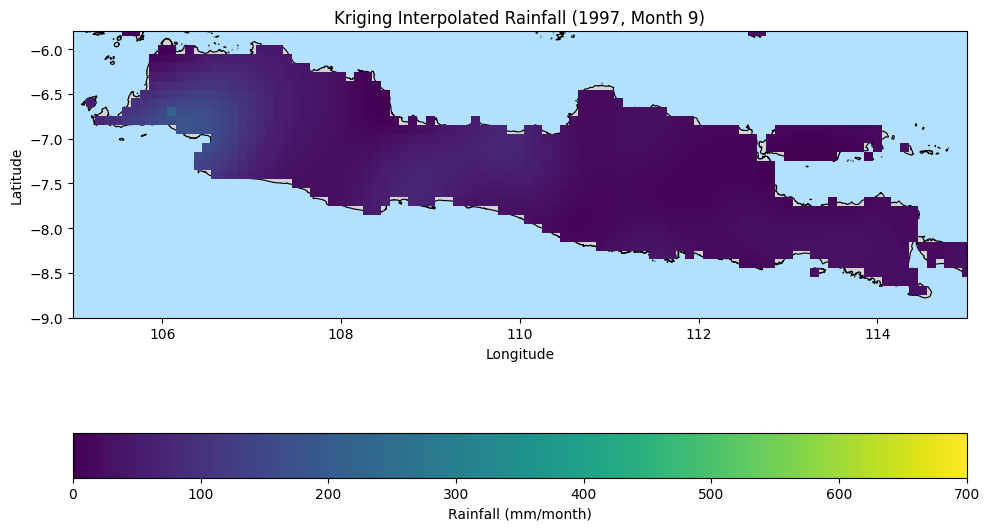

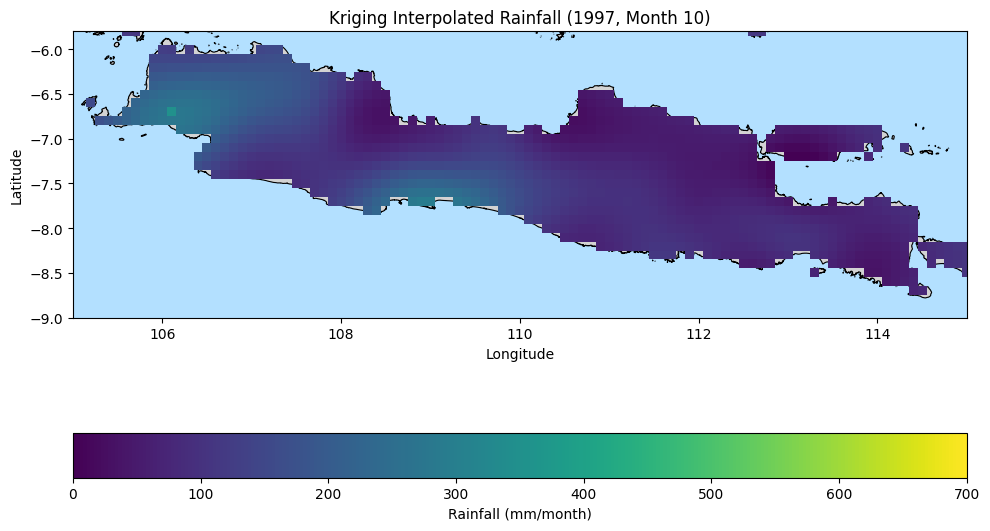

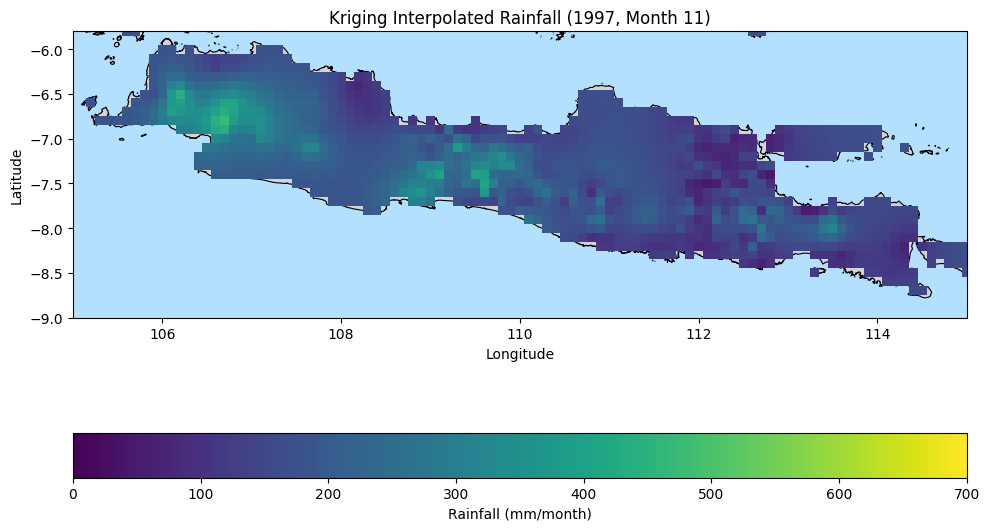

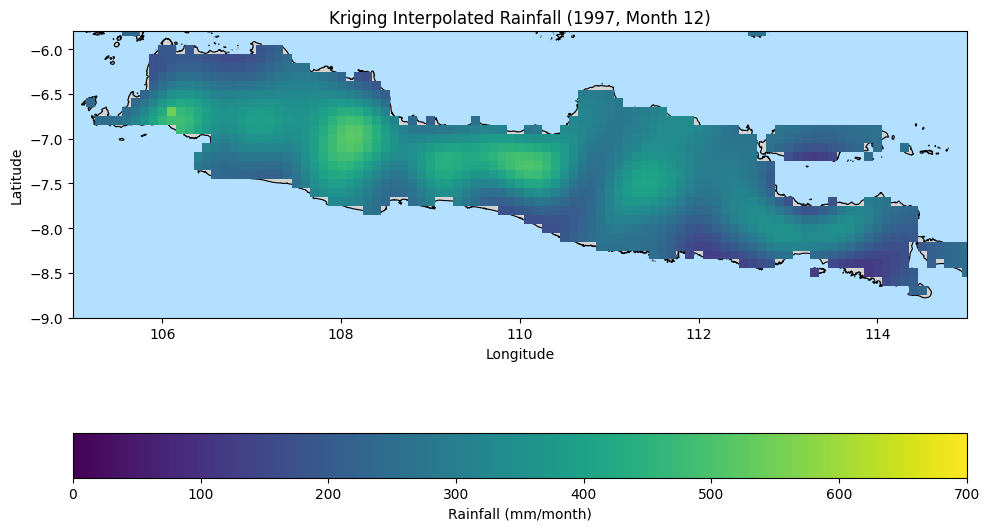

In [6]:
#ok_interp = interp_masked.copy()
ok_1997 = pd.read_csv("OK_results/Masked/1997_OK_masked.csv")
ok_1997['month'] = ok_1997['month'].astype(int)
desimals = 1
ok_1997['lat'] = ok_1997['lat'].round(desimals)
ok_1997['lon'] = ok_1997['lon'].round(desimals)

vmax = int(np.ceil(ok_1997['rainfall'].max() / 100.0)) * 100

# Loop through each month in interp_masked
for month in sorted(ok_1997['month'].unique()):
    df_month = ok_1997[ok_1997['month'] == month]
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.set_facecolor('#b3e0ff')
    java.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.8)
    sc = ax.scatter(
        df_month['lon'], df_month['lat'],
        c=df_month['rainfall'],
        cmap='viridis',
        marker='s',  # square marker
        s=42,        # adjust size as needed
        edgecolor='none',
        vmin=0,
        vmax=vmax
    )
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    ax.set_title(f'Kriging Interpolated Rainfall (1997, Month {month})')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    cbar = fig.colorbar(sc, ax=ax, label='Rainfall (mm/month)', location='bottom')
    plt.tight_layout()
    plt.show()

#### 2000

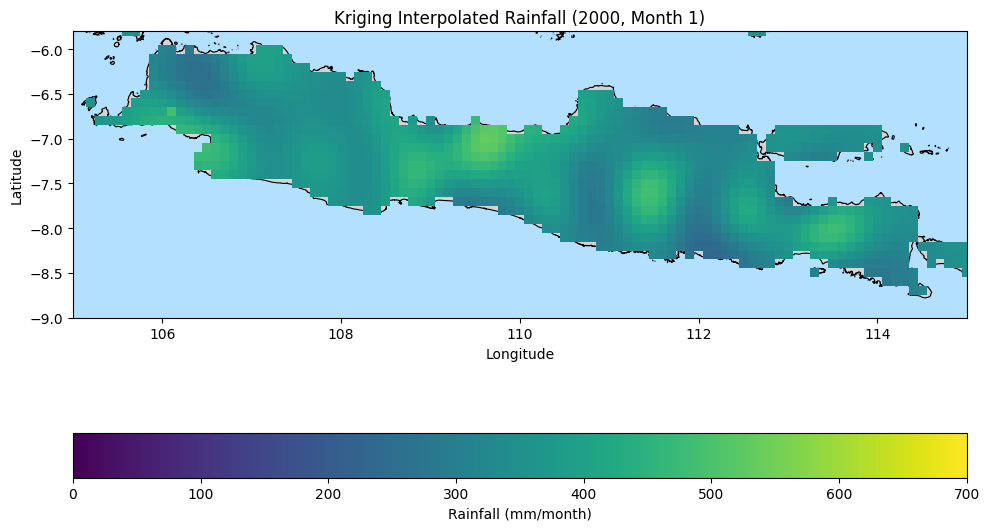

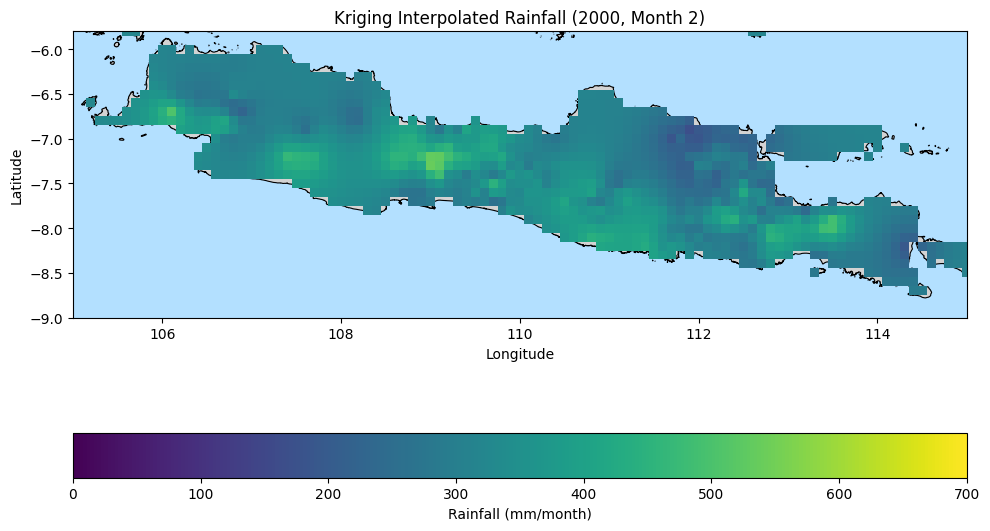

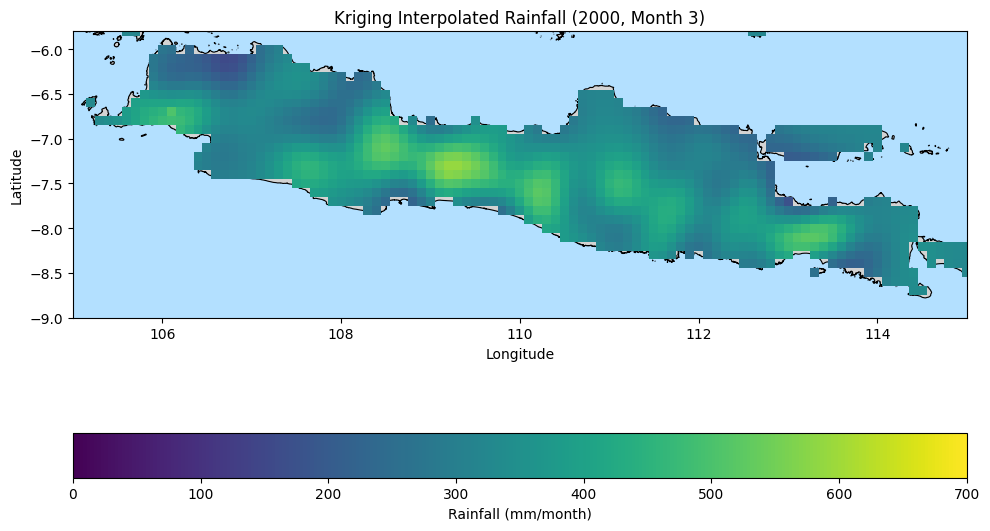

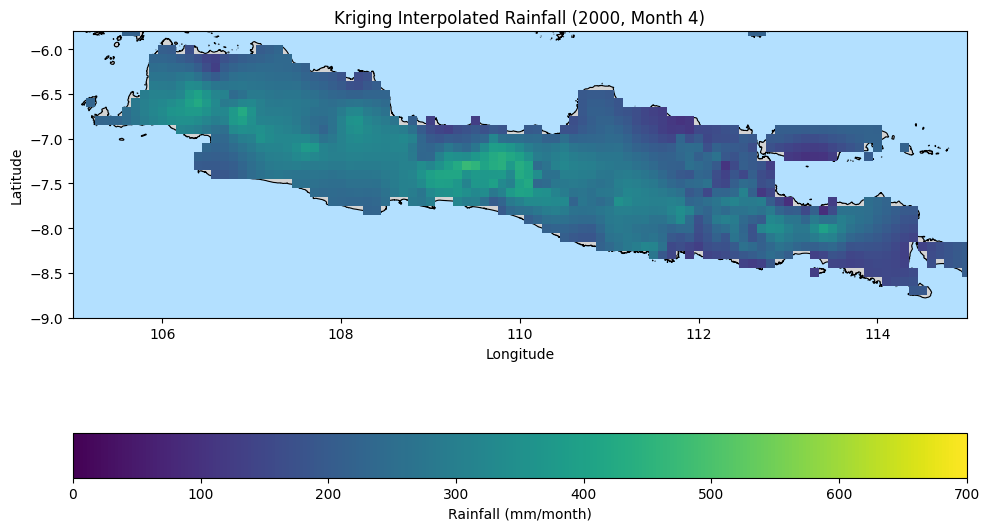

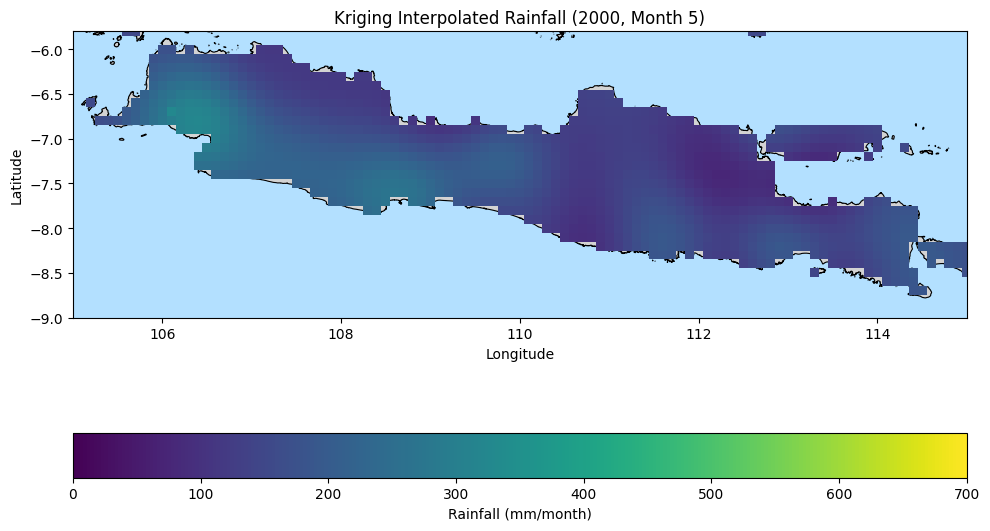

...

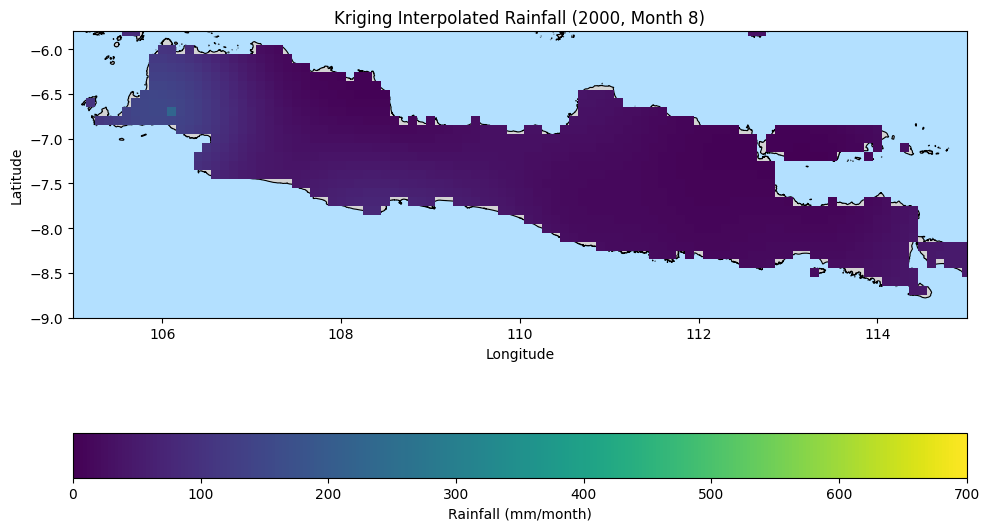

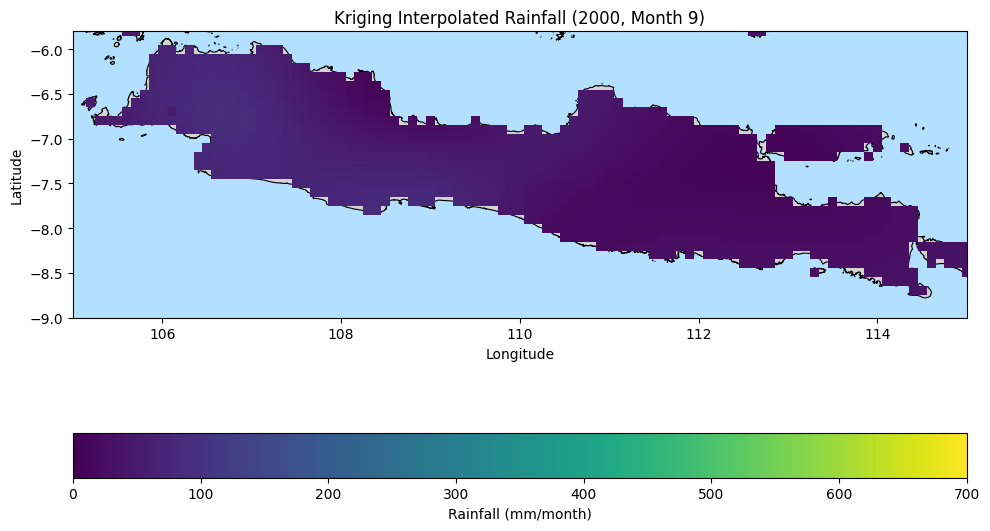

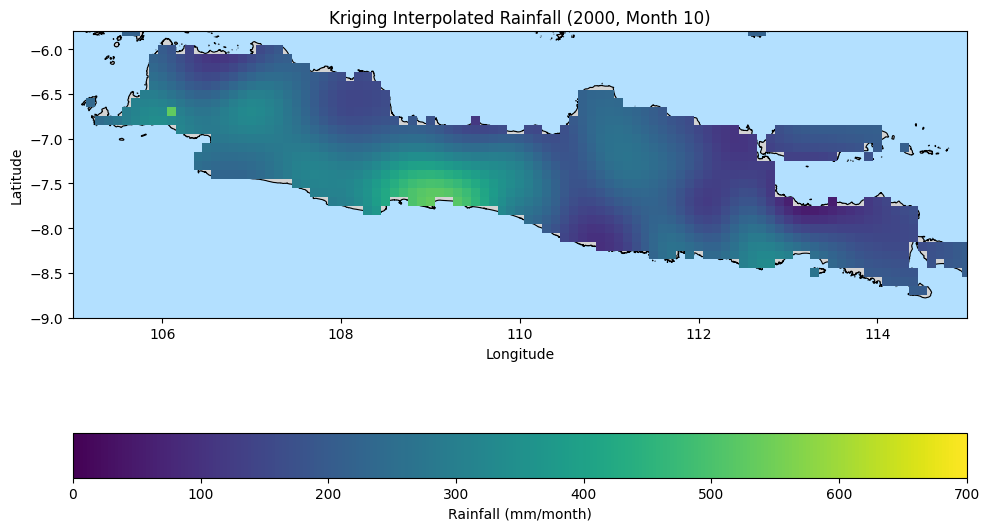

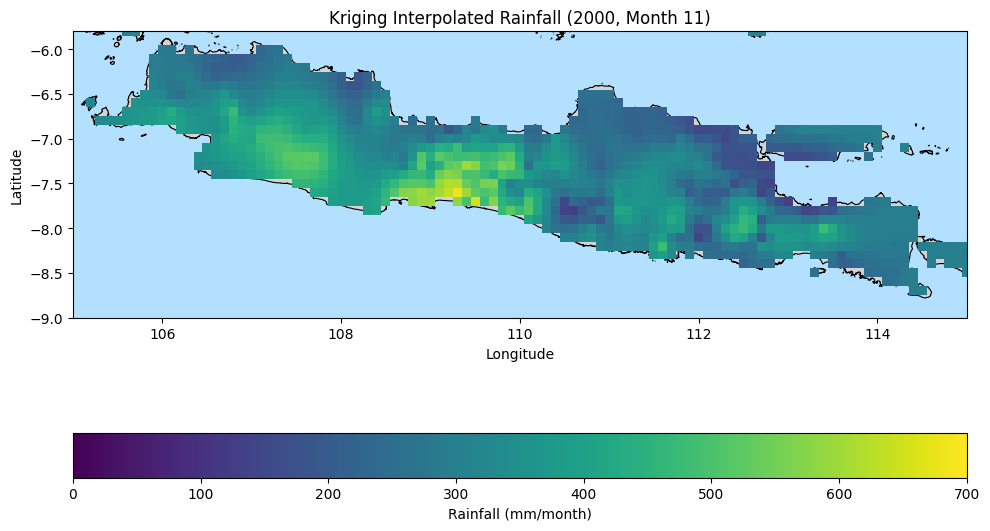

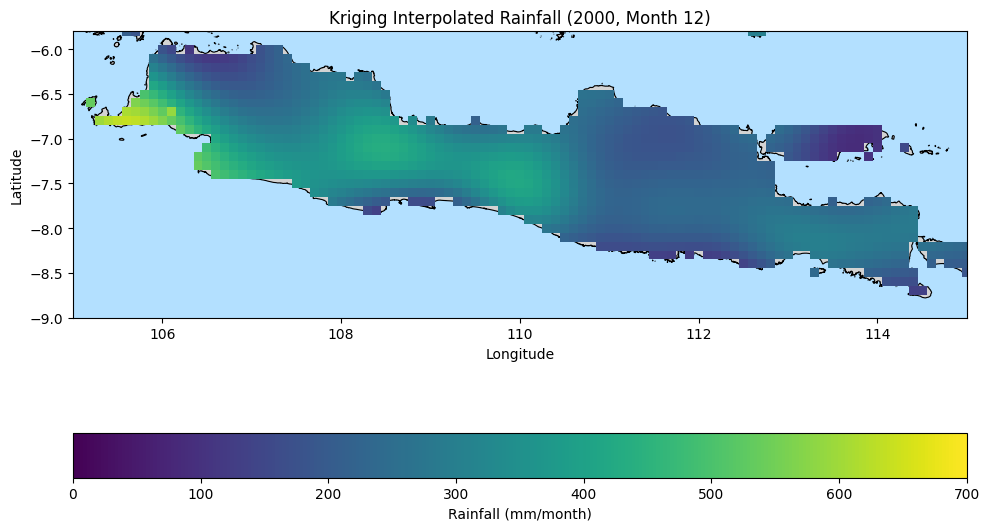

In [7]:
#ok_interp = interp_masked.copy()
ok_2000 = pd.read_csv("OK_results/Masked/2000_OK_masked.csv")
ok_2000['month'] = ok_2000['month'].astype(int)
desimals = 1
ok_2000['lat'] = ok_2000['lat'].round(desimals)
ok_2000['lon'] = ok_2000['lon'].round(desimals)

vmax = int(np.ceil(ok_2000['rainfall'].max() / 100.0)) * 100

# Loop through each month in interp_masked
for month in sorted(ok_2000['month'].unique()):
    df_month = ok_2000[ok_2000['month'] == month]
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.set_facecolor('#b3e0ff')
    java.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.8)
    sc = ax.scatter(
        df_month['lon'], df_month['lat'],
        c=df_month['rainfall'],
        cmap='viridis',
        marker='s',  # square marker
        s=42,        # adjust size as needed
        edgecolor='none',
        vmin=0,
        vmax=vmax
    )
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    ax.set_title(f'Kriging Interpolated Rainfall (2000, Month {month})')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    cbar = fig.colorbar(sc, ax=ax, label='Rainfall (mm/month)', location='bottom')
    plt.tight_layout()
    plt.show()

#### 2013

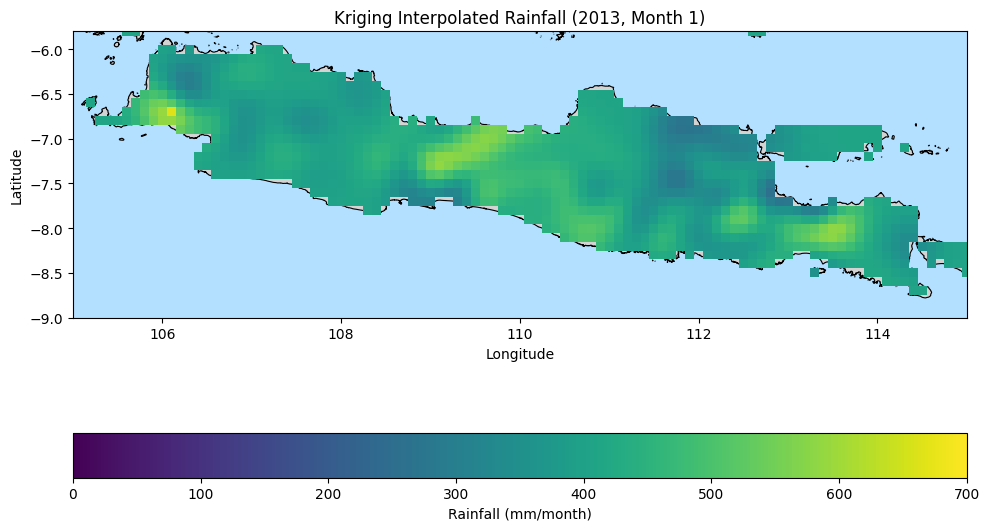

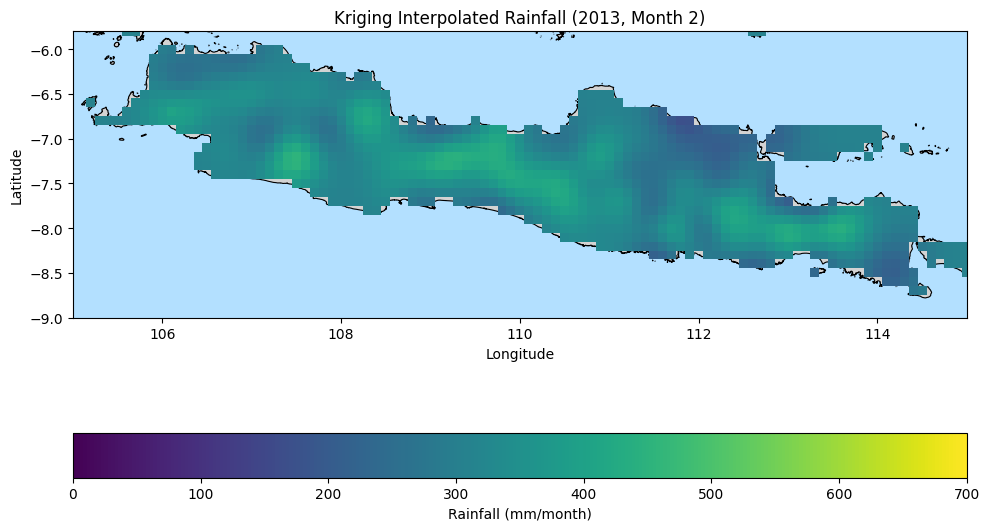

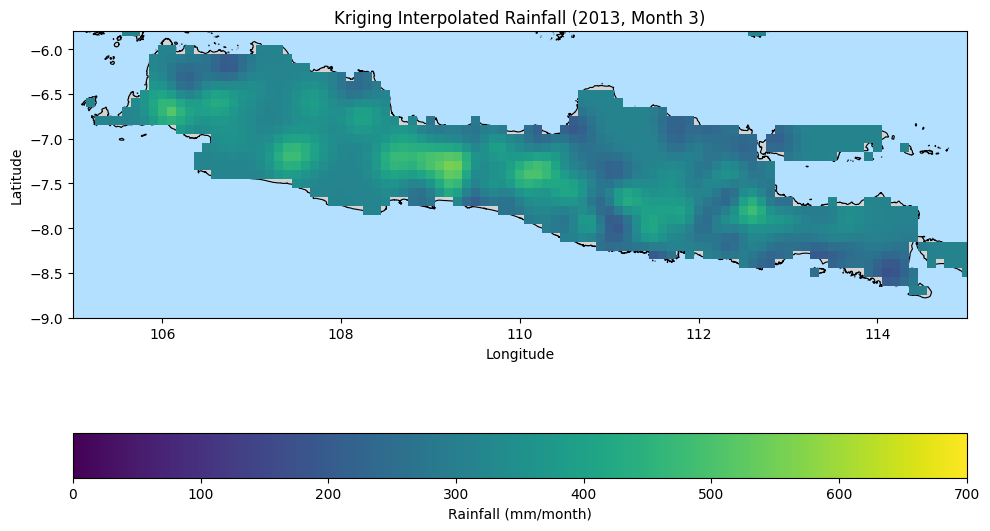

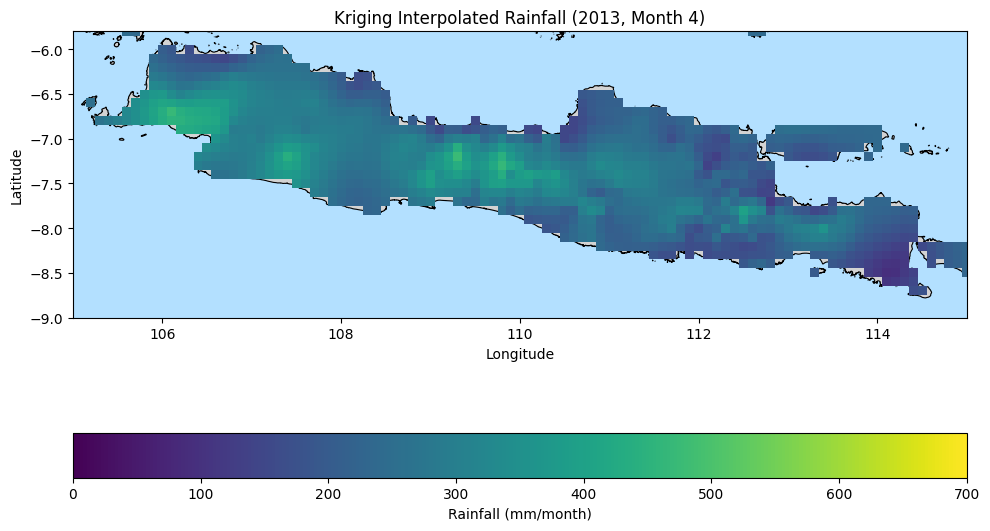

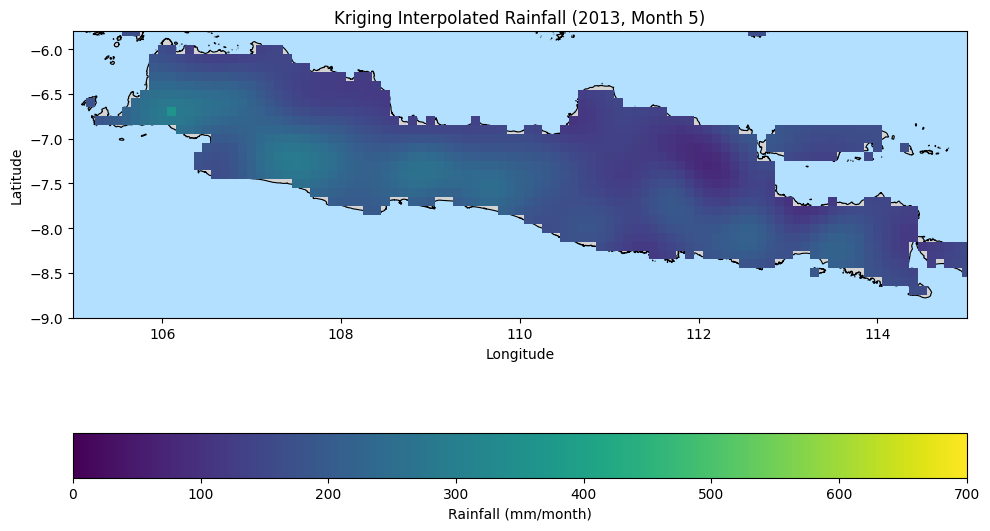

...

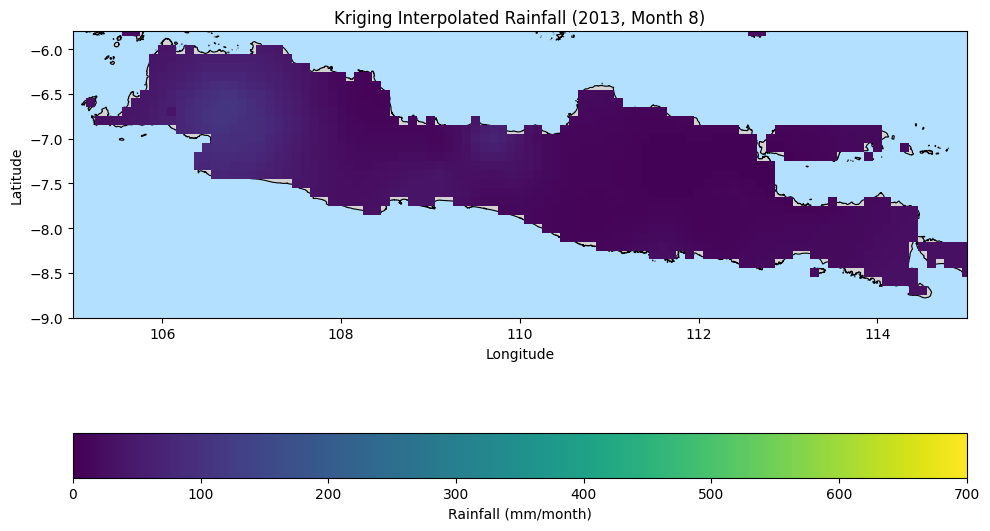

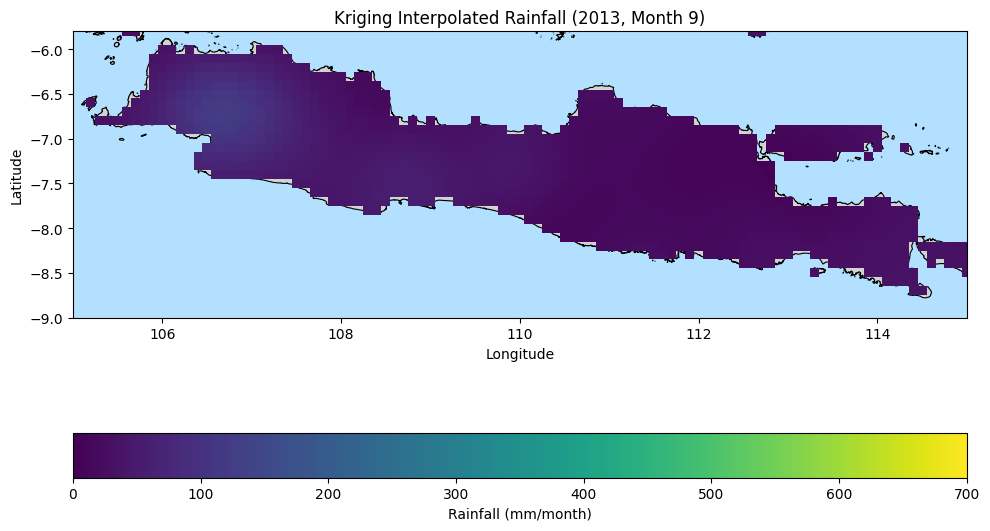

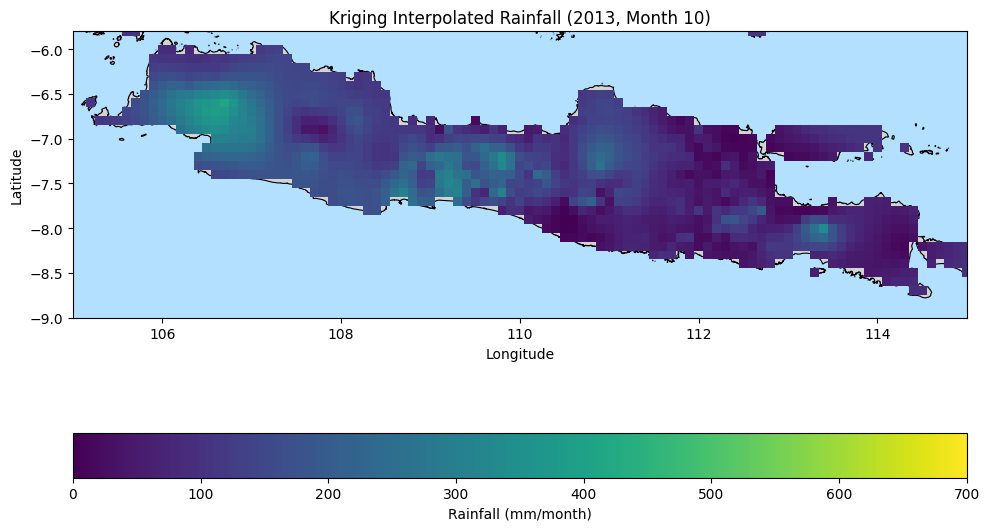

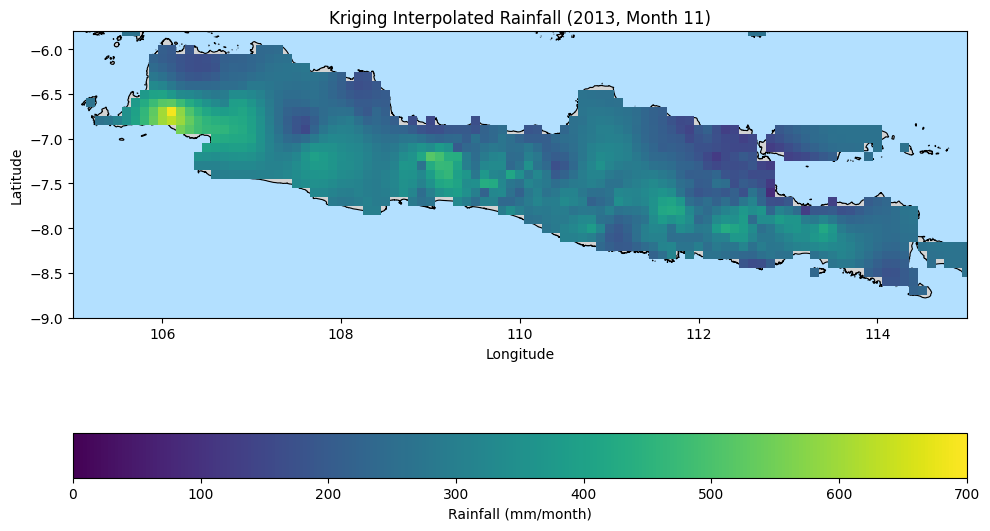

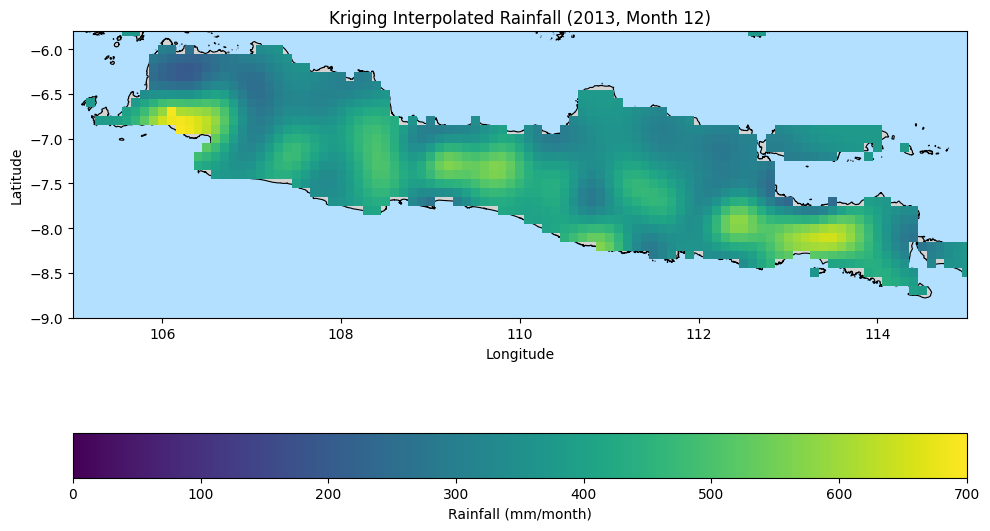

In [8]:
#ok_interp = interp_masked.copy()
ok_2013 = pd.read_csv("OK_results/Masked/2013_OK_masked.csv")
ok_2013['month'] = ok_2013['month'].astype(int)
desimals = 1
ok_2013['lat'] = ok_2013['lat'].round(desimals)
ok_2013['lon'] = ok_2013['lon'].round(desimals)

vmax = int(np.ceil(ok_2013['rainfall'].max() / 100.0)) * 100

# Loop through each month in interp_masked
for month in sorted(ok_2013['month'].unique()):
    df_month = ok_2013[ok_2013['month'] == month]
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.set_facecolor('#b3e0ff')
    java.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.8)
    sc = ax.scatter(
        df_month['lon'], df_month['lat'],
        c=df_month['rainfall'],
        cmap='viridis',
        marker='s',  # square marker
        s=42,        # adjust size as needed
        edgecolor='none',
        vmin=0,
        vmax=vmax
    )
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    ax.set_title(f'Kriging Interpolated Rainfall (2013, Month {month})')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    cbar = fig.colorbar(sc, ax=ax, label='Rainfall (mm/month)', location='bottom')
    plt.tight_layout()
    plt.show()

### V3 DATA PLOT

In [11]:
v3_df = pd.read_csv("NorESM2-MM_Bias Corrected_masked.csv")
v3_ori = pd.read_csv("NorESM2-MM_ori_BC.csv")
v3_df = v3_df.rename(columns={'precipitation': 'pr_v3_bc'})
desimals = 1
v3_df['lat'] = v3_df['lat'].round(desimals)
v3_df['lon'] = v3_df['lon'].round(desimals)
v3_df

,time,lat,lon,pr_v3_bc
0,1995-01-01,-8.7,114.4,315.924172
1,1995-01-01,-8.7,114.5,290.501063
2,1995-01-01,-8.6,114.1,256.873454
3,1995-01-01,-8.6,114.2,281.716518
4,1995-01-01,-8.6,114.3,296.450170
...,...,...,...,...
265195,2014-12-01,-6.0,107.3,151.412268
265196,2014-12-01,-5.8,105.6,310.769062
265197,2014-12-01,-5.8,105.7,254.690763
265198,2014-12-01,-5.8,112.6,350.132015


In [12]:
v3_ori = v3_ori.rename(columns={'pr_nor_ori_bc': 'pr_ori_bc'})
v3_ori['time'] = pd.to_datetime(v3_ori['time'])
v3_ori['year'] = v3_ori['time'].dt.year
v3_ori['month'] = v3_ori['time'].dt.month
ori_1997 = v3_ori[v3_ori['time'].dt.year == 1997]
ori_2000 = v3_ori[v3_ori['time'].dt.year == 2000]
ori_2013 = v3_ori[v3_ori['time'].dt.year == 2013]

In [13]:
# Convert 'time' to datetime and extract year
v3_df['time'] = pd.to_datetime(v3_df['time'], format='%Y-%m-%d')
v3_df['year'] = v3_df['time'].dt.year
v3_df['month'] = v3_df['time'].dt.month

##### V3 1997

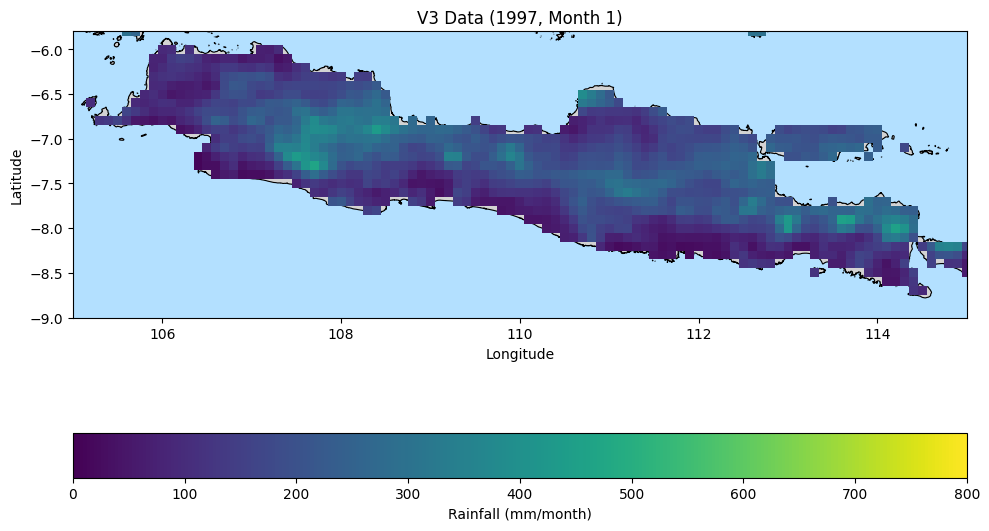

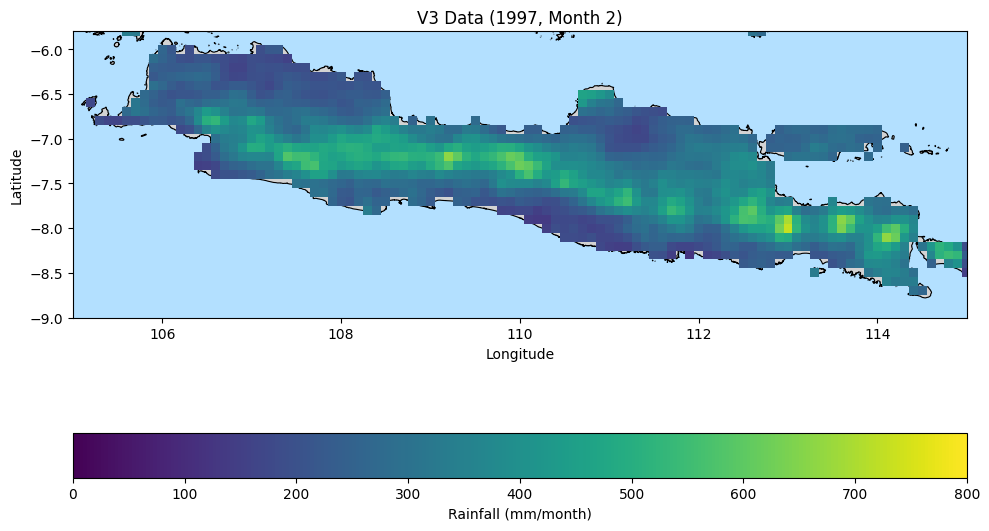

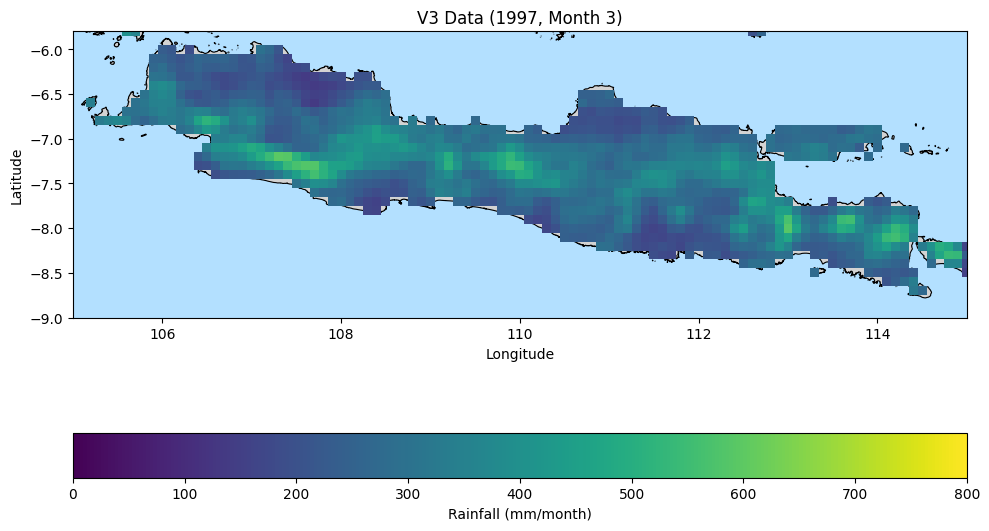

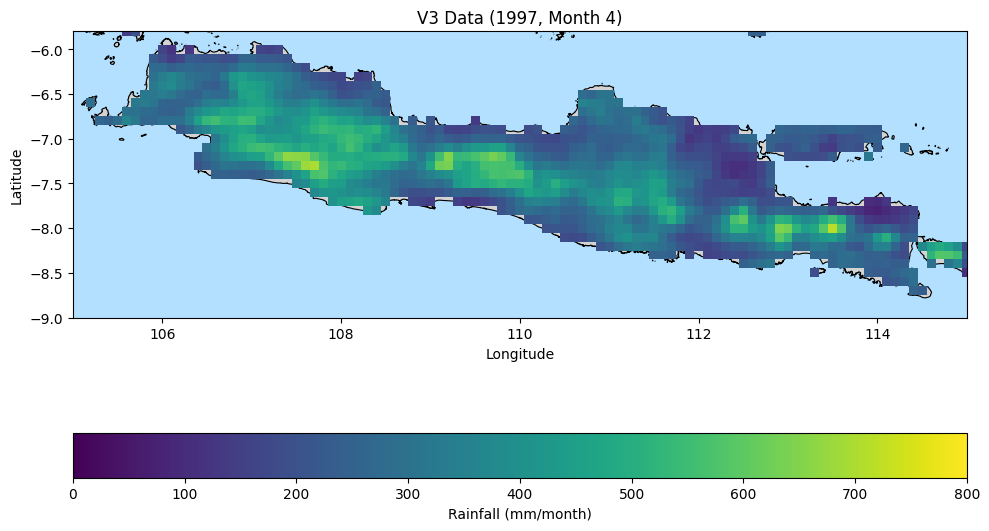

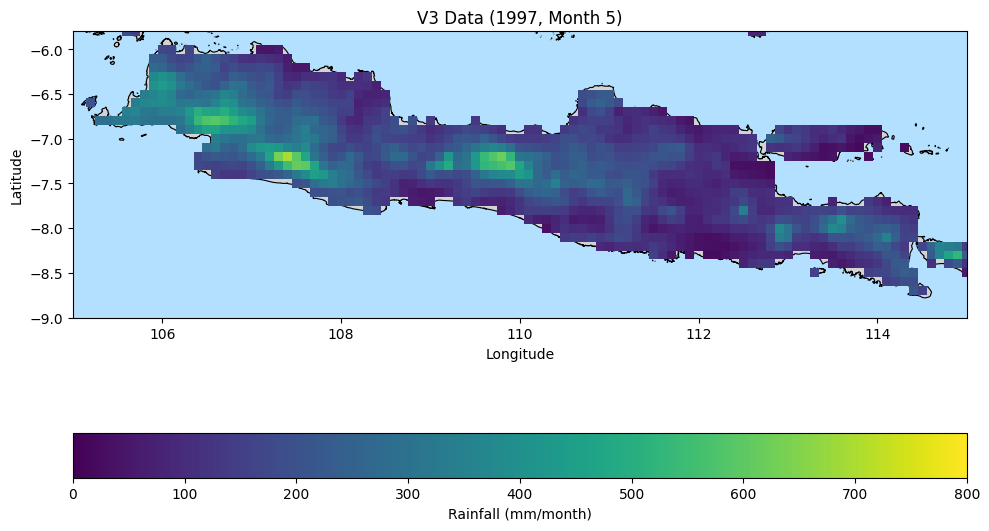

...

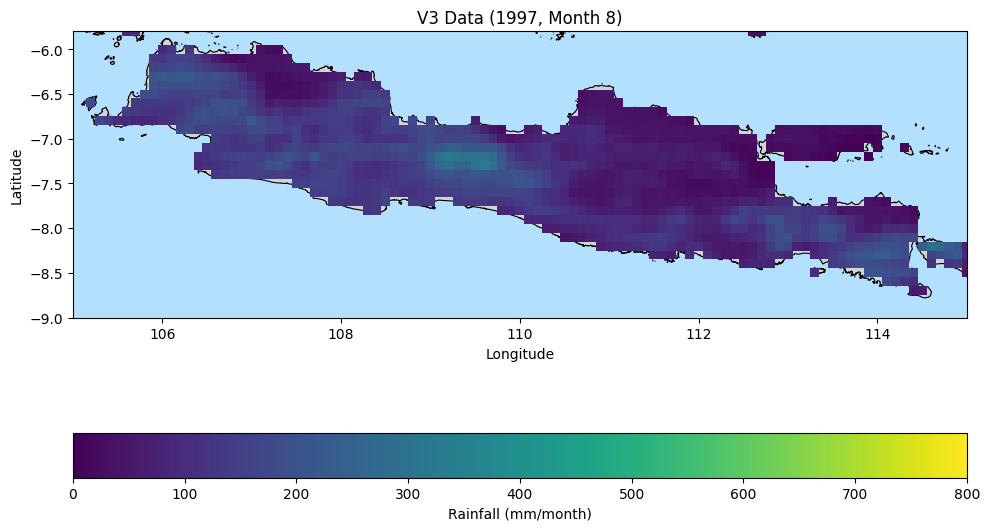

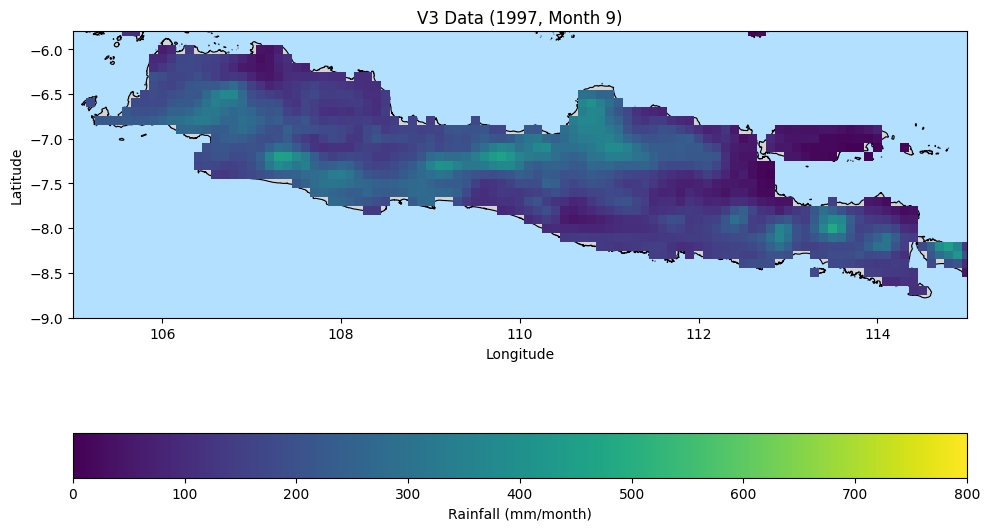

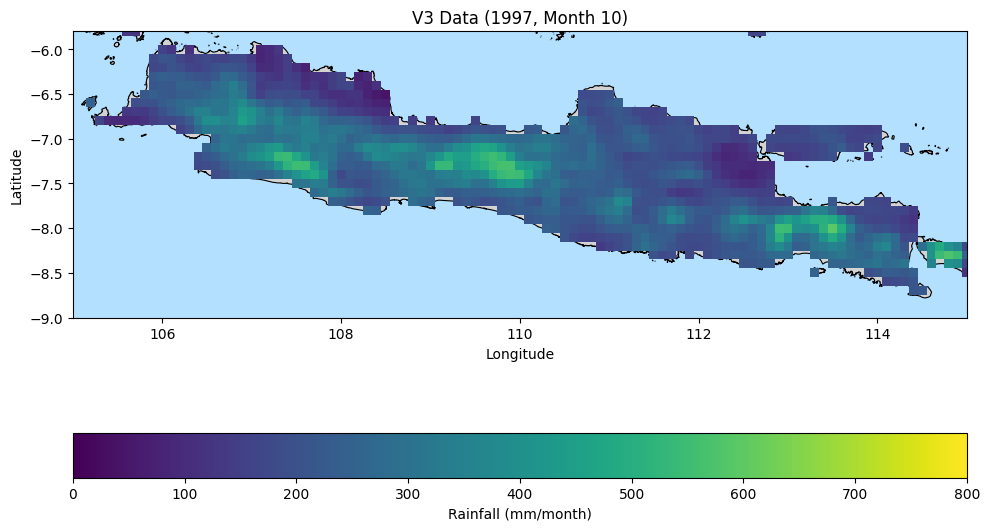

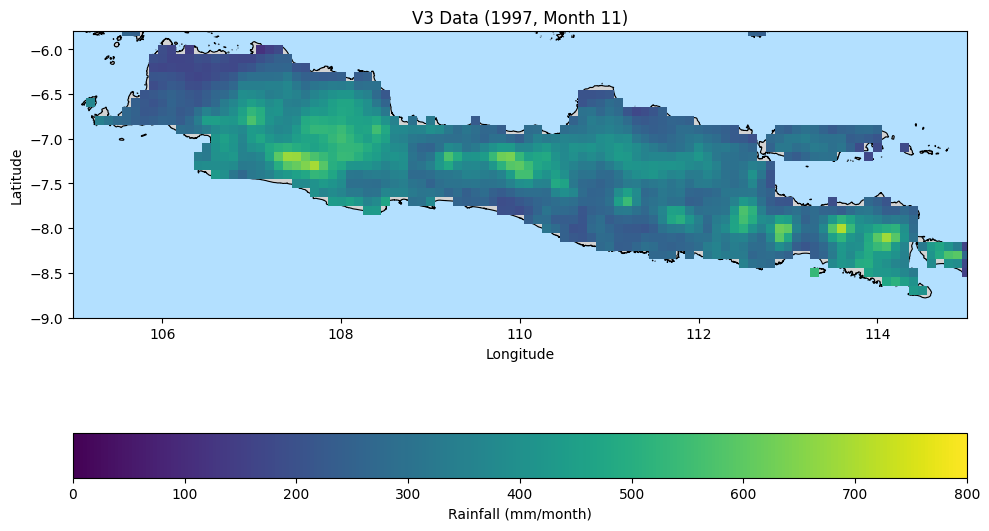

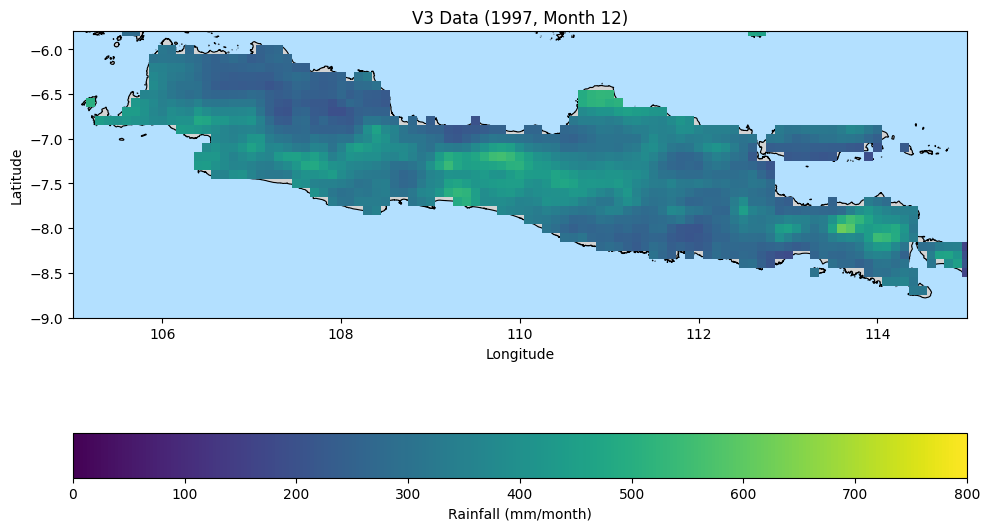

In [12]:
data = 'pr_v3_bc'

# Rename columns to match
v3_df.rename(columns={'lon': 'lon', 'lat': 'lat'}, inplace=True)

# Filter for year 2013 and drop NaN rainfall
v3_1997 = v3_df[(v3_df['year'] == 1997) & v3_df[data].notna()]
vmax = int(np.ceil(v3_1997[data].max() / 100.0)) * 100

# Loop through each month in interp_masked
for month in sorted(v3_1997['month'].unique()):
    df_month = v3_1997[v3_1997['month'] == month]
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.set_facecolor('#b3e0ff')
    java.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.8)
    sc = ax.scatter(
        df_month['lon'], df_month['lat'],
        c=df_month[data],
        cmap='viridis',
        marker='s',  # square marker
        s=42,        # adjust size as needed
        vmax=vmax,
        vmin=0,
        edgecolor='none'
    )
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    ax.set_title(f'V3 Data (1997, Month {month})')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    cbar = fig.colorbar(sc, ax=ax, label='Rainfall (mm/month)', location='bottom')
    plt.tight_layout()
    plt.show()

##### V3 2000

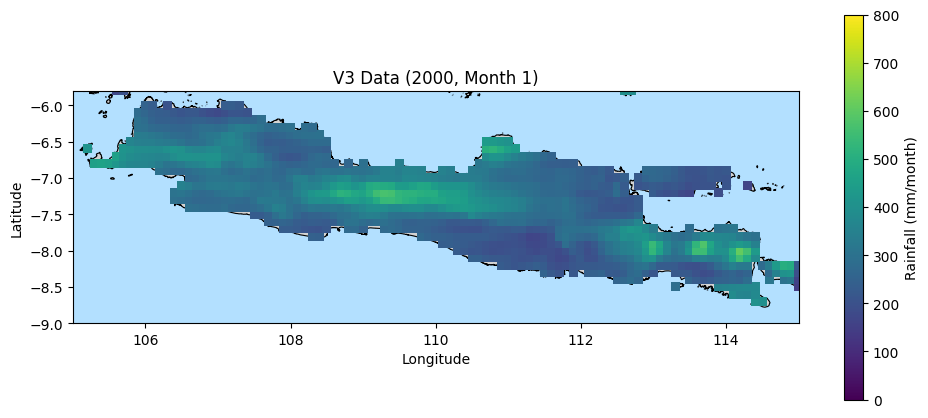

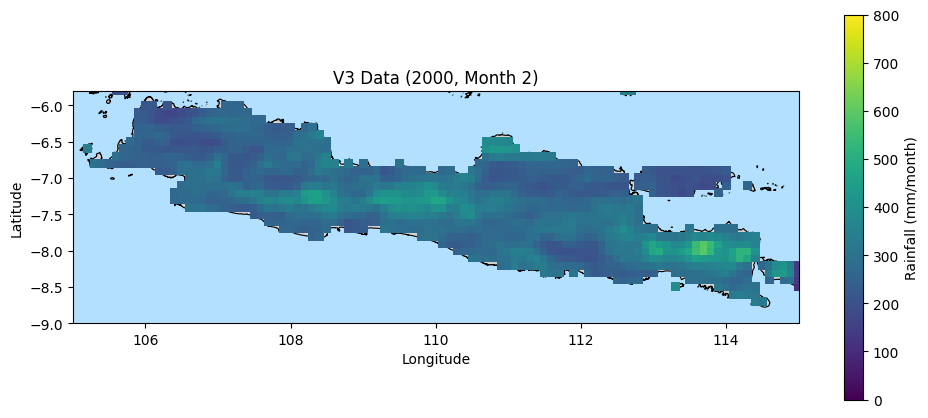

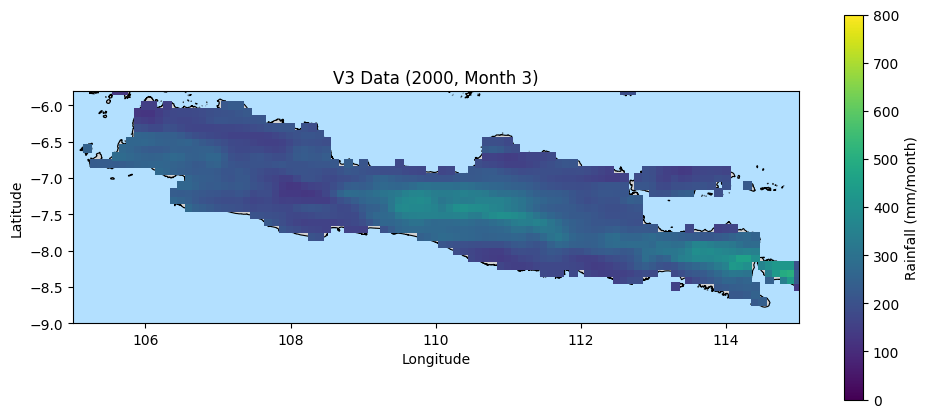

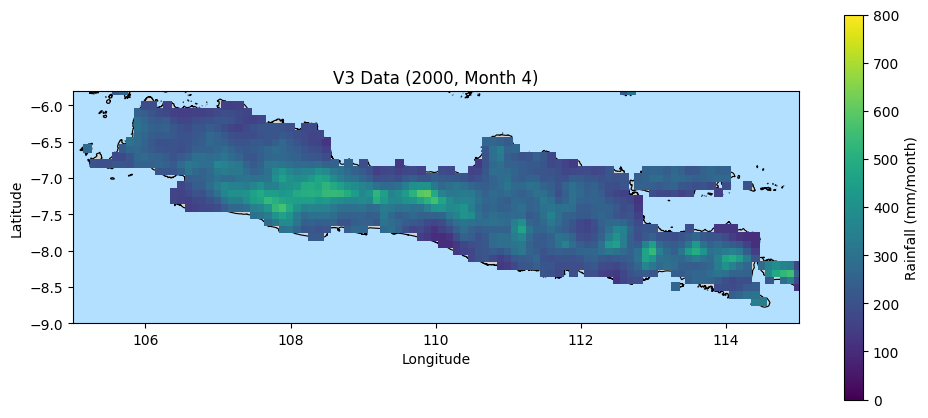

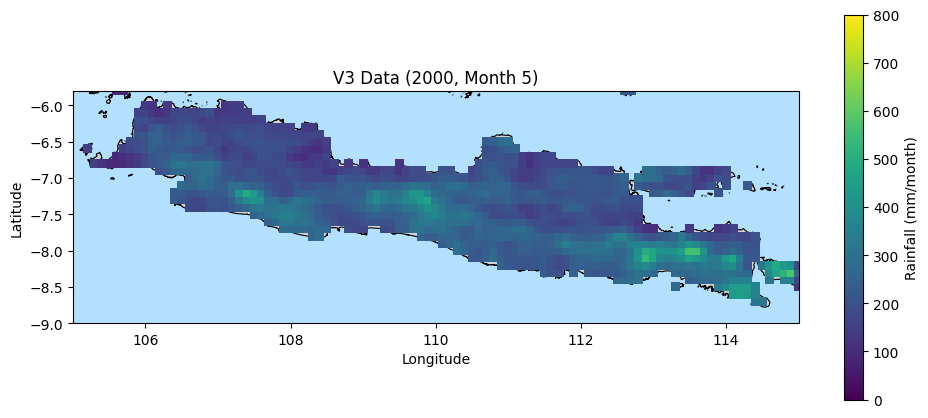

...

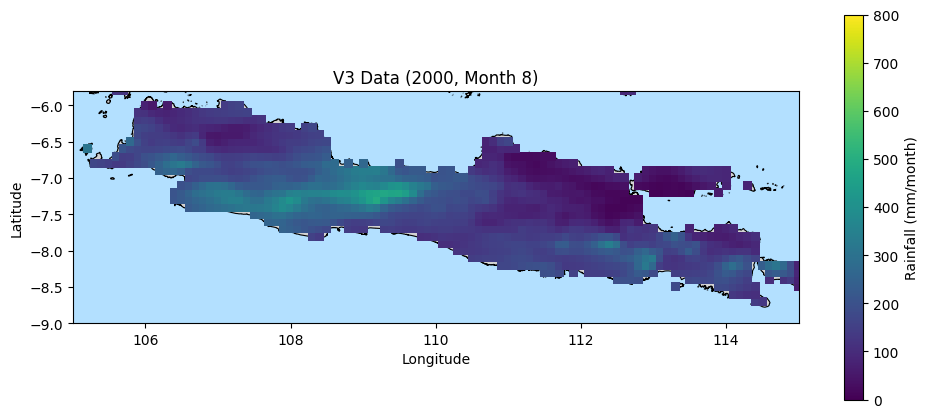

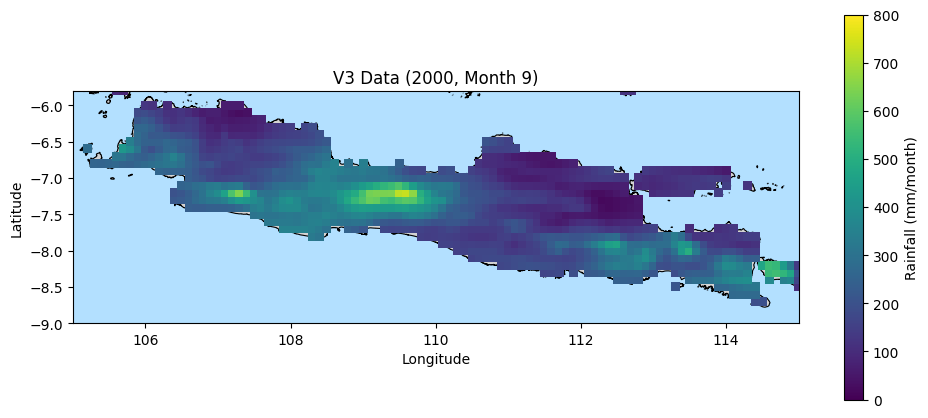

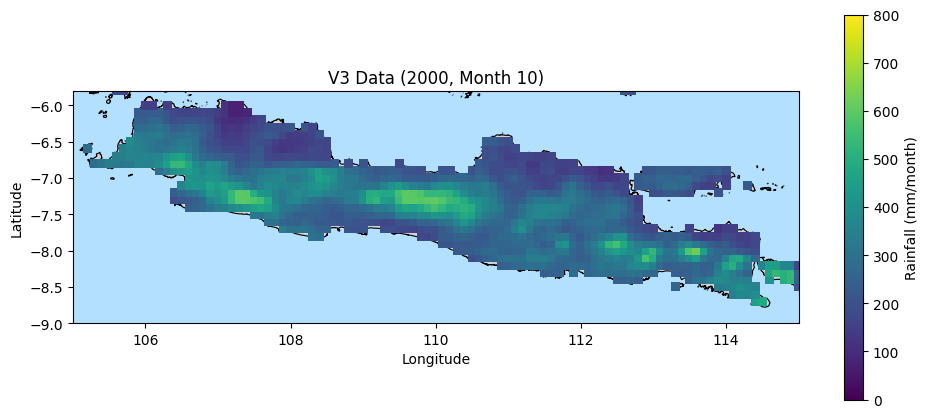

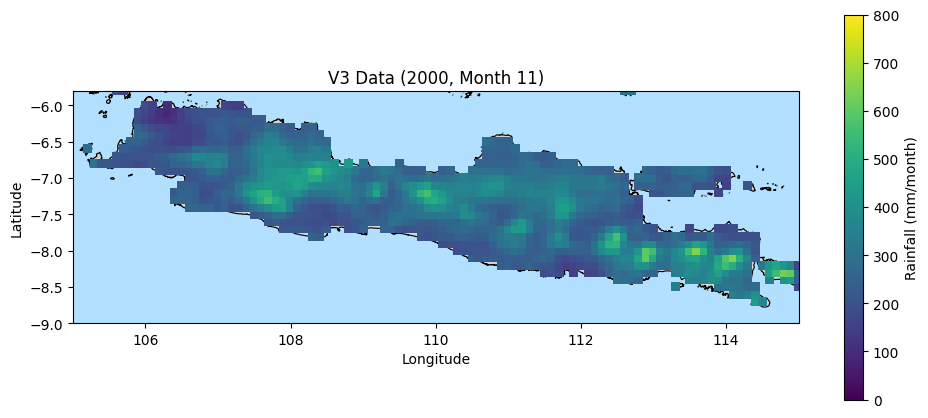

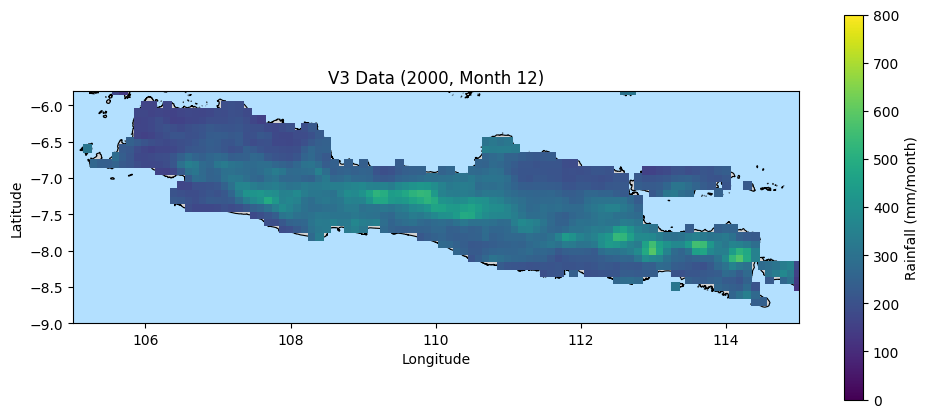

In [13]:
data = 'pr_v3_bc'

# Rename columns to match
v3_df.rename(columns={'lon': 'lon', 'lat': 'lat'}, inplace=True)

# Filter for year 2013 and drop NaN rainfall
v3_2000 = v3_df[(v3_df['year'] == 2000) & v3_df[data].notna()]
vmax = int(np.ceil(v3_2000[data].max() / 100.0)) * 100

# Loop through each month in interp_masked
for month in sorted(v3_2000['month'].unique()):
    df_month = v3_2000[v3_2000['month'] == month]
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.set_facecolor('#b3e0ff')
    java.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.8)
    sc = ax.scatter(
        df_month['lon'], df_month['lat'],
        c=df_month[data],
        cmap='viridis',
        marker='s',  # square marker
        s=42,        # adjust size as needed
        vmax=vmax,
        vmin=0,
        edgecolor='none'
    )
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    ax.set_title(f'V3 Data (2000, Month {month})')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    cbar = fig.colorbar(sc, ax=ax, label='Rainfall (mm/month)', shrink=0.5)
    plt.tight_layout()
    plt.show()

##### V3 2013

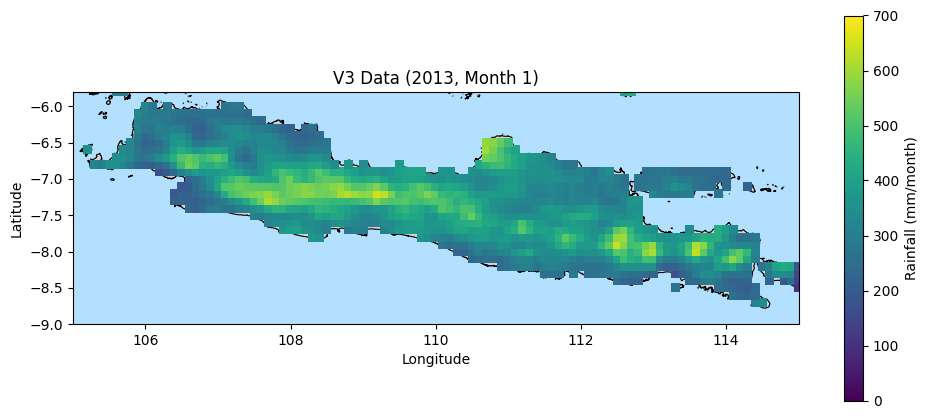

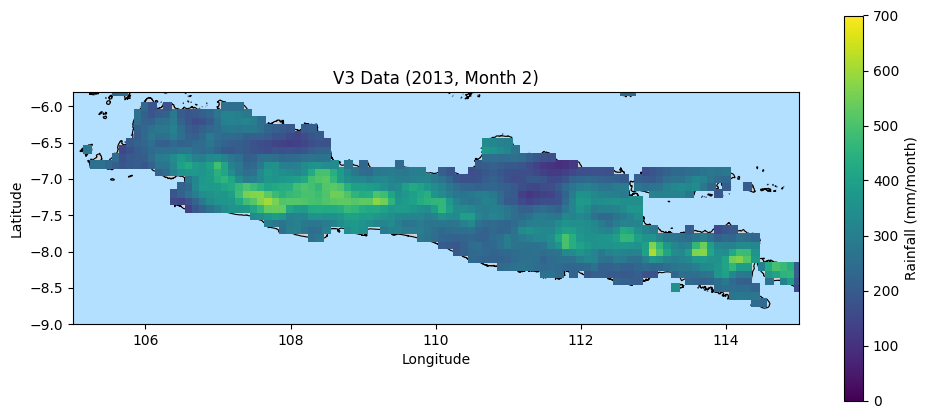

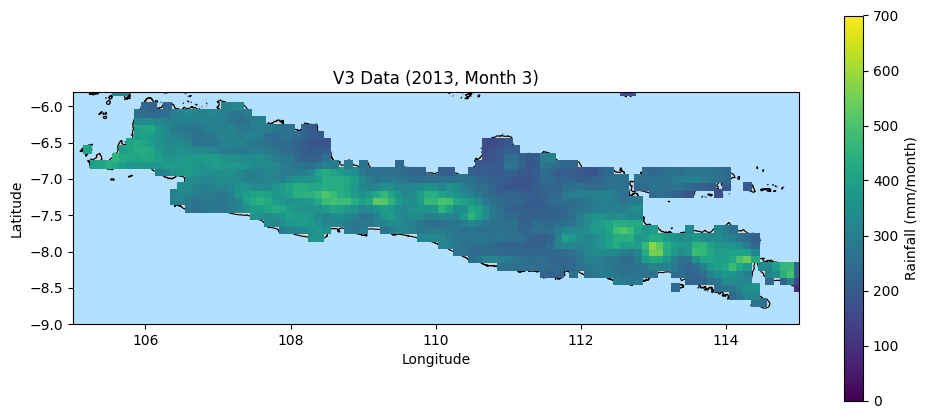

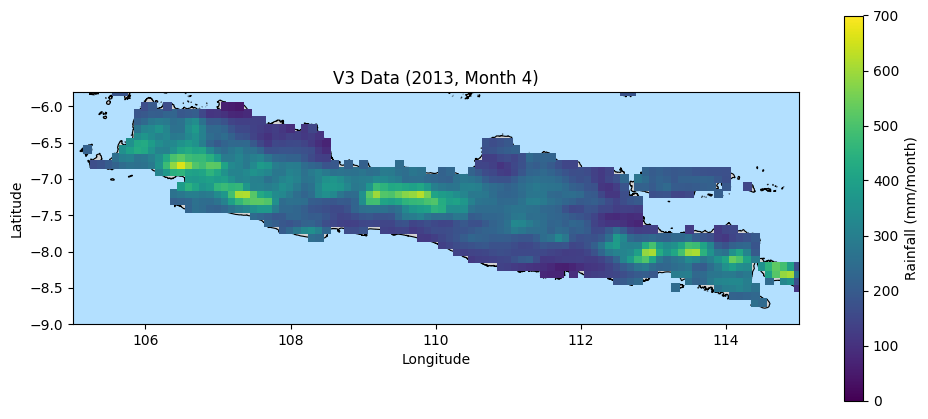

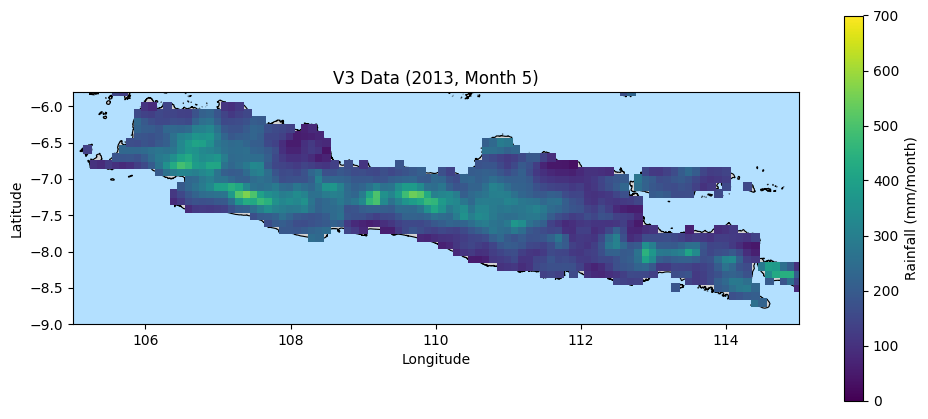

...

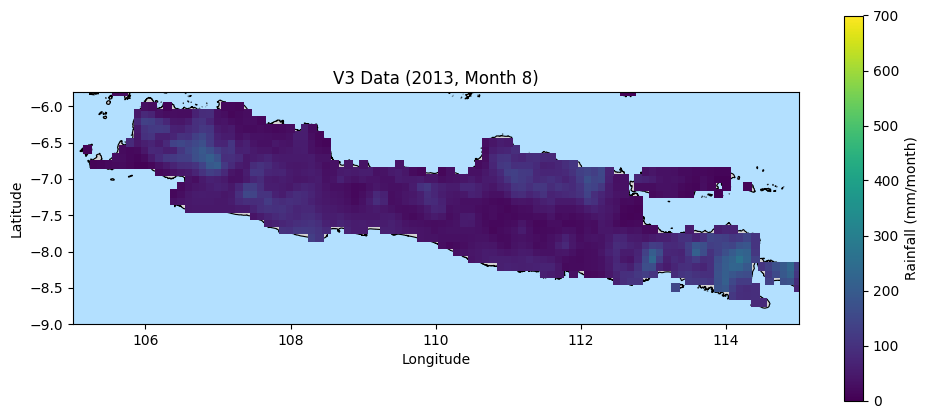

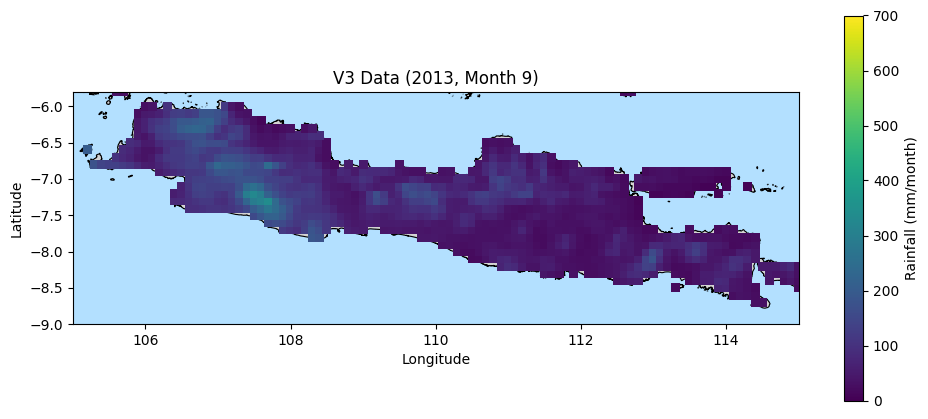

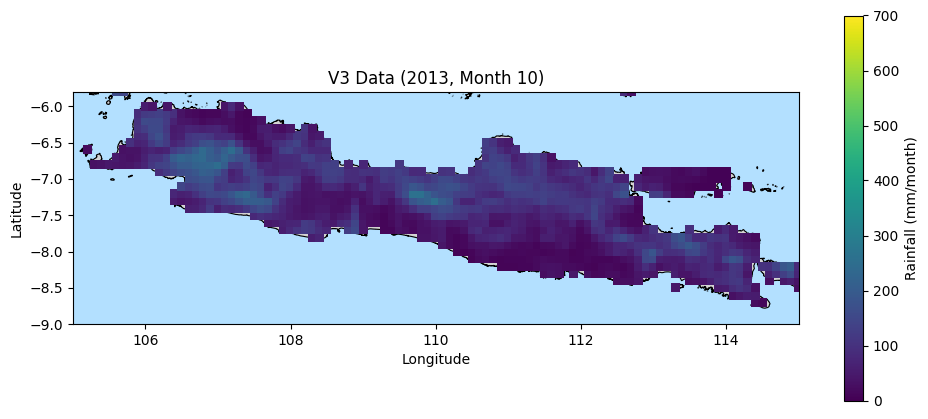

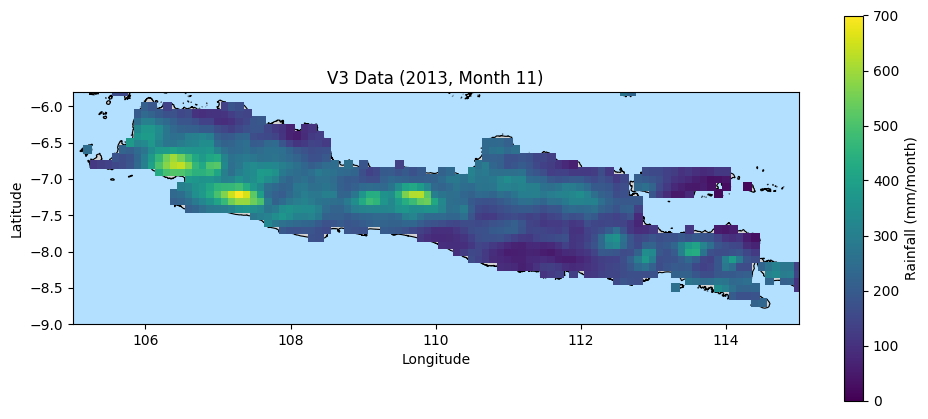

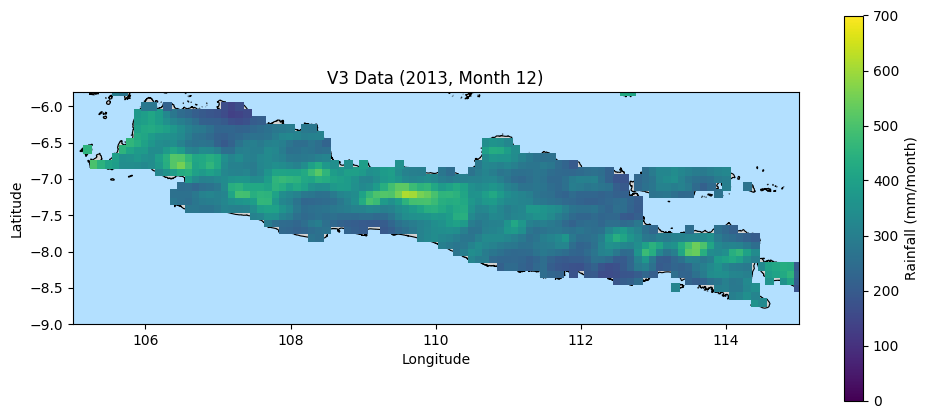

In [14]:
data = 'pr_v3_bc'

# Rename columns to match
v3_df.rename(columns={'lon': 'lon', 'lat': 'lat'}, inplace=True)

# Filter for year 2013 and drop NaN rainfall
v3_2013 = v3_df[(v3_df['year'] == 2013) & v3_df[data].notna()]
vmax = int(np.ceil(v3_2013[data].max() / 100.0)) * 100

# Loop through each month in interp_masked
for month in sorted(v3_2013['month'].unique()):
    df_month = v3_2013[v3_2013['month'] == month]
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.set_facecolor('#b3e0ff')
    java.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.8)
    sc = ax.scatter(
        df_month['lon'], df_month['lat'],
        c=df_month[data],
        cmap='viridis',
        marker='s',  # square marker
        s=42,        # adjust size as needed
        vmax=vmax,
        vmin=0,
        edgecolor='none'
    )
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    ax.set_title(f'V3 Data (2013, Month {month})')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    cbar = fig.colorbar(sc, ax=ax, label='Rainfall (mm/month)', shrink=0.5)
    plt.tight_layout()
    plt.show()

#### Evaluasi

In [14]:
mswep = pd.read_csv("data_mswep_regrid_masked.csv")
mswep = mswep.rename(columns={'precipitation': 'pr_mswep'})
mswep = mswep.drop(columns=['GID_0', 'COUNTRY'], errors='ignore')
mswep['lat'] = mswep['lat'].round(1)
mswep['lon'] = mswep['lon'].round(1)
mswep['time'] = pd.to_datetime(mswep['time'], format='%Y-%m-%d')
mswep['year'] = mswep['time'].dt.year
mswep['month'] = mswep['time'].dt.month

mswep_1997 = mswep[mswep['year'] == 1997]
mswep_2000 = mswep[mswep['year'] == 2000]
mswep_2013 = mswep[mswep['year'] == 2013]

In [15]:
df_bilinear = pd.read_csv("NorESM2-MM_bilinear_masked.csv")
df_bilinear = df_bilinear.rename(columns={'pr_nor_bilinear': 'pr_bilinear'})
df_bilinear['lat'] = df_bilinear['lat'].round(1)
df_bilinear['lon'] = df_bilinear['lon'].round(1)
df_bilinear['time'] = pd.to_datetime(df_bilinear['time'], format='%Y-%m-%d')
df_bilinear['year'] = df_bilinear['time'].dt.year
df_bilinear['month'] = df_bilinear['time'].dt.month
df_bilinear_1997 = df_bilinear[df_bilinear['year'] == 1997]
df_bilinear_2000 = df_bilinear[df_bilinear['year'] == 2000]
df_bilinear_2013 = df_bilinear[df_bilinear['year'] == 2013]
df_bilinear

,time,lon,lat,pr_bilinear,year,month
0,1995-01-01,114.4,-8.7,320.131744,1995,1
1,1995-01-01,114.5,-8.7,288.166028,1995,1
2,1995-01-01,114.1,-8.6,240.272741,1995,1
3,1995-01-01,114.2,-8.6,273.025307,1995,1
4,1995-01-01,114.3,-8.6,297.363712,1995,1
...,...,...,...,...,...,...
265195,2014-12-01,107.3,-6.0,146.699062,2014,12
265196,2014-12-01,105.6,-5.8,358.728100,2014,12
265197,2014-12-01,105.7,-5.8,277.641139,2014,12
265198,2014-12-01,112.6,-5.8,378.456505,2014,12


In [19]:
ori_1997['time'] = pd.to_datetime(ori_1997['time'], format='%Y-%m-%d')
ori_1997['year'] = ori_1997['time'].dt.year
ori_1997['month'] = ori_1997['time'].dt.month

ori_2000['time'] = pd.to_datetime(ori_2000['time'], format='%Y-%m-%d')
ori_2000['year'] = ori_2000['time'].dt.year
ori_2000['month'] = ori_2000['time'].dt.month

ori_2013['time'] = pd.to_datetime(ori_2013['time'], format='%Y-%m-%d')
ori_2013['year'] = ori_2013['time'].dt.year
ori_2013['month'] = ori_2013['time'].dt.month

C:\Users\allam\AppData\Local\Temp\ipykernel_16304\3647680851.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ori_1997['time'] = pd.to_datetime(ori_1997['time'], format='%Y-%m-%d')
C:\Users\allam\AppData\Local\Temp\ipykernel_16304\3647680851.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ori_1997['year'] = ori_1997['time'].dt.year
C:\Users\allam\AppData\Local\Temp\ipykernel_16304\3647680851.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

1997, 2000, 2013

In [56]:
# Make sure lon, lat, and month are the same dtype in both DataFrames
v3_1997['month'] = v3_1997['month'].astype(int)
ok_1997['month'] = ok_1997['month'].astype(int)
ori_1997['month'] = ori_1997['month'].astype(int)
mswep_1997['month'] = mswep_1997['month'].astype(int)
df_bilinear_1997['month'] = df_bilinear_1997['month'].astype(int)

# Merge on lon, lat, and month
merged_1997 = pd.merge(
    ok_1997,
    v3_1997[['lon', 'lat', 'month', 'pr_v3_bc']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged_1997 = pd.merge(
    merged_1997,
    ori_1997[['lon', 'lat', 'month', 'pr_nor_ori', 'pr_cmip6_ori', 'pr_ori_bc']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged_1997 = pd.merge(
    merged_1997,
    mswep_1997[['lon', 'lat', 'month', 'pr_mswep']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged_1997 = pd.merge(
    merged_1997,
    df_bilinear_1997[['lon', 'lat', 'month', 'pr_bilinear']],
    on=['lon', 'lat', 'month'],
    how='inner'
)

# Make sure lon, lat, and month are the same dtype in both DataFrames
v3_2000['month'] = v3_2000['month'].astype(int)
ok_2000['month'] = ok_2000['month'].astype(int)
ori_2000['month'] = ori_2000['month'].astype(int)
mswep_2000['month'] = mswep_2000['month'].astype(int)
df_bilinear_2000['month'] = df_bilinear_2000['month'].astype(int)

# Merge on lon, lat, and month
merged_2000 = pd.merge(
    ok_2000,
    v3_2000[['lon', 'lat', 'month', 'pr_v3_bc']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged_2000 = pd.merge(
    merged_2000,
    ori_2000[['lon', 'lat', 'month', 'pr_nor_ori', 'pr_cmip6_ori', 'pr_ori_bc']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged_2000 = pd.merge(
    merged_2000,
    mswep_2000[['lon', 'lat', 'month', 'pr_mswep']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged_2000 = pd.merge(
    merged_2000,
    df_bilinear_2000[['lon', 'lat', 'month', 'pr_bilinear']],
    on=['lon', 'lat', 'month'],
    how='inner'
)

# Make sure lon, lat, and month are the same dtype in both DataFrames
v3_2013['month'] = v3_2013['month'].astype(int)
ok_2013['month'] = ok_2013['month'].astype(int)
ori_2013['month'] = ori_2013['month'].astype(int)
mswep_2013['month'] = mswep_2013['month'].astype(int)
df_bilinear_2013['month'] = df_bilinear_2013['month'].astype(int)

# Merge on lon, lat, and month
merged_2013 = pd.merge(
    ok_2013,
    v3_2013[['lon', 'lat', 'month', 'pr_v3_bc']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged_2013 = pd.merge(
    merged_2013,
    ori_2013[['lon', 'lat', 'month', 'pr_nor_ori', 'pr_cmip6_ori', 'pr_ori_bc']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged_2013 = pd.merge(
    merged_2013,
    mswep_2013[['lon', 'lat', 'month', 'pr_mswep']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged_2013 = pd.merge(
    merged_2013,
    df_bilinear_2013[['lon', 'lat', 'month', 'pr_bilinear']],
    on=['lon', 'lat', 'month'],
    how='inner'
)

C:\Users\allam\AppData\Local\Temp\ipykernel_16304\2841291327.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v3_1997['month'] = v3_1997['month'].astype(int)
C:\Users\allam\AppData\Local\Temp\ipykernel_16304\2841291327.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ori_1997['month'] = ori_1997['month'].astype(int)
C:\Users\allam\AppData\Local\Temp\ipykernel_16304\2841291327.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

In [59]:
merged_1997 = merged_1997.drop(columns=['GID_0', 'COUNTRY', 'pr_ori_bc'], errors='ignore')
merged_2000 = merged_2000.drop(columns=['GID_0', 'COUNTRY', 'pr_ori_bc'], errors='ignore')
merged_2013 = merged_2013.drop(columns=['GID_0', 'COUNTRY', 'pr_ori_bc'], errors='ignore')

In [60]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

true = 'pr_v3_bc'
test = 'rainfall'

def metrics(x):
    rmse = np.sqrt(mean_squared_error(x[true], x[test]))
    mae = mean_absolute_error(x[true], x[test])
    r2 = r2_score(x[true], x[test])
    return pd.Series({'rmse': rmse, 'mae': mae, 'r2': r2})

metrics_1997 = merged_1997.groupby('month').apply(metrics).reset_index()
metrics_2000 = merged_2000.groupby('month').apply(metrics).reset_index()
metrics_2013 = merged_2013.groupby('month').apply(metrics).reset_index()

C:\Users\allam\AppData\Local\Temp\ipykernel_16304\3744535663.py:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_1997 = merged_1997.groupby('month').apply(metrics).reset_index()
C:\Users\allam\AppData\Local\Temp\ipykernel_16304\3744535663.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_2000 = merged_2000.groupby('month').apply(metrics).reset_index()
C:\Users\allam\AppData\Local\Temp\ip

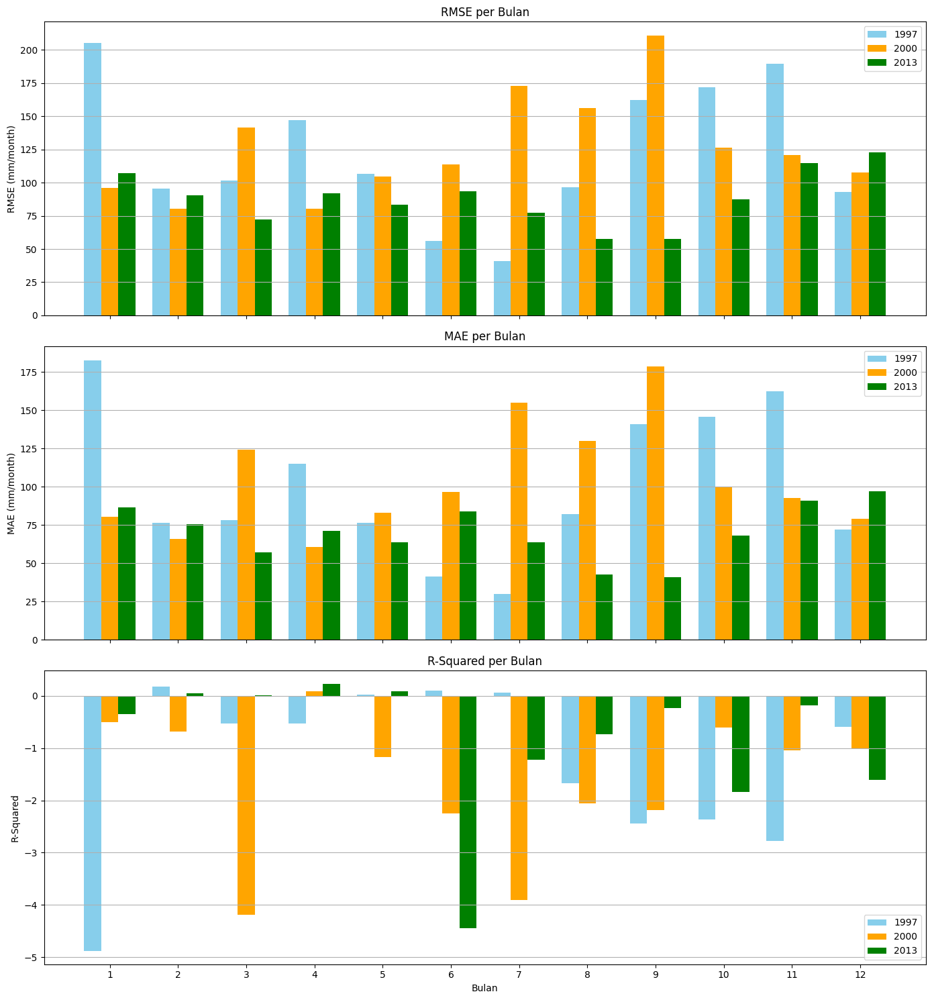

In [61]:
import numpy as np
import matplotlib.pyplot as plt

months = metrics_1997['month']
bar_width = 0.25
x = np.arange(len(months))

fig, axs = plt.subplots(3, 1, figsize=(14, 15), sharex=True)

# RMSE
axs[0].bar(x - bar_width, metrics_1997['rmse'], width=bar_width, label='1997', color='skyblue')
axs[0].bar(x, metrics_2000['rmse'], width=bar_width, label='2000', color='orange')
axs[0].bar(x + bar_width, metrics_2013['rmse'], width=bar_width, label='2013', color='green')
axs[0].set_ylabel('RMSE (mm/month)')
axs[0].set_title('RMSE per Bulan')
axs[0].set_xticks(x)
axs[0].set_xticklabels(months)
axs[0].legend()
axs[0].grid(True, axis='y')

# MAE
axs[1].bar(x - bar_width, metrics_1997['mae'], width=bar_width, label='1997', color='skyblue')
axs[1].bar(x, metrics_2000['mae'], width=bar_width, label='2000', color='orange')
axs[1].bar(x + bar_width, metrics_2013['mae'], width=bar_width, label='2013', color='green')
axs[1].set_ylabel('MAE (mm/month)')
axs[1].set_title('MAE per Bulan')
axs[1].set_xticks(x)
axs[1].set_xticklabels(months)
axs[1].legend()
axs[1].grid(True, axis='y')

# R2
axs[2].bar(x - bar_width, metrics_1997['r2'], width=bar_width, label='1997', color='skyblue')
axs[2].bar(x, metrics_2000['r2'], width=bar_width, label='2000', color='orange')
axs[2].bar(x + bar_width, metrics_2013['r2'], width=bar_width, label='2013', color='green')
axs[2].set_ylabel('R-Squared')
axs[2].set_xlabel('Bulan')
axs[2].set_title('R-Squared per Bulan')
axs[2].set_xticks(x)
axs[2].set_xticklabels(months)
axs[2].legend()
axs[2].grid(True, axis='y')

plt.tight_layout()
plt.show()

In [62]:
from sklearn.linear_model import LinearRegression

def bias_correct(df, src_col, tgt_col, new_col):
    # Fit linear regression: tgt_col ~ src_col
    mask = df[src_col].notna() & df[tgt_col].notna()
    X = df.loc[mask, src_col].values.reshape(-1, 1)
    y = df.loc[mask, tgt_col].values
    model = LinearRegression().fit(X, y)
    # Apply correction
    df[new_col] = model.predict(df[src_col].values.reshape(-1, 1))
    return model

# For each year
for merged, year in zip([merged_1997, merged_2000, merged_2013], [1997, 2000, 2013]):
    print(f"Year: {year}")
    # pr_nor_ori to rainfall
    model1 = bias_correct(merged, 'pr_nor_ori', 'rainfall', 'pr_nor_rainfall')
    print(f"  pr_nor_ori to rainfall: y = {model1.coef_[0]:.3f}*x + {model1.intercept_:.3f}")
    # pr_nor_ori to pr_mswep
    model2 = bias_correct(merged, 'pr_nor_ori', 'pr_mswep', 'pr_nor_mswep')
    print(f"  pr_nor_ori to pr_mswep: y = {model2.coef_[0]:.3f}*x + {model2.intercept_:.3f}")

# Now each merged DataFrame has two new columns:
# 'pr_nor_rainfall' and 'pr_nor_mswep'

Year: 1997
  pr_nor_ori to rainfall: y = 0.189*x + 116.237
  pr_nor_ori to pr_mswep: y = 0.191*x + 81.847
Year: 2000
  pr_nor_ori to rainfall: y = 0.213*x + 147.790
  pr_nor_ori to pr_mswep: y = 0.248*x + 152.163
Year: 2013
  pr_nor_ori to rainfall: y = 0.344*x + 139.083
  pr_nor_ori to pr_mswep: y = 0.329*x + 160.374


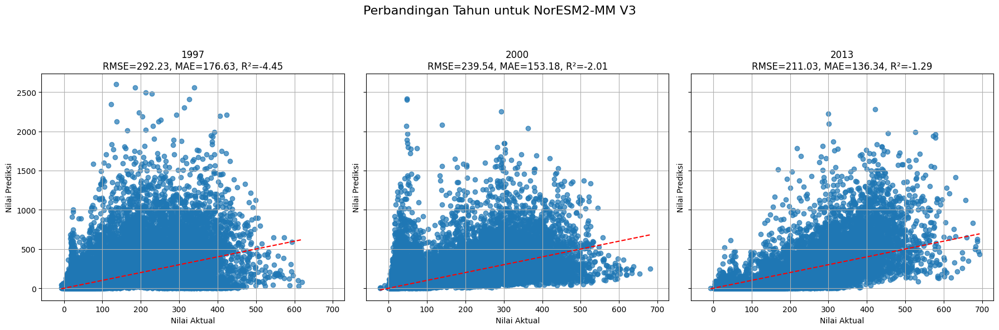

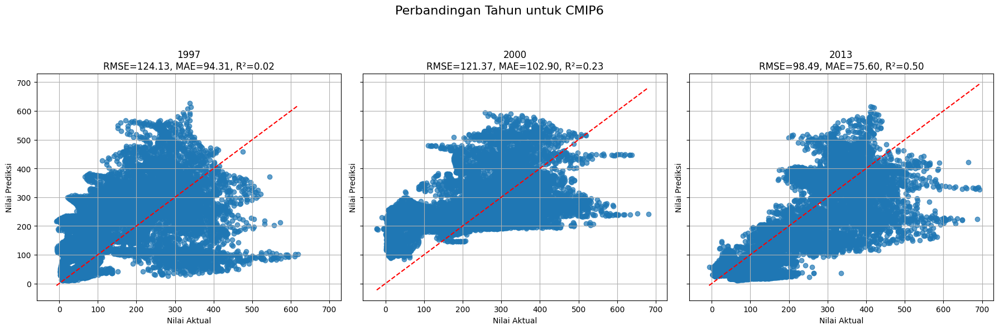

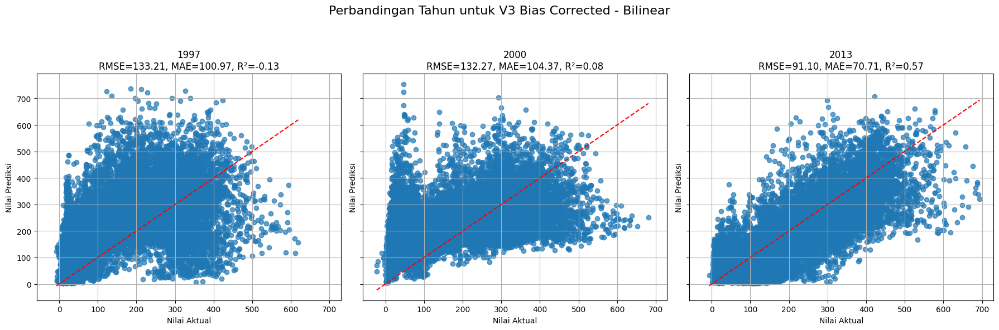

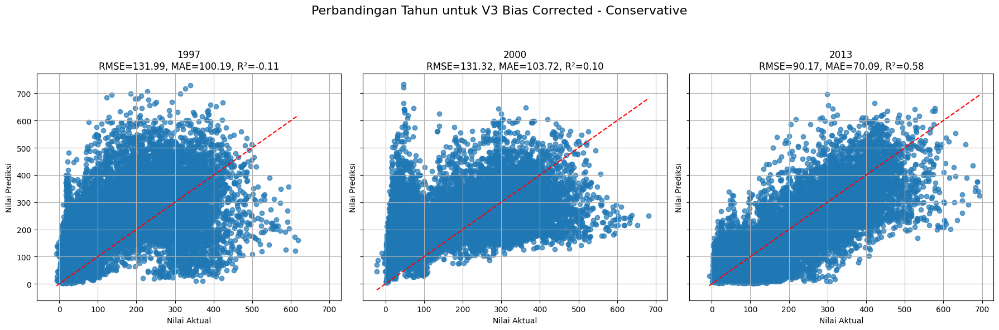

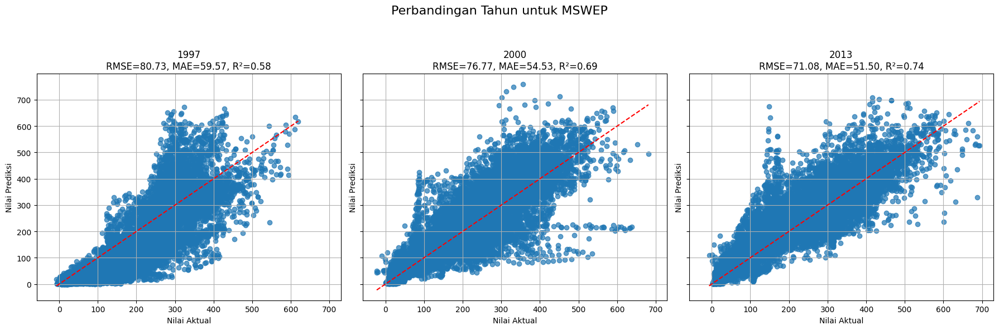

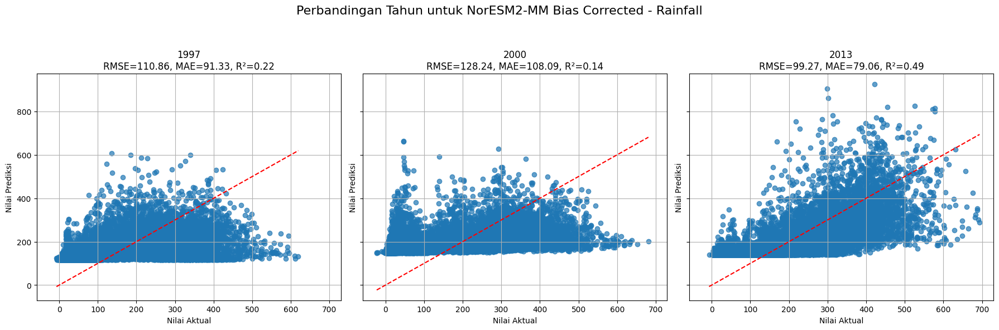

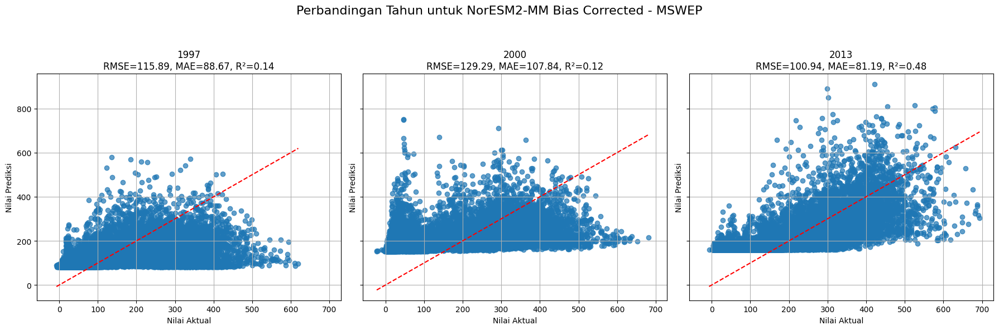

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

all_models = ['pr_nor_ori', 'pr_cmip6_ori', 'pr_bilinear', 'pr_v3_bc', 'pr_mswep', 'pr_nor_rainfall', 'pr_nor_mswep']
model_titles = {
    'pr_nor_ori': 'NorESM2-MM V3',
    'pr_cmip6_ori': 'CMIP6',
    'pr_bilinear': 'V3 Bias Corrected - Bilinear',
    'pr_v3_bc': 'V3 Bias Corrected - Conservative',
    'pr_mswep': 'MSWEP',
    'pr_nor_rainfall': 'NorESM2-MM Bias Corrected - Rainfall',
    'pr_nor_mswep': 'NorESM2-MM Bias Corrected - MSWEP'
}
merged_years = [
    (merged_1997, "1997"),
    (merged_2000, "2000"),
    (merged_2013, "2013"),
]

for model in all_models:
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
    for i, (merged, year) in enumerate(merged_years):
        ok_true = merged['rainfall']
        pred = merged[model]
        rmse = np.sqrt(mean_squared_error(ok_true, pred))
        mae = mean_absolute_error(ok_true, pred)
        r2 = r2_score(ok_true, pred)
        axs[i].scatter(ok_true, pred, alpha=0.7)
        axs[i].plot([ok_true.min(), ok_true.max()], [ok_true.min(), ok_true.max()], 'r--')
        axs[i].set_xlabel('Nilai Aktual')
        axs[i].set_ylabel('Nilai Prediksi')
        axs[i].set_title(f"{year}\nRMSE={rmse:.2f}, MAE={mae:.2f}, R²={r2:.2f}")
        axs[i].grid(True)
    fig.suptitle(f'Perbandingan Tahun untuk {model_titles.get(model, model)}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

### SPATIAL PLOT SIDE-BY-SIDE

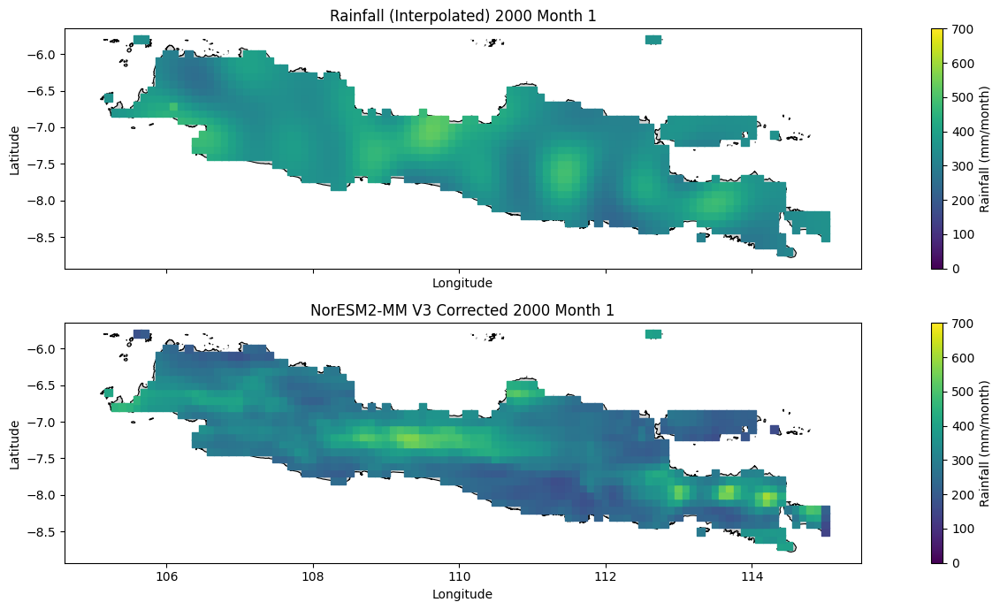

In [64]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import box

# Load shapefile if not already loaded
indo = gpd.read_file("peta_shp_indonesia.shp")
minx, miny, maxx, maxy = 105, -9, 115, -5.8

# Use .clip for exact Java boundary
java_box = box(minx, miny, maxx, maxy)
java = gpd.clip(indo, java_box)

# Example: plot for 1997, January (month=1)
year = 2000
month = 1

if year == 1997:
    df = merged_1997[merged_1997['month'] == month]
elif year == 2000:
    df = merged_2000[merged_2000['month'] == month]
elif year == 2013:
    df = merged_2013[merged_2013['month'] == month]
else:
    raise ValueError("Year must be 1997, 2000, or 2013")

# Set consistent color scale
vmin = 0
vmax = int(np.ceil(max(df['rainfall'].max(), df['pr_v3_bc'].max()) / 100.0)) * 100

fig, axs = plt.subplots(2, 1, figsize=(16, 7), sharex=True, sharey=True)

# Plot rainfall
java.plot(ax=axs[0], color='lightgray', edgecolor='black', linewidth=0.8)
sc1 = axs[0].scatter(df['lon'], df['lat'], c=df['rainfall'], cmap='viridis', s=40, marker='s', vmin=vmin, vmax=vmax)
axs[0].set_title(f'Rainfall (Interpolated) {year} Month {month}')
axs[0].set_xlabel('Longitude')
axs[0].set_ylabel('Latitude')
plt.colorbar(sc1, ax=axs[0], label='Rainfall (mm/month)')

# Plot pr_v3_bc
java.plot(ax=axs[1], color='lightgray', edgecolor='black', linewidth=0.8)
sc2 = axs[1].scatter(df['lon'], df['lat'], c=df['pr_v3_bc'], cmap='viridis', s=40, marker='s', vmin=vmin, vmax=vmax)
axs[1].set_title(f'NorESM2-MM V3 Corrected {year} Month {month}')
axs[1].set_xlabel('Longitude')
axs[1].set_ylabel('Latitude')
plt.colorbar(sc2, ax=axs[1], label='Rainfall (mm/month)')

plt.tight_layout()
plt.show()

#### Save All Result

In [67]:
merged_1997 = merged_1997.rename(columns={
    'pr_nor_ori': 'pr_nor',
    'pr_cmip6_ori': 'pr_cmip6',
    'pr_bilinear': 'pr_nor_bilinear',
    'pr_v3_bc': 'pr_nor_conservative',
    'pr_mswep': 'pr_mswep',
    'pr_nor_rainfall': 'pr_nor_rainfall',
    'pr_nor_mswep': 'pr_nor_mswep'
})
merged_2000 = merged_2000.rename(columns={
    'pr_nor_ori': 'pr_nor',
    'pr_cmip6_ori': 'pr_cmip6',
    'pr_bilinear': 'pr_nor_bilinear',
    'pr_v3_bc': 'pr_nor_conservative',
    'pr_mswep': 'pr_mswep',
    'pr_nor_rainfall': 'pr_nor_rainfall',
    'pr_nor_mswep': 'pr_nor_mswep'
})
merged_2013 = merged_2013.rename(columns={
    'pr_nor_ori': 'pr_nor',
    'pr_cmip6_ori': 'pr_cmip6',
    'pr_bilinear': 'pr_nor_bilinear',
    'pr_v3_bc': 'pr_nor_conservative',
    'pr_mswep': 'pr_mswep',
    'pr_nor_rainfall': 'pr_nor_rainfall',
    'pr_nor_mswep': 'pr_nor_mswep'
})

In [68]:
merged_1997.to_csv("OK_results/Masked/Result_1997.csv", index=False)
merged_2000.to_csv("OK_results/Masked/Result_2000.csv", index=False)
merged_2013.to_csv("OK_results/Masked/Result_2013.csv", index=False)

In [ ]:
# Example: merge for year 1997 only to avoid MemoryError
year = 1997

uk_results_yr = uk_results[uk_results['year'] == year]
v3_df_yr = v3_df[v3_df['year'] == year]
v3_ori_yr = v3_ori[v3_ori['year'] == year]
mswep_yr = mswep[mswep['year'] == year]
df_bilinear_yr = df_bilinear[df_bilinear['year'] == year]

# Make sure lon, lat, and month are the same dtype in all DataFrames
for df in [uk_results_yr, v3_df_yr, v3_ori_yr, mswep_yr, df_bilinear_yr]:
    df['month'] = df['month'].astype(int)
    df['lon'] = df['lon'].astype(float)
    df['lat'] = df['lat'].astype(float)

# Merge on lon, lat, and month
merged = pd.merge(
    uk_results_yr,
    v3_df_yr[['lon', 'lat', 'month', 'pr_v3_bc']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged = pd.merge(
    merged,
    v3_ori_yr[['lon', 'lat', 'month', 'pr_ori_bc']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged = pd.merge(
    merged,
    mswep_yr[['lon', 'lat', 'month', 'pr_mswep']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged = pd.merge(
    merged,
    df_bilinear_yr[['lon', 'lat', 'month', 'pr_bilinear']],
    on=['lon', 'lat', 'month'],
    how='inner'
)

C:\Users\allam\AppData\Local\Temp\ipykernel_28528\58342190.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df['month'].astype(int)
C:\Users\allam\AppData\Local\Temp\ipykernel_28528\58342190.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lon'] = df['lon'].astype(float)
C:\Users\allam\AppData\Local\Temp\ipykernel_28528\58342190.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead


In [17]:
merged

,year,month,lon,lat,rainfall,pr_v3_bc,pr_ori_bc,pr_mswep,pr_bilinear
0,1997,1,114.4,-8.7,323.33,119.726847,104.963121,314.842474,123.033207
1,1997,1,114.5,-8.7,315.74,92.057046,65.221164,335.250412,87.893786
2,1997,1,114.1,-8.6,308.00,42.448676,25.309372,317.781189,40.479424
3,1997,1,114.2,-8.6,320.51,43.663514,29.125071,323.901962,44.460698
4,1997,1,114.3,-8.6,324.50,93.191012,74.160530,302.630010,96.104764
...,...,...,...,...,...,...,...,...,...
13255,1997,12,107.3,-6.0,295.17,271.254361,257.781226,136.531969,270.270090
13256,1997,12,105.6,-5.8,340.85,283.337312,285.777413,136.915912,295.372080
13257,1997,12,105.7,-5.8,336.55,279.242946,295.058906,141.206955,294.240149
13258,1997,12,112.6,-5.8,275.29,474.465698,486.235760,267.528796,509.757178


In [24]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

true = 'pr_mswep'
test = 'rainfall'

def metrics(x):
    rmse = np.sqrt(mean_squared_error(x[true], x[test]))
    mae = mean_absolute_error(x[true], x[test])
    r2 = r2_score(x[true], x[test])
    return pd.Series({'rmse': rmse, 'mae': mae, 'r2': r2})

metrics_yr = merged.groupby('month').apply(metrics).reset_index()

C:\Users\allam\AppData\Local\Temp\ipykernel_28528\4194996384.py:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_yr = merged.groupby('month').apply(metrics).reset_index()


In [26]:
metrics_yr

,month,rmse,mae,r2
0,1,59.276135,47.728465,0.200164
1,2,133.048267,112.059455,-0.990798
2,3,155.630663,144.373789,-11.366429
3,4,44.046169,35.325854,0.619066
4,5,44.296474,36.116865,0.306183
5,6,38.385860,32.086276,-6.089401
6,7,16.970272,13.621892,-0.147800
7,8,18.878268,13.597899,-4.033031
8,9,36.861515,29.014219,-18.648249
9,10,104.569712,83.193590,-20.092198


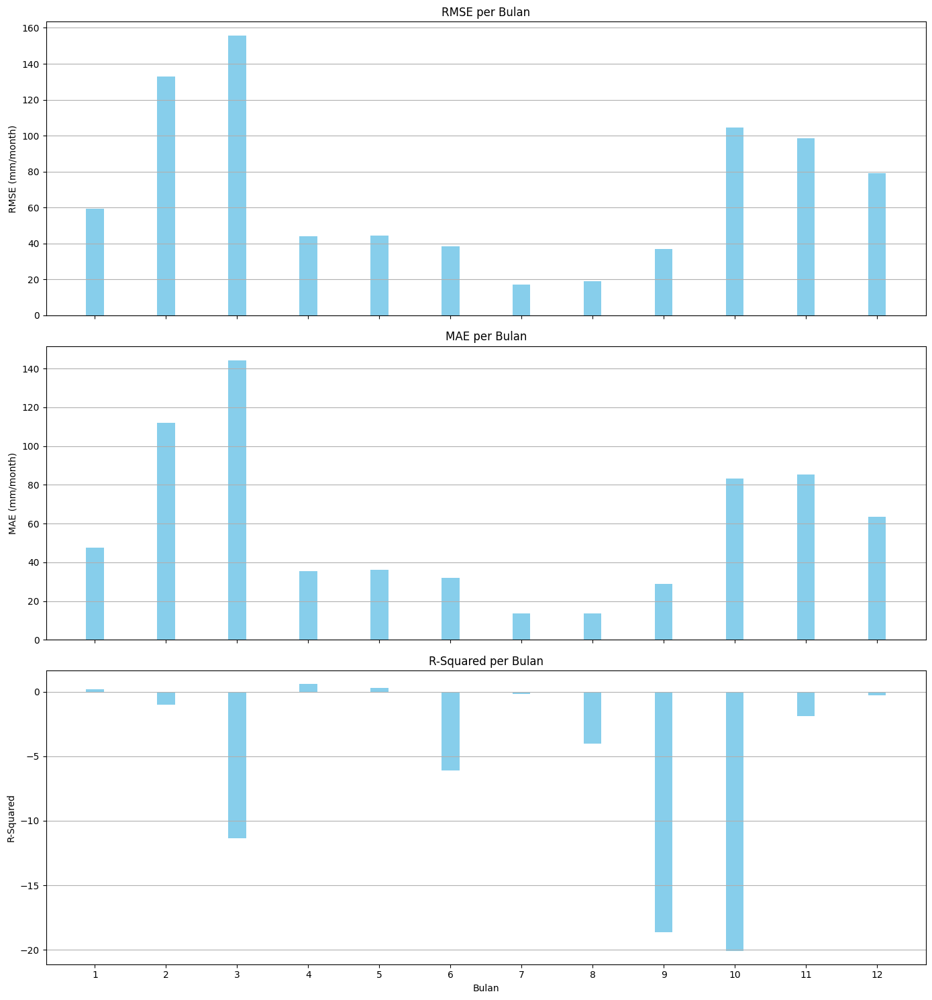

In [27]:
import numpy as np
import matplotlib.pyplot as plt

months = metrics_yr['month']
bar_width = 0.25
x = np.arange(len(months))

fig, axs = plt.subplots(3, 1, figsize=(14, 15), sharex=True)

# RMSE
axs[0].bar(x, metrics_yr['rmse'], width=bar_width, color='skyblue')
axs[0].set_ylabel('RMSE (mm/month)')
axs[0].set_title('RMSE per Bulan')
axs[0].set_xticks(x)
axs[0].set_xticklabels(months)
axs[0].grid(True, axis='y')

# MAE
axs[1].bar(x, metrics_yr['mae'], width=bar_width, color='skyblue')
axs[1].set_ylabel('MAE (mm/month)')
axs[1].set_title('MAE per Bulan')
axs[1].set_xticks(x)
axs[1].set_xticklabels(months)
axs[1].grid(True, axis='y')

# R2
axs[2].bar(x, metrics_yr['r2'], width=bar_width, color='skyblue')
axs[2].set_ylabel('R-Squared')
axs[2].set_xlabel('Bulan')
axs[2].set_title('R-Squared per Bulan')
axs[2].set_xticks(x)
axs[2].set_xticklabels(months)
axs[2].grid(True, axis='y')

plt.tight_layout()
plt.show()

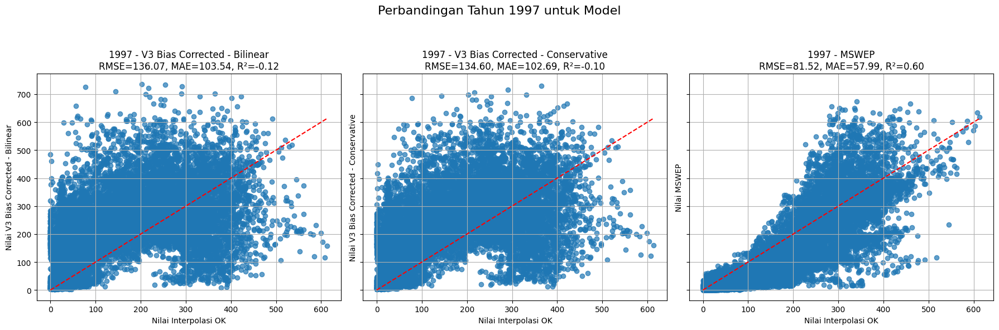

In [28]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

all_models = ['pr_bilinear', 'pr_v3_bc', 'pr_mswep']
model_titles = {
    'pr_bilinear': 'V3 Bias Corrected - Bilinear',
    'pr_v3_bc': 'V3 Bias Corrected - Conservative',
    'pr_mswep': 'MSWEP'
}

fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for i, model in enumerate(all_models):
    ok_true = merged['rainfall']
    pred = merged[model]
    rmse = np.sqrt(mean_squared_error(ok_true, pred))
    mae = mean_absolute_error(ok_true, pred)
    r2 = r2_score(ok_true, pred)
    axs[i].scatter(ok_true, pred, alpha=0.7)
    axs[i].plot([ok_true.min(), ok_true.max()], [ok_true.min(), ok_true.max()], 'r--')
    axs[i].set_xlabel('Nilai Interpolasi OK')
    axs[i].set_ylabel(f'Nilai {model_titles.get(model, model)}')
    axs[i].set_title(f"{year} - {model_titles.get(model, model)}\nRMSE={rmse:.2f}, MAE={mae:.2f}, R²={r2:.2f}")
    axs[i].grid(True)
fig.suptitle(f'Perbandingan Tahun {year} untuk Model', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()

## All Years

##### Parameter and Variabel

In [60]:
uk_results = pd.read_csv("UK_results/Masked/kriging_results_masked.csv")
uk_results['lat'] = uk_results['lat'].round(1)
uk_results['lon'] = uk_results['lon'].round(1)
uk_results = uk_results.drop(columns=['geometry', 'uncertainty', 'variogram_model', 'rmse', 'GID_0', 'COUNTRY'], errors='ignore')

In [61]:
v3_df = pd.read_csv("NorESM2-MM_Bias Corrected_masked.csv")
v3_ori = pd.read_csv("NorESM2-MM_ori_BC.csv")
v3_df = v3_df.rename(columns={'precipitation': 'pr_v3_bc'})
desimals = 1
v3_df['lat'] = v3_df['lat'].round(desimals)
v3_df['lon'] = v3_df['lon'].round(desimals)
v3_df['time'] = pd.to_datetime(v3_df['time'], format='%Y-%m-%d')
v3_df['year'] = v3_df['time'].dt.year
v3_df['month'] = v3_df['time'].dt.month

In [62]:
v3_ori = v3_ori.rename(columns={'pr_nor_ori_bc': 'pr_ori_bc'})
v3_ori['time'] = pd.to_datetime(v3_ori['time'])
v3_ori['year'] = v3_ori['time'].dt.year
v3_ori['month'] = v3_ori['time'].dt.month
ori_1997 = v3_ori[v3_ori['time'].dt.year == 1997]
ori_2000 = v3_ori[v3_ori['time'].dt.year == 2000]
ori_2013 = v3_ori[v3_ori['time'].dt.year == 2013]

In [63]:
mswep = pd.read_csv("data_mswep_regrid_masked.csv")
mswep = mswep.rename(columns={'precipitation': 'pr_mswep'})
mswep = mswep.drop(columns=['GID_0', 'COUNTRY'], errors='ignore')
mswep['lat'] = mswep['lat'].round(1)
mswep['lon'] = mswep['lon'].round(1)
mswep['time'] = pd.to_datetime(mswep['time'], format='%Y-%m-%d')
mswep['year'] = mswep['time'].dt.year
mswep['month'] = mswep['time'].dt.month

mswep_1997 = mswep[mswep['year'] == 1997]
mswep_2000 = mswep[mswep['year'] == 2000]
mswep_2013 = mswep[mswep['year'] == 2013]

In [64]:
df_bilinear = pd.read_csv("NorESM2-MM_bilinear_masked.csv")
df_bilinear = df_bilinear.rename(columns={'pr_nor_bilinear': 'pr_bilinear'})
df_bilinear['lat'] = df_bilinear['lat'].round(1)
df_bilinear['lon'] = df_bilinear['lon'].round(1)
df_bilinear['time'] = pd.to_datetime(df_bilinear['time'], format='%Y-%m-%d')
df_bilinear['year'] = df_bilinear['time'].dt.year
df_bilinear['month'] = df_bilinear['time'].dt.month
df_bilinear_1997 = df_bilinear[df_bilinear['year'] == 1997]
df_bilinear_2000 = df_bilinear[df_bilinear['year'] == 2000]
df_bilinear_2013 = df_bilinear[df_bilinear['year'] == 2013]

In [65]:
df_chirps = pd.read_csv("DATA CHIRPS/Cropped/chirps_merged_masked_1995-2014.csv")
df_chirps = df_chirps.drop(columns=['GID_0', 'COUNTRY', 'geometry'], errors='ignore')
df_chirps['lat'] = df_chirps['lat'].round(1)
df_chirps['lon'] = df_chirps['lon'].round(1)
df_chirps['time'] = pd.to_datetime(df_chirps['time'], format='%Y-%m-%d')
df_chirps['year'] = df_chirps['time'].dt.year
df_chirps['month'] = df_chirps['time'].dt.month
df_chirps = df_chirps.rename(columns={'precip': 'pr_chirps'})

##### Check

In [ ]:
# Example: merge for year only to avoid MemoryError

year = 1999

uk_results_yr = uk_results[uk_results['year'] == year]
v3_df_yr = v3_df[v3_df['year'] == year]
v3_ori_yr = v3_ori[v3_ori['year'] == year]
mswep_yr = mswep[mswep['year'] == year]
df_bilinear_yr = df_bilinear[df_bilinear['year'] == year]
df_chirps_yr = df_chirps[df_chirps['year'] == year]

# Make sure lon, lat, and month are the same dtype in all DataFrames
for df in [ok_results_yr, v3_df_yr, v3_ori_yr, mswep_yr, df_bilinear_yr, df_chirps_yr]:
    df['month'] = df['month'].astype(int)
    df['lon'] = df['lon'].astype(float)
    df['lat'] = df['lat'].astype(float)

# Merge on lon, lat, and month
merged = pd.merge(
    ok_results_yr,
    v3_df_yr[['lon', 'lat', 'month', 'pr_v3_bc']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged = pd.merge(
    merged,
    v3_ori_yr[['lon', 'lat', 'month', 'pr_ori_bc']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged = pd.merge(
    merged,
    mswep_yr[['lon', 'lat', 'month', 'pr_mswep']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged = pd.merge(
    merged,
    df_bilinear_yr[['lon', 'lat', 'month', 'pr_bilinear']],
    on=['lon', 'lat', 'month'],
    how='inner'
)
merged = pd.merge(
    merged,
    df_chirps_yr[['lon', 'lat', 'month', 'pr_chirps']],
    on=['lon', 'lat', 'month'],
    how='inner'
)

C:\Users\allam\AppData\Local\Temp\ipykernel_29460\3028570440.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df['month'].astype(int)
C:\Users\allam\AppData\Local\Temp\ipykernel_29460\3028570440.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lon'] = df['lon'].astype(float)
C:\Users\allam\AppData\Local\Temp\ipykernel_29460\3028570440.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

true = 'pr_mswep'
test = 'rainfall'

def metrics(x):
    rmse = np.sqrt(mean_squared_error(x[true], x[test]))
    mae = mean_absolute_error(x[true], x[test])
    r2 = r2_score(x[true], x[test])
    return pd.Series({'rmse': rmse, 'mae': mae, 'r2': r2})

metrics_yr = merged.groupby('month').apply(metrics).reset_index()

C:\Users\allam\AppData\Local\Temp\ipykernel_29460\4194996384.py:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_yr = merged.groupby('month').apply(metrics).reset_index()


In [ ]:
metrics_yr

,month,rmse,mae,r2
0,1,157.484500,127.857157,-0.811622
1,2,65.566068,51.662305,-0.014825
2,3,116.830341,91.001161,-0.055349
3,4,71.132088,58.110924,-0.230880
4,5,38.970503,29.588018,0.606256
5,6,24.874361,19.943920,0.597284
6,7,18.313895,14.366855,0.377582
7,8,41.203396,29.516882,-0.439713
8,9,34.475064,19.718214,0.152819
9,10,79.245822,60.814729,0.293120


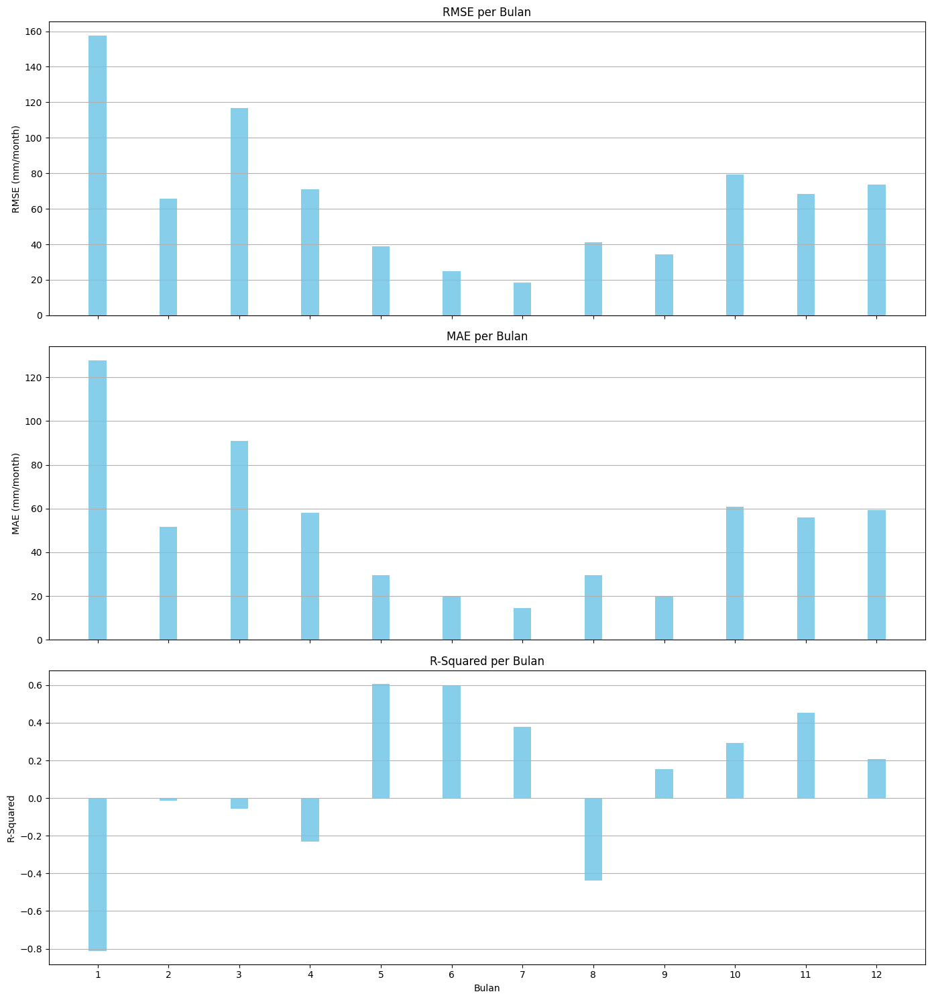

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

months = metrics_yr['month']
bar_width = 0.25
x = np.arange(len(months))

fig, axs = plt.subplots(3, 1, figsize=(14, 15), sharex=True)

# RMSE
axs[0].bar(x, metrics_yr['rmse'], width=bar_width, color='skyblue')
axs[0].set_ylabel('RMSE (mm/month)')
axs[0].set_title('RMSE per Bulan')
axs[0].set_xticks(x)
axs[0].set_xticklabels(months)
axs[0].grid(True, axis='y')

# MAE
axs[1].bar(x, metrics_yr['mae'], width=bar_width, color='skyblue')
axs[1].set_ylabel('MAE (mm/month)')
axs[1].set_title('MAE per Bulan')
axs[1].set_xticks(x)
axs[1].set_xticklabels(months)
axs[1].grid(True, axis='y')

# R2
axs[2].bar(x, metrics_yr['r2'], width=bar_width, color='skyblue')
axs[2].set_ylabel('R-Squared')
axs[2].set_xlabel('Bulan')
axs[2].set_title('R-Squared per Bulan')
axs[2].set_xticks(x)
axs[2].set_xticklabels(months)
axs[2].grid(True, axis='y')

plt.tight_layout()
plt.show()

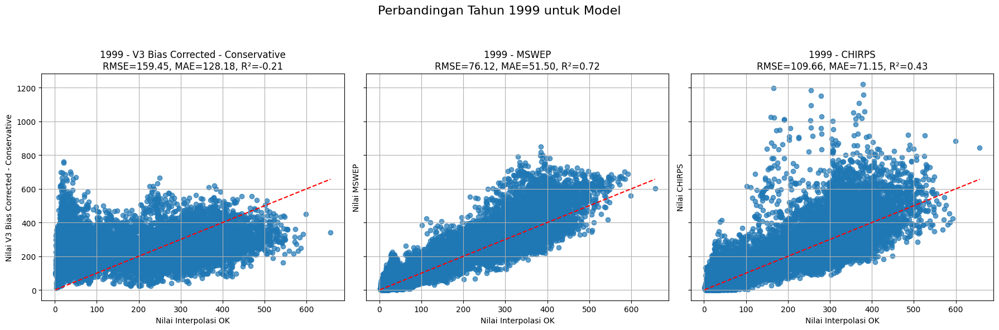

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

all_models = ['pr_v3_bc', 'pr_mswep', 'pr_chirps']
model_titles = {
    'pr_v3_bc': 'V3 Bias Corrected - Conservative',
    'pr_mswep': 'MSWEP',
    'pr_chirps': 'CHIRPS'
}

fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for i, model in enumerate(all_models):
    ok_true = merged['rainfall']
    pred = merged[model]
    rmse = np.sqrt(mean_squared_error(ok_true, pred))
    mae = mean_absolute_error(ok_true, pred)
    r2 = r2_score(ok_true, pred)
    axs[i].scatter(ok_true, pred, alpha=0.7)
    axs[i].plot([ok_true.min(), ok_true.max()], [ok_true.min(), ok_true.max()], 'r--')
    axs[i].set_xlabel('Nilai Interpolasi OK')
    axs[i].set_ylabel(f'Nilai {model_titles.get(model, model)}')
    axs[i].set_title(f"{year} - {model_titles.get(model, model)}\nRMSE={rmse:.2f}, MAE={mae:.2f}, R²={r2:.2f}")
    axs[i].grid(True)
fig.suptitle(f'Perbandingan Tahun {year} untuk Model', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()

##### Multiple Years

In [66]:
# List of years you want

#For any 1 year data, e.g., 1997, 2000, or 2013
#years = [2010] #Change this to your desired year

#For any 2-5 years data, e.g., 1995 to 1999 and 2000 to 2004
#years = [2008, 2009, 2010, 2011, 2012] #Change this to your desired years

# For 10 years data, 1995 to 2004 and 2005 to 2014
#years = [1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004]
#years = [2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]

# All years
years = list(range(1995, 2015))  # From 1995 to 2014

# Filter each DataFrame for those years
uk_results_sel = uk_results[uk_results['year'].isin(years)]
v3_df_sel = v3_df[v3_df['year'].isin(years)]
v3_ori_sel = v3_ori[v3_ori['year'].isin(years)]
mswep_sel = mswep[mswep['year'].isin(years)]
df_bilinear_sel = df_bilinear[df_bilinear['year'].isin(years)]
df_chirps_sel = df_chirps[df_chirps['year'].isin(years)]

# Make sure types match
for df in [uk_results_sel, v3_df_sel, v3_ori_sel, mswep_sel, df_bilinear_sel, df_chirps_sel]:
    df['month'] = df['month'].astype(int)
    df['year'] = df['year'].astype(int)
    df['lon'] = df['lon'].astype(float)
    df['lat'] = df['lat'].astype(float)

# Merge on lon, lat, month, year
merged = pd.merge(
    uk_results_sel,
    mswep_sel[['lon', 'lat', 'month', 'year', 'pr_mswep']],
    on=['lon', 'lat', 'month', 'year'],
    how='inner'
)
merged = pd.merge(
    merged,
    df_chirps_sel[['lon', 'lat', 'month', 'year', 'pr_chirps']],
    on=['lon', 'lat', 'month', 'year'],
    how='inner'
)
merged['bias_mswep'] = merged['pr_mswep'] - merged['rainfall']
merged['bias_chirps'] = merged['pr_chirps'] - merged['rainfall']

#merged.to_csv("UK_results/Masked/UK_merged_results-Spherical.csv", index=False)

In [67]:
import numpy as np

def quantile_mapping(obs, sim, sim_to_correct):
    obs_sorted = np.sort(obs)
    sim_sorted = np.sort(sim)
    quantiles = np.searchsorted(sim_sorted, sim_to_correct, side='right') / len(sim_sorted)
    corrected = np.quantile(obs_sorted, quantiles)
    return corrected

# Apply QM per grid cell and month (or just per month if you want)
qm_results = []
group_cols = ['lat', 'lon', 'month']

for key, group in merged.groupby(group_cols):
    mswep_vals = group['pr_mswep'].values
    chirps_vals = group['pr_chirps'].values
    # If not enough data, skip QM for this group
    if len(mswep_vals) < 10 or len(chirps_vals) < 10:
        group['pr_chirps_qm'] = chirps_vals
    else:
        group['pr_chirps_qm'] = quantile_mapping(mswep_vals, chirps_vals, chirps_vals)
    qm_results.append(group)

merged_qm = pd.concat(qm_results, ignore_index=True)
merged_qm['bias_chirps_qm'] = merged_qm['pr_chirps_qm'] - merged_qm['rainfall']

# Save result
merged_qm.to_csv("UK_results/Masked/UK_merged_results.csv", index=False)
merged = merged_qm

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import spearmanr
import numpy as np

treshold = 600  # Threshold for POD, FAR, CSI calculations

def nse(obs, sim):
    obs = np.asarray(obs)
    sim = np.asarray(sim)
    return 1 - np.sum((obs - sim) ** 2) / np.sum((obs - np.mean(obs)) ** 2)

def pod_far_csi(obs, sim, threshold):
    obs = np.asarray(obs)
    sim = np.asarray(sim)
    hits = np.sum((obs >= threshold) & (sim >= threshold))
    misses = np.sum((obs >= threshold) & (sim < threshold))
    false_alarms = np.sum((obs < threshold) & (sim >= threshold))
    pod = hits / (hits + misses) if (hits + misses) > 0 else np.nan
    far = false_alarms / (hits + false_alarms) if (hits + false_alarms) > 0 else np.nan
    csi = hits / (hits + misses + false_alarms) if (hits + misses + false_alarms) > 0 else np.nan
    return pod, far, csi

adaptive_thresholds = merged.groupby('month')['rainfall'].quantile(0.9).to_dict()

def metrics(x):
    # Get the month for this group
    month = x['month'].iloc[0]
    threshold = adaptive_thresholds[month]
    # MSWEP
    rmse_mswep = np.sqrt(mean_squared_error(x['pr_mswep'], x['rainfall']))
    mae_mswep = mean_absolute_error(x['pr_mswep'], x['rainfall'])
    r2_mswep = r2_score(x['pr_mswep'], x['rainfall'])
    nse_mswep = nse(x['rainfall'], x['pr_mswep'])
    spearman_mswep, _ = spearmanr(x['rainfall'], x['pr_mswep'])
    pod_mswep, far_mswep, csi_mswep = pod_far_csi(x['rainfall'], x['pr_mswep'], threshold=threshold)
    # CHIRPS
    rmse_chirps = np.sqrt(mean_squared_error(x['pr_chirps'], x['rainfall']))
    rmse_chirps_qm = np.sqrt(mean_squared_error(x['pr_chirps_qm'], x['rainfall']))
    mae_chirps = mean_absolute_error(x['pr_chirps'], x['rainfall'])
    mae_chirps_qm = mean_absolute_error(x['pr_chirps_qm'], x['rainfall'])
    r2_chirps = r2_score(x['pr_chirps'], x['rainfall'])
    nse_chirps = nse(x['rainfall'], x['pr_chirps'])
    spearman_chirps, _ = spearmanr(x['rainfall'], x['pr_chirps'])
    spearman_chirps_qm, _ = spearmanr(x['rainfall'], x['pr_chirps_qm'])
    pod_chirps, far_chirps, csi_chirps = pod_far_csi(x['rainfall'], x['pr_chirps'], threshold=threshold)
    return pd.Series({
        'rmse_mswep': rmse_mswep,
        'mae_mswep': mae_mswep,
        'r2_mswep': r2_mswep,
        'nse_mswep': nse_mswep,
        'spearman_mswep': spearman_mswep,
        'pod_mswep': pod_mswep,
        'far_mswep': far_mswep,
        'csi_mswep': csi_mswep,
        'rmse_chirps': rmse_chirps,
        'mae_chirps': mae_chirps,
        'rmse_chirps_qm': rmse_chirps_qm,
        'mae_chirps_qm': mae_chirps_qm,
        'r2_chirps': r2_chirps,
        'nse_chirps': nse_chirps,
        'spearman_chirps': spearman_chirps,
        'spearman_chirps_qm': spearman_chirps_qm,
        'pod_chirps': pod_chirps,
        'far_chirps': far_chirps,
        'csi_chirps': csi_chirps
    })

metrics_yr = merged.groupby(['year', 'month']).apply(metrics).reset_index()

# Calculate MAE Index and RMSE Index for each year
metrics_yr['mswep_mae_index'] = metrics_yr.groupby('year')['mae_mswep'].transform(lambda x: x - x.mean())
metrics_yr['mswep_rmse_index'] = metrics_yr.groupby('year')['rmse_mswep'].transform(lambda x: x - x.mean())
metrics_yr['chirps_mae_index'] = metrics_yr.groupby('year')['mae_chirps'].transform(lambda x: x - x.mean())
metrics_yr['chirps_rmse_index'] = metrics_yr.groupby('year')['rmse_chirps'].transform(lambda x: x - x.mean())

# Define months for reindexing
months = sorted(metrics_yr['month'].unique())

mswep_rmse_mean = metrics_yr.groupby('month')['mswep_rmse_index'].mean().reindex(months).values
mswep_mae_mean = metrics_yr.groupby('month')['mswep_mae_index'].mean().reindex(months).values
chirps_rmse_mean = metrics_yr.groupby('month')['chirps_rmse_index'].mean().reindex(months).values
chirps_mae_mean = metrics_yr.groupby('month')['chirps_mae_index'].mean().reindex(months).values

# For mean NSE and Spearman (optional, for plotting)
mswep_nse_mean = metrics_yr.groupby('month')['nse_mswep'].mean().reindex(months).values
chirps_nse_mean = metrics_yr.groupby('month')['nse_chirps'].mean().reindex(months).values
mswep_spearman_mean = metrics_yr.groupby('month')['spearman_mswep'].mean().reindex(months).values
chirps_spearman_mean = metrics_yr.groupby('month')['spearman_chirps'].mean().reindex(months).values

# For mean POD, FAR, CSI (optional, for plotting)
mswep_pod_mean = metrics_yr.groupby('month')['pod_mswep'].mean().reindex(months).values
mswep_far_mean = metrics_yr.groupby('month')['far_mswep'].mean().reindex(months).values
mswep_csi_mean = metrics_yr.groupby('month')['csi_mswep'].mean().reindex(months).values
chirps_pod_mean = metrics_yr.groupby('month')['pod_chirps'].mean().reindex(months).values
chirps_far_mean = metrics_yr.groupby('month')['far_chirps'].mean().reindex(months).values
chirps_csi_mean = metrics_yr.groupby('month')['csi_chirps'].mean().reindex(months).values

metrics_yr.to_csv("UK_results/Combined_UK_Metrics_1995_2014.csv")

C:\Users\allam\AppData\Local\Temp\ipykernel_29668\1156711158.py:68: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_yr = merged.groupby(['year', 'month']).apply(metrics).reset_index()


In [13]:
mean_pod_mswep = metrics_yr['pod_mswep'].mean()
mean_pod_chirps = metrics_yr['pod_chirps'].mean()
mean_far_mswep = metrics_yr['far_mswep'].mean()
mean_far_chirps = metrics_yr['far_chirps'].mean()
mean_csi_mswep = metrics_yr['csi_mswep'].mean()
mean_csi_chirps = metrics_yr['csi_chirps'].mean()

print(f"Mean POD MSWEP: {mean_pod_mswep:.4f}")
print(f"Mean POD CHIRPS: {mean_pod_chirps:.4f}")
print(f"Mean FAR MSWEP: {mean_far_mswep:.4f}")
print(f"Mean FAR CHIRPS: {mean_far_chirps:.4f}")
print(f"Mean CSI MSWEP: {mean_csi_mswep:.4f}")
print(f"Mean CSI CHIRPS: {mean_csi_chirps:.4f}")

Mean POD MSWEP: 0.6149
Mean POD CHIRPS: 0.6525
Mean FAR MSWEP: 0.8157
Mean FAR CHIRPS: 0.8699
Mean CSI MSWEP: 0.1397
Mean CSI CHIRPS: 0.1143


##### Bias

In [27]:
import matplotlib.pyplot as plt

for year in years:
    for month in range(1, 13):
        df_plot = merged[(merged['year'] == year) & (merged['month'] == month)]
        if df_plot.empty:
            continue
        # Get RMSE and MAE for this year and month
        row = metrics_yr[(metrics_yr['year'] == year) & (metrics_yr['month'] == month)]
        if not row.empty:
            rmse_mswep = row['rmse_mswep'].values[0]
            mae_mswep = row['mae_mswep'].values[0]
            rmse_chirps = row['rmse_chirps'].values[0]
            mae_chirps = row['mae_chirps'].values[0]
        else:
            rmse_mswep = mae_mswep = rmse_chirps = mae_chirps = float('nan')
        vmin = -200  # adjust as needed
        vmax = 200   # adjust as needed
        fig, axs = plt.subplots(2, 1, figsize=(10, 7), sharex=True, sharey=True)
        scatter = []
        for i, (bias_col, title, rmse, mae) in enumerate([
            ('bias_mswep', 'Bias MSWEP - Station Interpolation', rmse_mswep, mae_mswep),
            ('bias_chirps', 'Bias CHIRPS - Station Interpolation', rmse_chirps, mae_chirps)
        ]):
            java.plot(ax=axs[i], color='lightgray', edgecolor='black', linewidth=0.8)
            axs[i].set_facecolor('lightgray')
            sc = axs[i].scatter(
                df_plot['lon'], df_plot['lat'],
                c=df_plot[bias_col], cmap='bwr', marker='s', s=42,
                vmin=vmin, vmax=vmax, edgecolor='none'
            )
            axs[i].set_xlim(minx, maxx)
            axs[i].set_ylim(miny, maxy)
            axs[i].set_title(f'{title} ({year}, Month {month})\nRMSE={rmse:.2f}, MAE={mae:.2f}')
            axs[i].set_xlabel('Longitude')
            axs[i].set_ylabel('Latitude')
            scatter.append(sc)
        plt.tight_layout()
        #plt.subplots_adjust(left=-1)
        cbar = fig.colorbar(
            scatter[0], ax=axs, orientation='vertical', pad=0.04,
            label='Bias (mm/month)'
        )
        plt.savefig(f'UK_results/bias_plot/Bias_{year}_Month_{month}.png')
        plt.close()

In [53]:
import matplotlib.pyplot as plt

for year in years:
    fig, axes = plt.subplots(4, 3, figsize=(18, 13), sharex=True, sharey=True)
    axes = axes.flatten()
    vmin = -200  # adjust as needed
    vmax = 200   # adjust as needed

    for month in range(1, 13):
        df_plot = merged[(merged['year'] == year) & (merged['month'] == month)]
        ax = axes[month - 1]
        if df_plot.empty:
            ax.axis('off')
            continue

        # Get RMSE and MAE for this year and month
        row = metrics_yr[(metrics_yr['year'] == year) & (metrics_yr['month'] == month)]
        if not row.empty:
            rmse_mswep = row['rmse_mswep'].values[0]
            mae_mswep = row['mae_mswep'].values[0]
        else:
            rmse_mswep = mae_mswep = float('nan')

        java.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.8)
        ax.set_facecolor('lightgray')
        sc = ax.scatter(
            df_plot['lon'], df_plot['lat'],
            c=df_plot['bias_mswep'], cmap='bwr', marker='s', s=42,
            vmin=vmin, vmax=vmax, edgecolor='none'
        )
        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)
        ax.set_title(f'Bulan {month}\nRMSE={rmse_mswep:.2f}, MAE={mae_mswep:.2f}', fontsize=10)
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

    # Remove empty subplots if any
    for i in range(len(axes)):
        if i >= 12:
            axes[i].axis('off')

    fig.suptitle(f'Bias MSWEP - Interpolasi UK Tahun {year}', fontsize=20)
    fig.tight_layout(rect=[0, 0.05, 1, 1])
    cbar = fig.colorbar(sc, ax=axes, orientation='horizontal', fraction=0.03, pad=0.08, label='Bias (mm/month)')
    plt.savefig(f'UK_results/bias_plot/Bias_MSWEP_{year}.png')
    print(f"Saved bias plot for year {year}")
    plt.close(fig)

Saved bias plot for year 2005
Saved bias plot for year 2006
Saved bias plot for year 2007
Saved bias plot for year 2008
Saved bias plot for year 2009
Saved bias plot for year 2010
Saved bias plot for year 2011
Saved bias plot for year 2012
Saved bias plot for year 2013
Saved bias plot for year 2014


In [54]:
import matplotlib.pyplot as plt

for year in years:
    fig, axes = plt.subplots(4, 3, figsize=(18, 13), sharex=True, sharey=True)
    axes = axes.flatten()
    vmin = -200  # adjust as needed
    vmax = 200   # adjust as needed

    for month in range(1, 13):
        df_plot = merged[(merged['year'] == year) & (merged['month'] == month)]
        ax = axes[month - 1]
        if df_plot.empty:
            ax.axis('off')
            continue

        # Get RMSE and MAE for this year and month
        row = metrics_yr[(metrics_yr['year'] == year) & (metrics_yr['month'] == month)]
        if not row.empty:
            rmse_mswep = row['rmse_chirps'].values[0]
            mae_mswep = row['mae_chirps'].values[0]
        else:
            rmse_mswep = mae_mswep = float('nan')

        java.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.8)
        ax.set_facecolor('lightgray')
        sc = ax.scatter(
            df_plot['lon'], df_plot['lat'],
            c=df_plot['bias_chirps'], cmap='bwr', marker='s', s=42,
            vmin=vmin, vmax=vmax, edgecolor='none'
        )
        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)
        ax.set_title(f'Bulan {month}\nRMSE={rmse_mswep:.2f}, MAE={mae_mswep:.2f}', fontsize=10)
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')

    # Remove empty subplots if any
    for i in range(len(axes)):
        if i >= 12:
            axes[i].axis('off')

    fig.suptitle(f'Bias CHIRPS - Interpolasi UK Tahun {year}', fontsize=20)
    fig.tight_layout(rect=[0, 0.05, 1, 1])
    cbar = fig.colorbar(sc, ax=axes, orientation='horizontal', fraction=0.03, pad=0.08, label='Bias (mm/month)')
    plt.savefig(f'UK_results/bias_plot/Bias_CHIRPS_{year}.png')
    print(f"Saved bias plot for year {year}")
    plt.close(fig)

Saved bias plot for year 2005
Saved bias plot for year 2006
Saved bias plot for year 2007
Saved bias plot for year 2008
Saved bias plot for year 2009
Saved bias plot for year 2010
Saved bias plot for year 2011
Saved bias plot for year 2012
Saved bias plot for year 2013
Saved bias plot for year 2014


##### MAE-RMSE

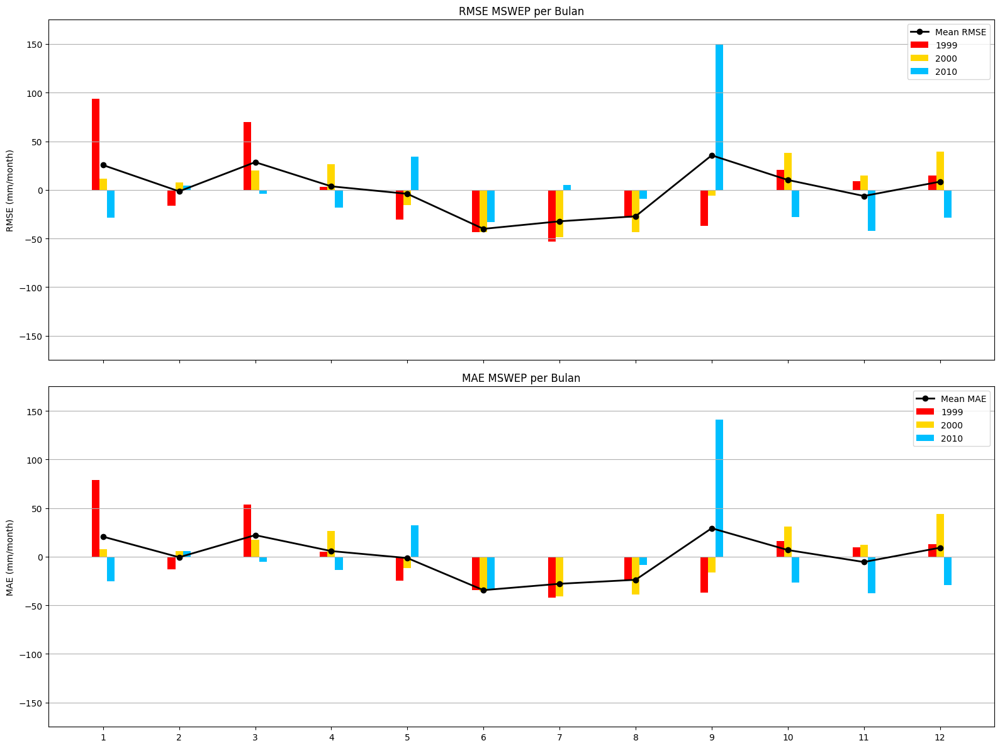

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Pivot the metrics_yr DataFrame for grouped bar plotting
metrics_pivot = metrics_yr.pivot(index='month', columns='year')

months = metrics_pivot.index
years = metrics_pivot.columns.levels[1]
bar_width = 0.1
x = np.arange(len(months))

fig, axs = plt.subplots(2, 1, figsize=(16, 12), sharex=True)

colors = ['red', 'gold', 'deepskyblue', 'chocolate', 'limegreen', 'darkorange', 'navy', 'blueviolet', 'purple', 'magenta']

# RMSE
for i, year in enumerate(years):
    axs[0].bar(x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
               metrics_pivot['mswep_rmse_index', year], width=bar_width, label=str(year), color=colors[i % len(colors)])
axs[0].plot(x, mswep_rmse_mean, color='black', marker='o', linewidth=2, label='Mean RMSE')
axs[0].set_ylabel('RMSE (mm/month)')
axs[0].set_title('RMSE MSWEP per Bulan')
axs[0].set_xticks(x)
axs[0].set_ylim(-175, 175)
axs[0].set_xticklabels(months)
axs[0].legend()
axs[0].grid(True, axis='y')

# MAE
for i, year in enumerate(years):
    axs[1].bar(x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
               metrics_pivot['mswep_mae_index', year], width=bar_width, label=str(year), color=colors[i % len(colors)])
axs[1].plot(x, mswep_mae_mean, color='black', marker='o', linewidth=2, label='Mean MAE')
axs[1].set_ylabel('MAE (mm/month)')
axs[1].set_title('MAE MSWEP per Bulan')
axs[1].set_xticks(x)
axs[1].set_ylim(-175, 175)
axs[1].set_xticklabels(months)
axs[1].legend()
axs[1].grid(True, axis='y')

# R2
#for i, year in enumerate(years):
#    axs[2].bar(x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
#               metrics_pivot['r2', year], width=bar_width, label=str(year), color=colors[i % len(colors)])
#axs[2].set_ylabel('R-Squared')
#axs[2].set_xlabel('Bulan')
#axs[2].set_title('R-Squared per Bulan')
#axs[2].set_xticks(x)
#axs[2].set_xticklabels(months)
#axs[2].legend()
#axs[2].grid(True, axis='y')

plt.tight_layout()
plt.show()

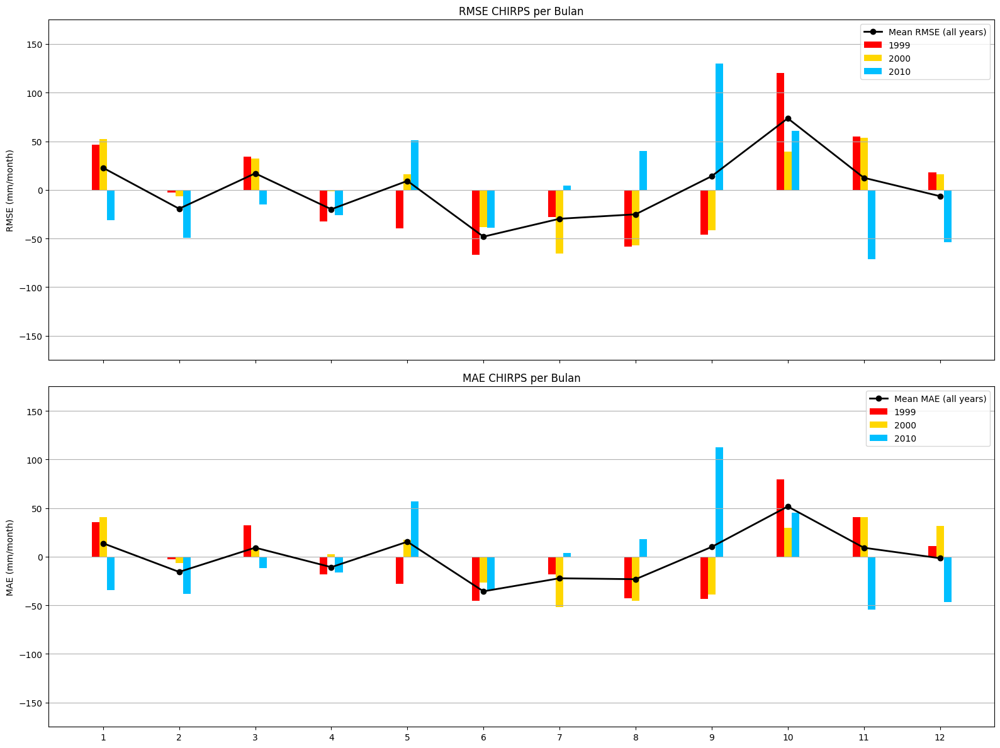

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Pivot the metrics_yr DataFrame for grouped bar plotting
metrics_pivot = metrics_yr.pivot(index='month', columns='year')

months = metrics_pivot.index
years = metrics_pivot.columns.levels[1]
bar_width = 0.1
x = np.arange(len(months))

fig, axs = plt.subplots(2, 1, figsize=(16, 12), sharex=True)

colors = ['red', 'gold', 'deepskyblue', 'chocolate', 'limegreen', 'darkorange', 'navy', 'blueviolet', 'purple', 'magenta']

# RMSE CHIRPS
for i, year in enumerate(years):
    axs[0].bar(
        x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
        metrics_pivot['chirps_rmse_index', year],
        width=bar_width, label=str(year), color=colors[i % len(colors)]
    )
axs[0].plot(x, chirps_rmse_mean, color='black', marker='o', linewidth=2, label='Mean RMSE (all years)')
axs[0].set_ylabel('RMSE (mm/month)')
axs[0].set_title('RMSE CHIRPS per Bulan')
axs[0].set_xticks(x)
axs[0].set_xticklabels(months)
axs[0].set_ylim(-175, 175)
axs[0].legend()
axs[0].grid(True, axis='y')

# MAE CHIRPS
for i, year in enumerate(years):
    axs[1].bar(
        x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
        metrics_pivot['chirps_mae_index', year],
        width=bar_width, label=str(year), color=colors[i % len(colors)]
    )
axs[1].plot(x, chirps_mae_mean, color='black', marker='o', linewidth=2, label='Mean MAE (all years)')
axs[1].set_ylabel('MAE (mm/month)')
axs[1].set_title('MAE CHIRPS per Bulan')
axs[1].set_xticks(x)
axs[1].set_ylim(-175, 175)
axs[1].set_xticklabels(months)
axs[1].legend()
axs[1].grid(True, axis='y')

plt.tight_layout()
plt.show()

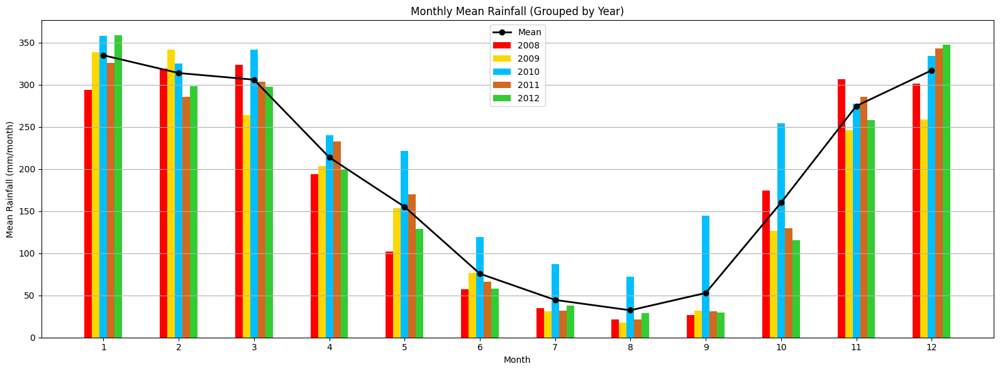

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Prepare data
monthly_mean_yr = merged.groupby(['year', 'month'])['rainfall'].mean().reset_index()
years = sorted(monthly_mean_yr['year'].unique())
months = range(1, 13)
bar_width = 0.1
x = np.arange(len(months))

fig, ax = plt.subplots(figsize=(16, 6))

colors = ['red', 'gold', 'deepskyblue', 'chocolate', 'limegreen', 'darkorange', 'navy', 'blueviolet', 'purple', 'magenta']

for i, year in enumerate(years):
    data = monthly_mean_yr[monthly_mean_yr['year'] == year].set_index('month').reindex(months)
    ax.bar(x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
           data['rainfall'], width=bar_width, label=str(year), color=colors[i % len(colors)])

# Optionally plot the all-year mean as a line
all_mean = monthly_mean_yr.groupby('month')['rainfall'].mean().reindex(months)
ax.plot(x, all_mean, color='black', marker='o', linewidth=2, label='Mean')

ax.set_xticks(x)
ax.set_xticklabels(months)
ax.set_xlabel('Month')
ax.set_ylabel('Mean Rainfall (mm/month)')
ax.set_title('Monthly Mean Rainfall (Grouped by Year)')
ax.legend()
ax.grid(True, axis='y')
plt.tight_layout()
plt.show()

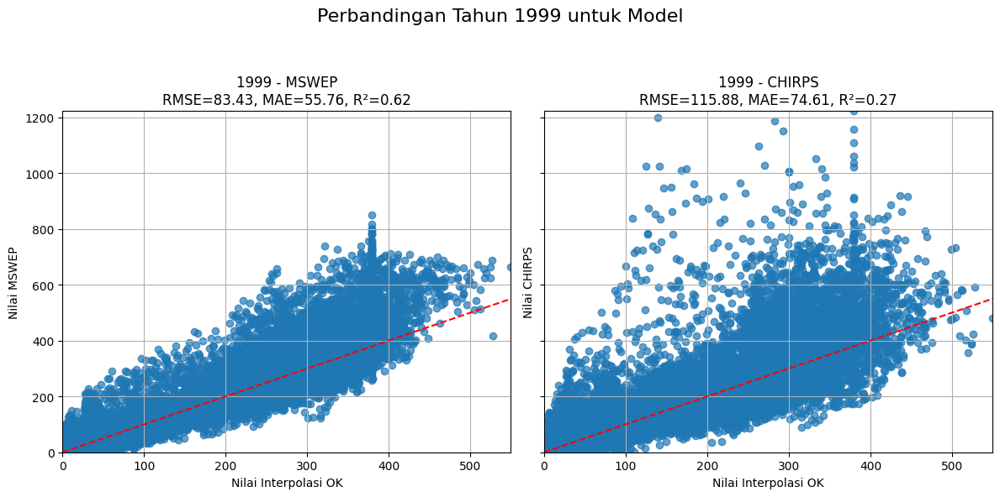

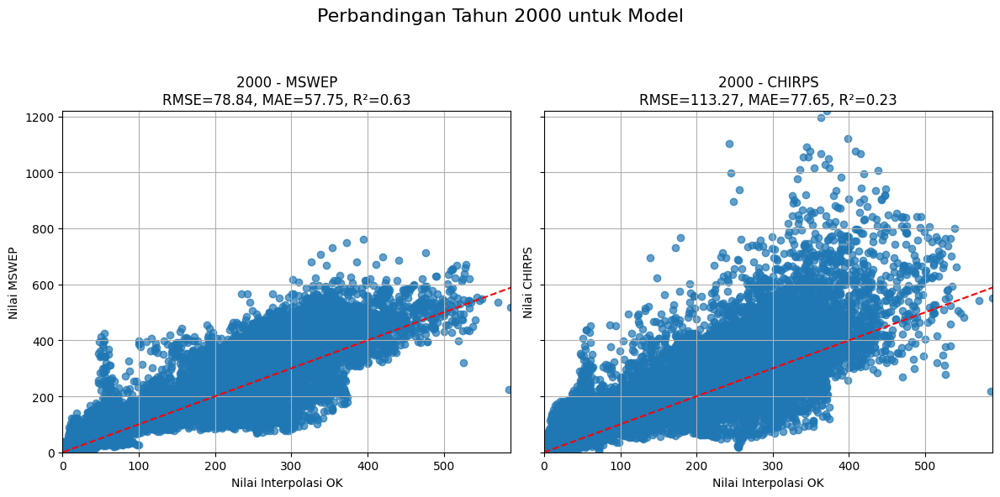

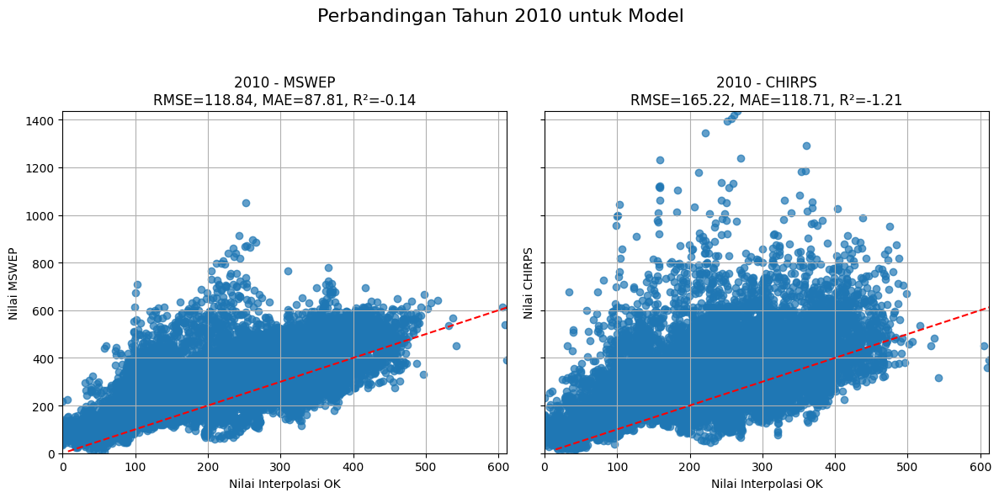

In [37]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

all_models = ['pr_mswep', 'pr_chirps']
model_titles = {
    'pr_mswep': 'MSWEP',
    'pr_chirps': 'CHIRPS'
}

for year in merged['year'].unique():
    df_year = merged[merged['year'] == year]
    fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
    for i, model in enumerate(all_models):
        ok_true = df_year['rainfall']
        pred = df_year[model]
        rmse = np.sqrt(mean_squared_error(ok_true, pred))
        mae = mean_absolute_error(ok_true, pred)
        r2 = r2_score(ok_true, pred)
        axs[i].scatter(ok_true, pred, alpha=0.7)
        axs[i].plot([pred.min(), pred.max()], [pred.min(), pred.max()], 'r--')
        axs[i].set_xlabel('Nilai Interpolasi OK')
        axs[i].set_ylabel(f'Nilai {model_titles.get(model, model)}')
        axs[i].set_title(f"{year} - {model_titles.get(model, model)}\nRMSE={rmse:.2f}, MAE={mae:.2f}, R²={r2:.2f}")
        axs[i].set_xlim(0, ok_true.max())
        axs[i].set_ylim(0, pred.max())
        axs[i].grid(True)
    fig.suptitle(f'Perbandingan Tahun {year} untuk Model', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

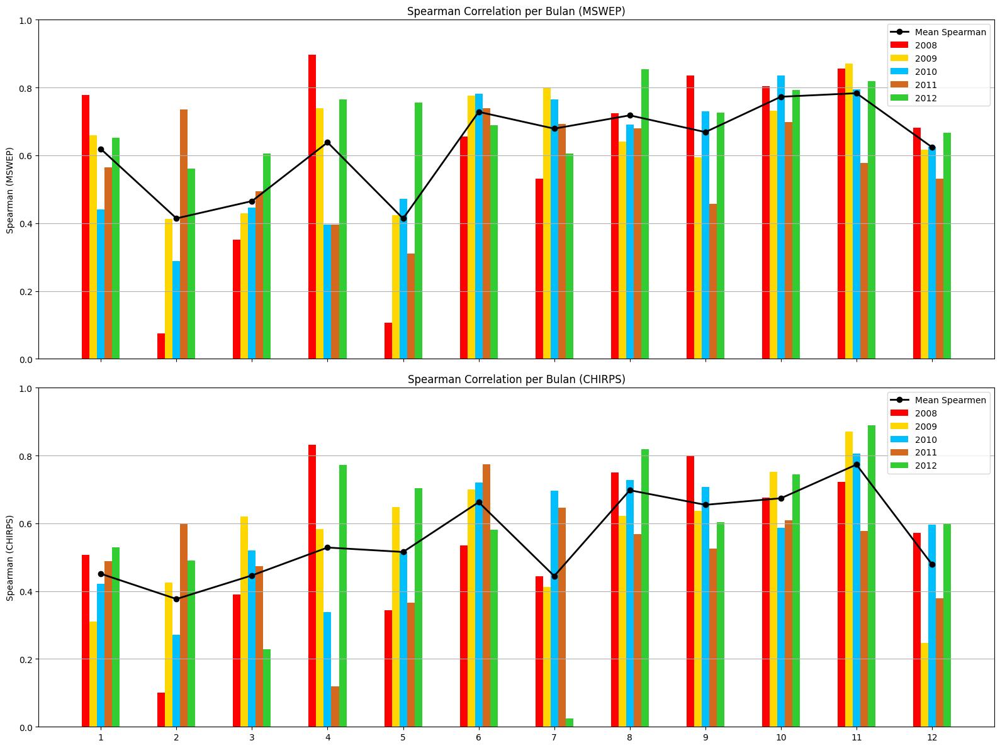

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# Pivot the metrics_yr DataFrame for grouped bar plotting
metrics_pivot = metrics_yr.pivot(index='month', columns='year')

months = metrics_pivot.index
years = metrics_pivot.columns.levels[1]
bar_width = 0.1
x = np.arange(len(months))

fig, axs = plt.subplots(2, 1, figsize=(16, 12), sharex=True)

colors = ['red', 'gold', 'deepskyblue', 'chocolate', 'limegreen', 'darkorange', 'navy', 'blueviolet', 'purple', 'magenta']

# SPEARMAN MSWEP
for i, year in enumerate(years):
    axs[0].bar(
        x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
        metrics_pivot['spearman_mswep', year],
        width=bar_width, label=str(year), color=colors[i % len(colors)]
    )
axs[0].plot(x, mswep_spearman_mean, color='black', marker='o', linewidth=2, label='Mean Spearman')
axs[0].set_ylabel('Spearman (MSWEP)')
axs[0].set_title('Spearman Correlation per Bulan (MSWEP)')
axs[0].set_xticks(x)
axs[0].set_xticklabels(months)
axs[0].set_ylim(0, 1)
axs[0].legend()
axs[0].grid(True, axis='y')

# NSE MSWEP
for i, year in enumerate(years):
    axs[1].bar(
        x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
        metrics_pivot['spearman_chirps', year],
        width=bar_width, label=str(year), color=colors[i % len(colors)]
    )
axs[1].plot(x, chirps_spearman_mean, color='black', marker='o', linewidth=2, label='Mean Spearmen')
axs[1].set_ylabel('Spearman (CHIRPS)')
axs[1].set_title('Spearman Correlation per Bulan (CHIRPS)')
axs[1].set_xticks(x)
axs[1].set_xticklabels(months)
axs[1].set_ylim(0, 1)
axs[1].legend()
axs[1].grid(True, axis='y')

plt.tight_layout()
plt.show()

#### Merge Data

In [29]:
metrics1 = pd.read_csv("UK_results/UK_Evaluting_Metrics_0514.csv")
metrics2 = pd.read_csv("UK_results/UK_Evaluting_Metrics_9504.csv")

# Menggabungkan kedua DataFrame
metrics = pd.concat([metrics2, metrics1], ignore_index=True)
metrics = metrics.drop(columns='Unnamed: 0')

# Menyimpan hasil gabungan ke file baru (opsional)
metrics.to_csv("UK_results/Combined_UK_Metrics_1995_2014.csv", index=False)

In [30]:
#All Metrics Mean

mean_rmse_mswep = metrics['rmse_mswep'].mean()
mean_rmse_chirps = metrics['rmse_chirps'].mean()
mean_mae_mswep = metrics['mae_mswep'].mean()
mean_mae_chirps = metrics['mae_chirps'].mean()
mean_spearman_mswep = metrics['spearman_mswep'].mean()
mean_spearman_chirps = metrics['spearman_chirps'].mean()

print(f"Mean RMSE MSWEP: {mean_rmse_mswep:.2f} mm/month")
print(f"Mean RMSE CHIRPS: {mean_rmse_chirps:.2f} mm/month")
print(f"Mean MAE MSWEP: {mean_mae_mswep:.2f} mm/month")
print(f"Mean MAE CHIRPS: {mean_mae_chirps:.2f} mm/month")
print(f"Mean Spearman MSWEP: {mean_spearman_mswep:.2f}")
print(f"Mean Spearman CHIRPS: {mean_spearman_chirps:.2f}")

Mean RMSE MSWEP: 68.14 mm/month
Mean RMSE CHIRPS: 99.18 mm/month
Mean MAE MSWEP: 53.59 mm/month
Mean MAE CHIRPS: 73.11 mm/month
Mean Spearman MSWEP: 0.64
Mean Spearman CHIRPS: 0.56


In [31]:
# Define months for reindexing
months = sorted(metrics['month'].unique())

mswep_rmse_mean = metrics.groupby('month')['mswep_rmse_index'].mean().reindex(months).values
mswep_mae_mean = metrics.groupby('month')['mswep_mae_index'].mean().reindex(months).values
chirps_rmse_mean = metrics.groupby('month')['chirps_rmse_index'].mean().reindex(months).values
chirps_mae_mean = metrics.groupby('month')['chirps_mae_index'].mean().reindex(months).values

# For mean NSE and Spearman (optional, for plotting)
mswep_nse_mean = metrics.groupby('month')['nse_mswep'].mean().reindex(months).values
chirps_nse_mean = metrics.groupby('month')['nse_chirps'].mean().reindex(months).values
mswep_spearman_mean = metrics.groupby('month')['spearman_mswep'].mean().reindex(months).values
chirps_spearman_mean = metrics.groupby('month')['spearman_chirps'].mean().reindex(months).values

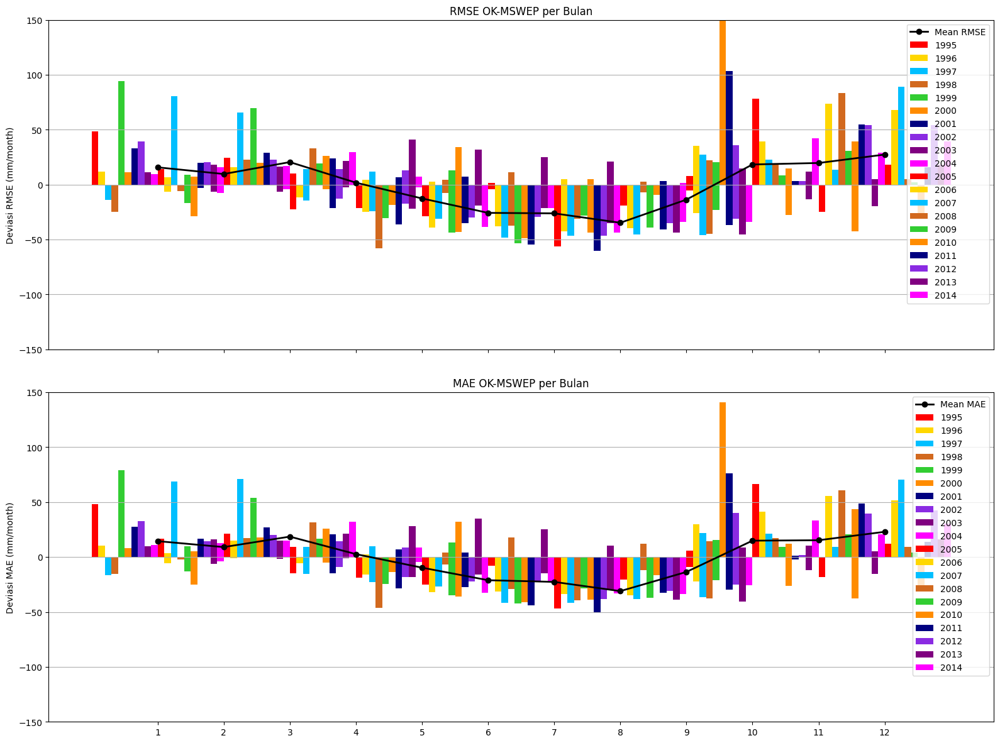

In [32]:
# Pivot the metrics_yr DataFrame for grouped bar plotting
#years = [1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004]
#years = [2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]
#metrics = metrics[metrics['year'].isin(years)]
metrics_pivot = metrics.pivot(index='month', columns='year')

months = metrics_pivot.index
years = metrics_pivot.columns.levels[1]
bar_width = 0.1
x = np.arange(len(months))

fig, axs = plt.subplots(2, 1, figsize=(16, 12), sharex=True)

colors = ['red', 'gold', 'deepskyblue', 'chocolate', 'limegreen', 'darkorange', 'navy', 'blueviolet', 'purple', 'magenta']

# RMSE CHIRPS
for i, year in enumerate(years):
    axs[0].bar(
        x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
        metrics_pivot['mswep_rmse_index', year],
        width=bar_width, label=str(year), color=colors[i % len(colors)]
    )
axs[0].plot(x, mswep_rmse_mean, color='black', marker='o', linewidth=2, label='Mean RMSE')
axs[0].set_ylabel('Deviasi RMSE (mm/month)')
axs[0].set_title('RMSE OK-MSWEP per Bulan')
axs[0].set_xticks(x)
axs[0].set_xticklabels(months)
axs[0].set_ylim(-150, 150)
axs[0].legend()
axs[0].grid(True, axis='y')

# MAE CHIRPS
for i, year in enumerate(years):
    axs[1].bar(
        x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
        metrics_pivot['mswep_mae_index', year],
        width=bar_width, label=str(year), color=colors[i % len(colors)]
    )
axs[1].plot(x, mswep_mae_mean, color='black', marker='o', linewidth=2, label='Mean MAE')
axs[1].set_ylabel('Deviasi MAE (mm/month)')
axs[1].set_title('MAE OK-MSWEP per Bulan')
axs[1].set_xticks(x)
axs[1].set_ylim(-150, 150)
axs[1].set_xticklabels(months)
axs[1].legend()
axs[1].grid(True, axis='y')

plt.tight_layout()
plt.show()

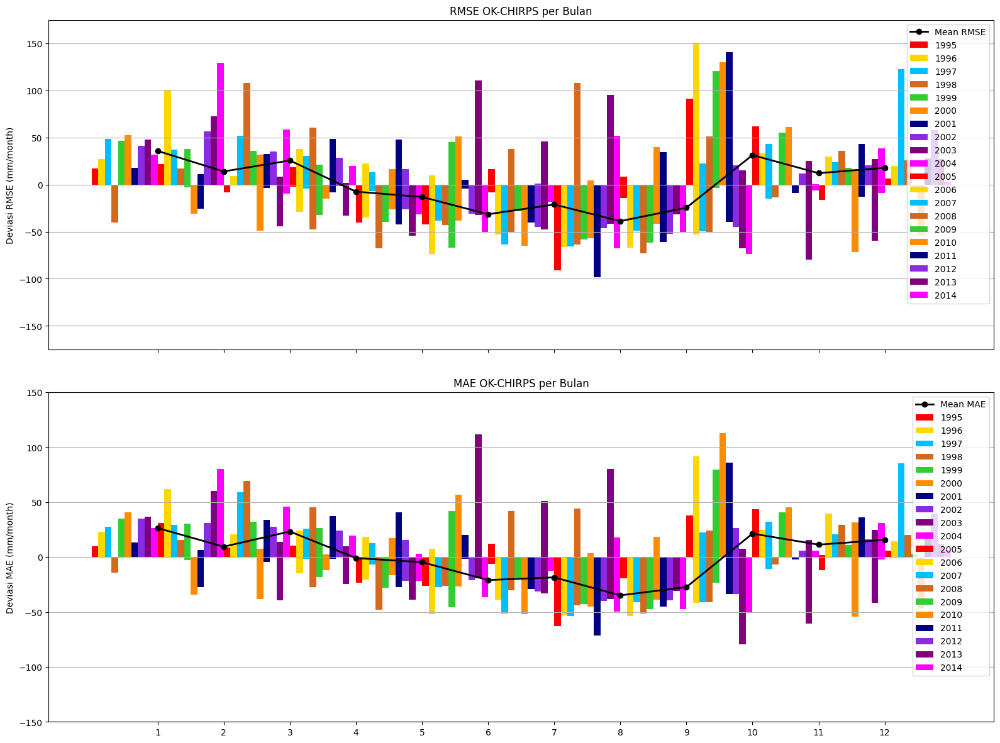

In [33]:
# Pivot the metrics_yr DataFrame for grouped bar plotting
metrics_pivot = metrics.pivot(index='month', columns='year')

months = metrics_pivot.index
years = metrics_pivot.columns.levels[1]
bar_width = 0.1
x = np.arange(len(months))

fig, axs = plt.subplots(2, 1, figsize=(16, 12), sharex=True)

colors = ['red', 'gold', 'deepskyblue', 'chocolate', 'limegreen', 'darkorange', 'navy', 'blueviolet', 'purple', 'magenta']

# RMSE CHIRPS
for i, year in enumerate(years):
    axs[0].bar(
        x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
        metrics_pivot['chirps_rmse_index', year],
        width=bar_width, label=str(year), color=colors[i % len(colors)]
    )
axs[0].plot(x, chirps_rmse_mean, color='black', marker='o', linewidth=2, label='Mean RMSE')
axs[0].set_ylabel('Deviasi RMSE (mm/month)')
axs[0].set_title('RMSE OK-CHIRPS per Bulan')
axs[0].set_xticks(x)
axs[0].set_xticklabels(months)
axs[0].set_ylim(-175, 175)
axs[0].legend()
axs[0].grid(True, axis='y')

# MAE CHIRPS
for i, year in enumerate(years):
    axs[1].bar(
        x + i*bar_width - (len(years)/2)*bar_width + bar_width/2,
        metrics_pivot['chirps_mae_index', year],
        width=bar_width, label=str(year), color=colors[i % len(colors)]
    )
axs[1].plot(x, chirps_mae_mean, color='black', marker='o', linewidth=2, label='Mean MAE')
axs[1].set_ylabel('Deviasi MAE (mm/month)')
axs[1].set_title('MAE OK-CHIRPS per Bulan')
axs[1].set_xticks(x)
axs[1].set_ylim(-150, 150)
axs[1].set_xticklabels(months)
axs[1].legend()
axs[1].grid(True, axis='y')

plt.tight_layout()
plt.show()

#### Multiple Variogram

In [51]:
dy_metrics = pd.read_csv("UK_results/Combined_UK_Metrics_1995_2014.csv")
ex_metrics = pd.read_csv("UK_results/Combined_UK_Metrics_1995_2014-Exponential.csv")
ga_metrics = pd.read_csv("UK_results/Combined_UK_Metrics_1995_2014-Gaussian.csv")
sp_metrics = pd.read_csv("UK_results/Combined_UK_Metrics_1995_2014-Spherical.csv")

In [52]:
dy_metrics = dy_metrics.rename(columns={
    'rmse_mswep': 'mswep_rmse',
    'rmse_chirps': 'chirps_rmse',
    'mae_chirps': 'chirps_mae',
    'mae_mswep': 'mswep_mae',
    'rmse_chirps_qm': 'chirps_rmse_qm',
    'mae_chirps_qm': 'chirps_mae_qm'
})
ex_metrics = ex_metrics.rename(columns={
    'rmse_mswep': 'mswep_rmse',
    'rmse_chirps': 'chirps_rmse',
    'mae_chirps': 'chirps_mae',
    'mae_mswep': 'mswep_mae',
    'rmse_chirps_qm': 'chirps_rmse_qm',
    'mae_chirps_qm': 'chirps_mae_qm'
})
ga_metrics = ga_metrics.rename(columns={
    'rmse_mswep': 'mswep_rmse',
    'rmse_chirps': 'chirps_rmse',
    'mae_chirps': 'chirps_mae',
    'mae_mswep': 'mswep_mae',
    'rmse_chirps_qm': 'chirps_rmse_qm',
    'mae_chirps_qm': 'chirps_mae_qm'
})
sp_metrics = sp_metrics.rename(columns={
    'rmse_mswep': 'mswep_rmse',
    'rmse_chirps': 'chirps_rmse',
    'mae_chirps': 'chirps_mae',
    'mae_mswep': 'mswep_mae',
    'rmse_chirps_qm': 'chirps_rmse_qm',
    'mae_chirps_qm': 'chirps_mae_qm'
})

In [57]:
dy_mswep_rmse = dy_metrics['mswep_rmse'].mean()
dy_mswep_mae = dy_metrics['mswep_mae'].mean()
dy_chirps_rmse = dy_metrics['chirps_rmse'].mean()
dy_chirps_mae = dy_metrics['chirps_mae'].mean()
dy_chirps_rmse_qm = dy_metrics['chirps_rmse_qm'].mean()
dy_chirps_mae_qm = dy_metrics['chirps_mae_qm'].mean()

ex_mswep_rmse = ex_metrics['mswep_rmse'].mean()
ex_mswep_mae = ex_metrics['mswep_mae'].mean()
ex_chirps_rmse = ex_metrics['chirps_rmse'].mean()
ex_chirps_mae = ex_metrics['chirps_mae'].mean()
ex_chirps_rmse_qm = ex_metrics['chirps_rmse_qm'].mean()
ex_chirps_mae_qm = ex_metrics['chirps_mae_qm'].mean()

ga_mswep_rmse = ga_metrics['mswep_rmse'].mean()
ga_mswep_mae = ga_metrics['mswep_mae'].mean()
ga_chirps_rmse = ga_metrics['chirps_rmse'].mean()
ga_chirps_mae = ga_metrics['chirps_mae'].mean()
ga_chirps_rmse_qm = ga_metrics['chirps_rmse_qm'].mean()
ga_chirps_mae_qm = ga_metrics['chirps_mae_qm'].mean()

sp_mswep_rmse = sp_metrics['mswep_rmse'].mean()
sp_mswep_mae = sp_metrics['mswep_mae'].mean()
sp_chirps_rmse = sp_metrics['chirps_rmse'].mean()
sp_chirps_mae = sp_metrics['chirps_mae'].mean()
sp_chirps_rmse_qm = sp_metrics['chirps_rmse_qm'].mean()
sp_chirps_mae_qm = sp_metrics['chirps_mae_qm'].mean()

data = {
    "Dinamis": [dy_mswep_rmse, dy_chirps_rmse, dy_mswep_mae, dy_chirps_mae, dy_chirps_rmse_qm, dy_chirps_mae_qm],
    "Exponential": [ex_mswep_rmse, ex_chirps_rmse, ex_mswep_mae, ex_chirps_mae, ex_chirps_rmse_qm, ex_chirps_mae_qm],
    "Gaussian": [ga_mswep_rmse, ga_chirps_rmse, ga_mswep_mae, ga_chirps_mae, ga_chirps_rmse_qm, ga_chirps_mae_qm],
    "Spherical": [sp_mswep_rmse, sp_chirps_rmse, sp_mswep_mae, sp_chirps_mae, sp_chirps_rmse_qm, sp_chirps_mae_qm],
}
index = [
    "RMSE MSWEP", "RMSE CHIRPS",
    "MAE MSWEP", "MAE CHIRPS",
    "RMSE QM CHIRPS", "MAE QM CHIRPS"
]
df = pd.DataFrame(data, index=index)
df = df.round(2)
df.to_csv("UK_results/Combined_UK_Metrics_1995_2014-Comparison.csv")
display(df)

,Dinamis,Exponential,Gaussian,Spherical
RMSE MSWEP,68.14,68.69,92.79,68.92
RMSE CHIRPS,99.18,99.50,122.06,99.80
MAE MSWEP,53.59,53.92,68.87,54.17
MAE CHIRPS,73.11,73.33,87.55,73.47
RMSE QM CHIRPS,69.26,69.87,93.80,69.92
MAE QM CHIRPS,53.23,53.60,68.37,53.68


In [59]:
dy_mswep_spearman = dy_metrics['spearman_mswep'].mean()
dy_chirps_spearman = dy_metrics['spearman_chirps'].mean()
dy_chirps_spearman_qm = dy_metrics['spearman_chirps_qm'].mean()

ex_mswep_spearman = ex_metrics['spearman_mswep'].mean()
ex_chirps_spearman = ex_metrics['spearman_chirps'].mean()
ex_chirps_spearman_qm = ex_metrics['spearman_chirps_qm'].mean()

ga_mswep_spearman = ga_metrics['spearman_mswep'].mean()
ga_chirps_spearman = ga_metrics['spearman_chirps'].mean()
ga_chirps_spearman_qm = ga_metrics['spearman_chirps_qm'].mean()

sp_mswep_spearman = sp_metrics['spearman_mswep'].mean()
sp_chirps_spearman = sp_metrics['spearman_chirps'].mean()
sp_chirps_spearman_qm = sp_metrics['spearman_chirps_qm'].mean()

data = {
    "Dinamis": [dy_mswep_spearman, dy_chirps_spearman, dy_chirps_spearman_qm],
    "Exponential": [ex_mswep_spearman, ex_chirps_spearman, ex_chirps_spearman_qm],
    "Gaussian": [ga_mswep_spearman, ga_chirps_spearman, ga_chirps_spearman_qm],
    "Spherical": [sp_mswep_spearman, sp_chirps_spearman, sp_chirps_spearman_qm],
}
index = [
    "SR MSWEP", "SR CHIRPS",
    "SR QM CHIRPS"
]
df = pd.DataFrame(data, index=index)
df = df.round(2)
df.to_csv("UK_results/Combined_UK_Metrics_1995_2014-Spearman.csv")
display(df)

,Dinamis,Exponential,Gaussian,Spherical
SR MSWEP,0.64,0.64,0.57,0.63
SR CHIRPS,0.56,0.56,0.50,0.55
SR QM CHIRPS,0.62,0.61,0.55,0.61


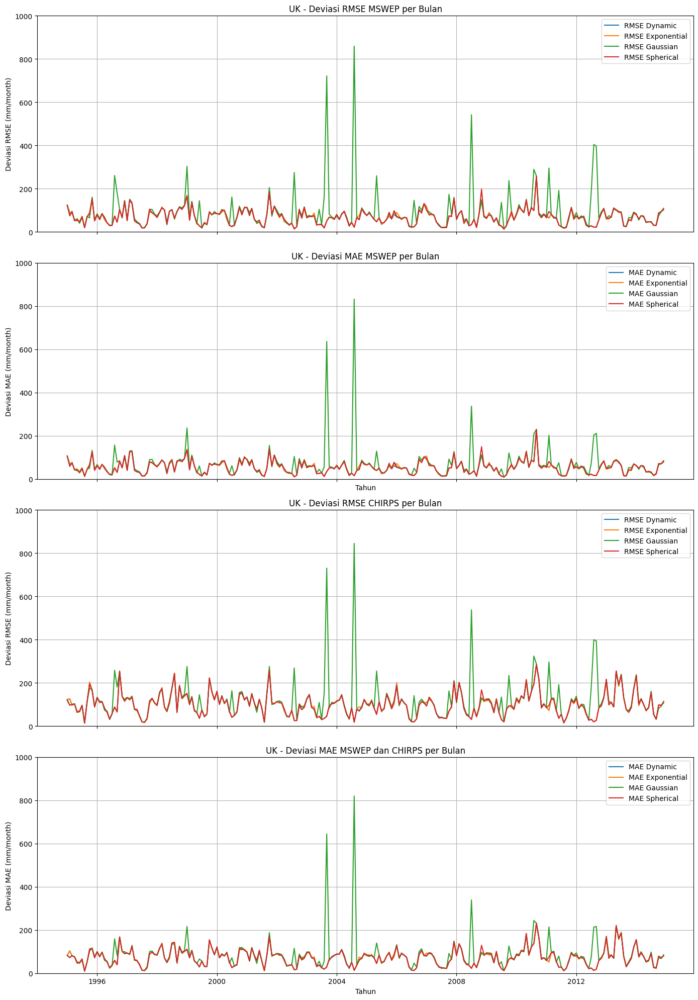

In [52]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Create a datetime column from year and month if not already present
dy_metrics['date'] = pd.to_datetime(dy_metrics[['year', 'month']].assign(day=1))
ex_metrics['date'] = pd.to_datetime(ex_metrics[['year', 'month']].assign(day=1))
ga_metrics['date'] = pd.to_datetime(ga_metrics[['year', 'month']].assign(day=1))
sp_metrics['date'] = pd.to_datetime(sp_metrics[['year', 'month']].assign(day=1))

fig, axs = plt.subplots(4, 1, figsize=(14, 20), sharex=True)

# Subplot 1: RMSE MSWEP
axs[0].plot(dy_metrics['date'], dy_metrics['mswep_rmse'], label='RMSE Dynamic')
axs[0].plot(ex_metrics['date'], ex_metrics['mswep_rmse'], label='RMSE Exponential')
axs[0].plot(ga_metrics['date'], ga_metrics['mswep_rmse'], label='RMSE Gaussian')
axs[0].plot(sp_metrics['date'], sp_metrics['mswep_rmse'], label='RMSE Spherical')
axs[0].set_title('UK - Deviasi RMSE MSWEP per Bulan')
axs[0].set_ylabel('Deviasi RMSE (mm/month)')
axs[0].set_ylim(0, 1000)
axs[0].legend()
axs[0].grid(True)
axs[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Subplot 2: MAE MSWEP
axs[1].plot(dy_metrics['date'], dy_metrics['mswep_mae'], label='MAE Dynamic')
axs[1].plot(ex_metrics['date'], ex_metrics['mswep_mae'], label='MAE Exponential')
axs[1].plot(ga_metrics['date'], ga_metrics['mswep_mae'], label='MAE Gaussian')
axs[1].plot(sp_metrics['date'], sp_metrics['mswep_mae'], label='MAE Spherical')
axs[1].set_title('UK - Deviasi MAE MSWEP per Bulan')
axs[1].set_xlabel('Tahun')
axs[1].set_ylabel('Deviasi MAE (mm/month)')
axs[1].set_ylim(0, 1000)
axs[1].legend()
axs[1].grid(True)

# Subplot 1: RMSE CHIRPS
axs[2].plot(dy_metrics['date'], dy_metrics['chirps_rmse'], label='RMSE Dynamic')
axs[2].plot(ex_metrics['date'], ex_metrics['chirps_rmse'], label='RMSE Exponential')
axs[2].plot(ga_metrics['date'], ga_metrics['chirps_rmse'], label='RMSE Gaussian')
axs[2].plot(sp_metrics['date'], sp_metrics['chirps_rmse'], label='RMSE Spherical')
axs[2].set_title('UK - Deviasi RMSE CHIRPS per Bulan')
axs[2].set_ylabel('Deviasi RMSE (mm/month)')
axs[2].set_ylim(0, 1000)
axs[2].legend()
axs[2].grid(True)

# Subplot 2: MAE CHIRPS
axs[3].plot(dy_metrics['date'], dy_metrics['chirps_mae'], label='MAE Dynamic')
axs[3].plot(ex_metrics['date'], ex_metrics['chirps_mae'], label='MAE Exponential')
axs[3].plot(ga_metrics['date'], ga_metrics['chirps_mae'], label='MAE Gaussian')
axs[3].plot(sp_metrics['date'], sp_metrics['chirps_mae'], label='MAE Spherical')
axs[3].set_title('UK - Deviasi MAE MSWEP dan CHIRPS per Bulan')
axs[3].set_xlabel('Tahun')
axs[3].set_ylabel('Deviasi MAE (mm/month)')
axs[3].set_ylim(0, 1000)
axs[3].legend()
axs[3].grid(True)
axs[3].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.tight_layout()
plt.show()